
=== GWO: Extended Problem (No Intersection, Curvature) ===


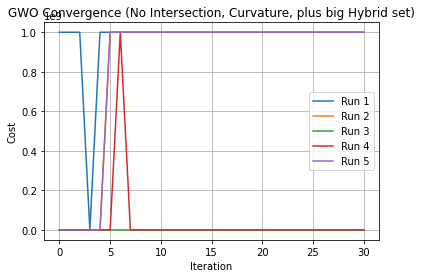


=== GWO ===
Final Costs: [1000000147.8718401, 1000000155.4862312, 152.4954113425178, 159.7026502236918, 1000000169.0938711]
Min: 152.4954
Max: 1000000169.0939
Mean: 600000156.9300
Std: 489897949.2351

=== GA: Extended Problem (No Intersection, Curvature) ===


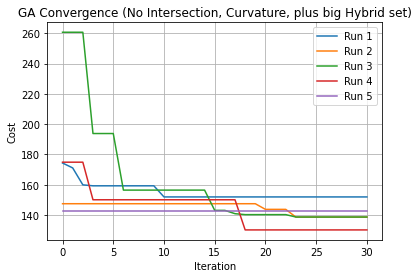


=== GA ===
Final Costs: [151.95693628131477, 138.64231578073847, 138.70738650785617, 130.19230002764067, 142.55410759624817]
Min: 130.1923
Max: 151.9569
Mean: 140.4106
Std: 7.0478

=== PSO: Extended Problem (No Intersection, Curvature) ===


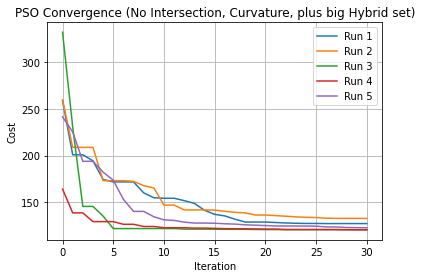


=== PSO ===
Final Costs: [127.24961983510784, 132.75322510212158, 120.75729927947576, 120.45298349197148, 122.73334016441811]
Min: 120.4530
Max: 132.7532
Mean: 124.7893
Std: 4.6640

=== SA: Extended Problem (No Intersection, Curvature) ===


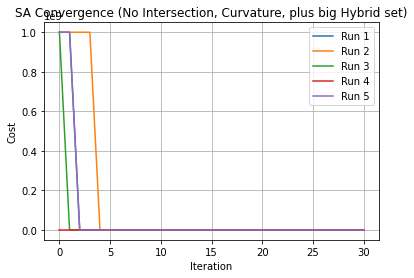


=== SA ===
Final Costs: [150.78343940148932, 159.7019928899144, 166.15830003994233, 154.7023528373069, 179.46429155536416]
Min: 150.7834
Max: 179.4643
Mean: 162.1621
Std: 10.0649

=== ABC: Extended Problem (No Intersection, Curvature) ===


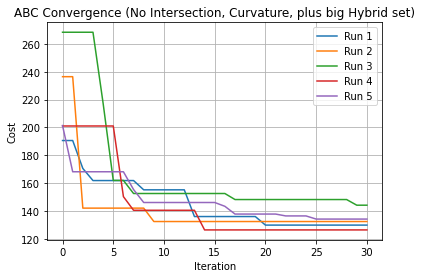


=== ABC ===
Final Costs: [129.83688008462283, 132.40328644564525, 144.13451530329655, 126.38011375777808, 134.16473772204193]
Min: 126.3801
Max: 144.1345
Mean: 133.3839
Std: 5.9797

=== CSOA: Extended Problem (No Intersection, Curvature) ===


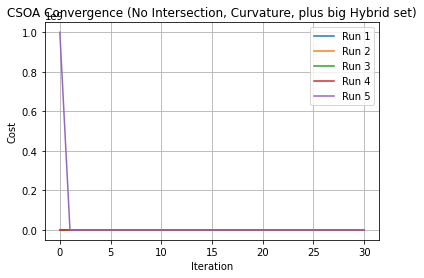


=== CSOA ===
Final Costs: [136.1760498170383, 144.98018232339257, 139.73986531061, 139.07127682288336, 162.71550309302603]
Min: 136.1760
Max: 162.7155
Mean: 144.5366
Std: 9.5231

=== CSA: Extended Problem (No Intersection, Curvature) ===


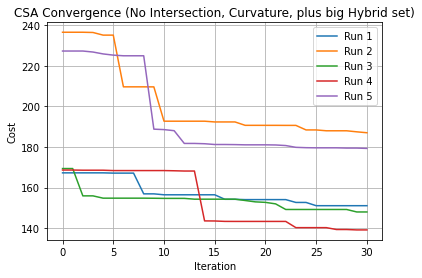


=== CSA ===
Final Costs: [151.03201513794625, 187.04379647091594, 147.9392612666091, 139.07697509309406, 179.30941131975698]
Min: 139.0770
Max: 187.0438
Mean: 160.8803
Std: 18.7830

=== BAS: Extended Problem (No Intersection, Curvature) ===


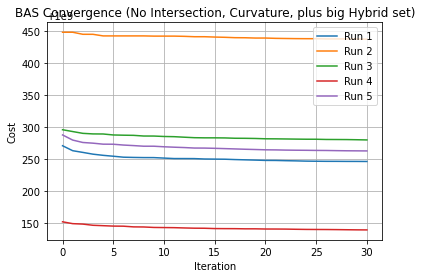


=== BAS ===
Final Costs: [1000000246.8602283, 1000000437.9593259, 1000000280.5132127, 1000000139.9061971, 1000000263.3419712]
Min: 1000000139.9062
Max: 1000000437.9593
Mean: 1000000273.7162
Std: 95.6619

=== TLBO: Extended Problem (No Intersection, Curvature) ===


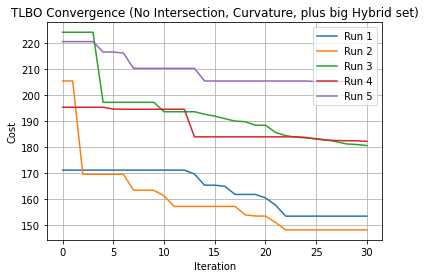


=== TLBO ===
Final Costs: [153.33204307069715, 148.0282023995815, 180.49260247807376, 182.111127917414, 205.09916620973914]
Min: 148.0282
Max: 205.0992
Mean: 173.8126
Std: 20.8644

=== FA: Extended Problem (No Intersection, Curvature) ===


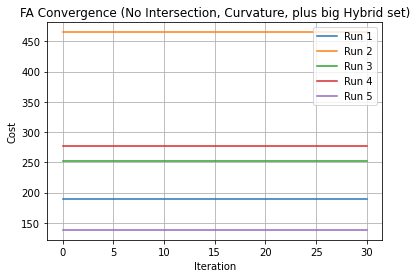


=== FA ===
Final Costs: [188.73294276906336, 465.0737315661723, 251.93857551427527, 277.7064589068277, 138.22399567684164]
Min: 138.2240
Max: 465.0737
Mean: 264.3351
Std: 111.5779

=== ACO: Extended Problem (No Intersection, Curvature) ===


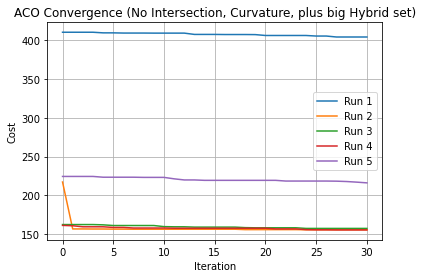


=== ACO ===
Final Costs: [403.7644911366872, 155.88013041627238, 157.62848185989873, 155.70300532457196, 216.20753154876655]
Min: 155.7030
Max: 403.7645
Mean: 217.8367
Std: 95.8082

=== DE: Extended Problem (No Intersection, Curvature) ===


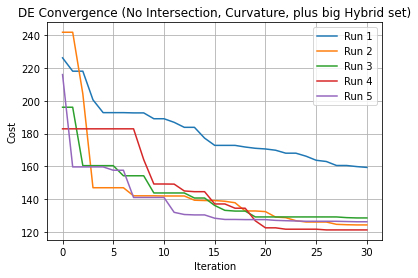


=== DE ===
Final Costs: [159.3910780727948, 124.38015650412922, 128.63060372654851, 121.33705541987032, 126.30460782434213]
Min: 121.3371
Max: 159.3911
Mean: 132.0087
Std: 13.8984

=== Ultimate: Extended Problem (No Intersection, Curvature) ===


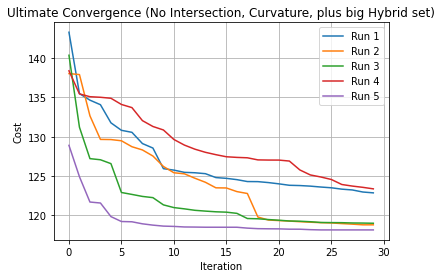


=== Ultimate ===
Final Costs: [122.87135691738388, 118.81352473840514, 119.01192057089683, 123.38100793543911, 118.1650917538791]
Min: 118.1651
Max: 123.3810
Mean: 120.4486
Std: 2.2100


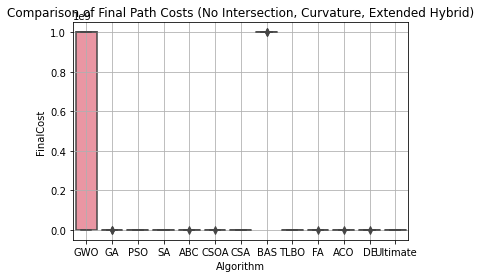

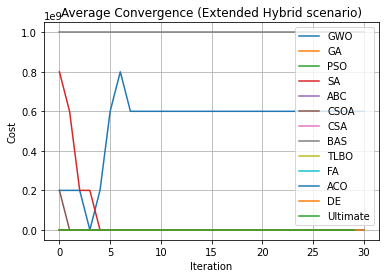


Animating best paths for all algorithms + UltimateHybrid.
Avg iteration time over frames: nan seconds/frame


/Users/gokturkdede/opt/anaconda3/lib/python3.9/site-packages/numpy/core/fromnumeric.py:3419: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/Users/gokturkdede/opt/anaconda3/lib/python3.9/site-packages/numpy/core/_methods.py:188: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


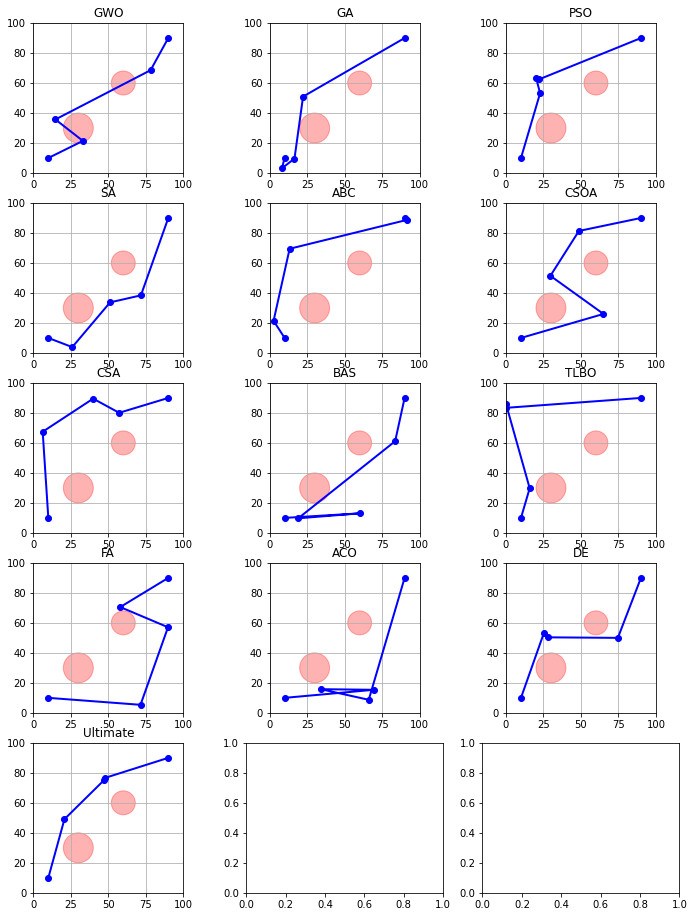

In [3]:
###############################################################################
# 0) JUPYTER NOTEBOOK SETUP
###############################################################################
# Choose a backend that supports inline animations. If "inline" doesn't work,
# try '%matplotlib notebook' or '%matplotlib ipympl'.
%matplotlib inline

import numpy as np
import random
import time
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.animation as animation
import seaborn as sns
from IPython.display import HTML

###############################################################################
# 1) GLOBAL SETTINGS
###############################################################################
NUM_RUNS       = 5       # how many times each algorithm is run
MAX_ITERS      = 30      # how many iterations each run
N_WAYPOINTS    = 5       # total waypoints in the path
START_POINT    = (10,10)
END_POINT      = (90,90)

# Obstacles: list of circles (x_center, y_center, radius)
OBSTACLES = [
    (30,30, 10),
    (60,60, 8)
]

# For reproducibility
random.seed(42)
np.random.seed(42)

###############################################################################
# 2) OBSTACLE / CURVATURE UTILS
###############################################################################
def segment_intersects_circle(p1, p2, center, radius):
    """
    Check if line segment p1->p2 intersects circle (center, radius).
    """
    p1= np.array(p1,dtype=float)
    p2= np.array(p2,dtype=float)
    c= np.array(center,dtype=float)

    seg_vec= p2-p1
    seg_len= np.linalg.norm(seg_vec)
    if seg_len<1e-12:
        # degenerate segment
        dist= np.linalg.norm(p1-c)
        return dist<= radius

    dir_vec= seg_vec/ seg_len
    f= p1- c
    t= -np.dot(f, dir_vec)
    if t<0:
        closest= p1
    elif t> seg_len:
        closest= p2
    else:
        closest= p1+ dir_vec* t
    dist_closest= np.linalg.norm(closest- c)
    return (dist_closest<= radius)

def path_intersects_obstacles(path):
    """
    Check each segment for collisions with OBSTACLES.
    If any intersection => return True
    """
    for i in range(len(path)-1):
        p1= path[i]
        p2= path[i+1]
        for (xc,yc,r) in OBSTACLES:
            if segment_intersects_circle(p1,p2,(xc,yc),r):
                return True
    return False

def clip_path(path):
    """
    Fix start/end, clip interior to [0..100].
    """
    path[0,0], path[0,1]= START_POINT
    path[-1,0], path[-1,1]= END_POINT
    for i in range(1, N_WAYPOINTS-1):
        path[i,0]= np.clip(path[i,0],0,100)
        path[i,1]= np.clip(path[i,1],0,100)
    return path

###############################################################################
# 3) COST FUNCTION
###############################################################################
def path_cost_function(path):
    """
    1) Summation of distances between consecutive waypoints.
    2) If any segment intersects an obstacle => add huge penalty 1e9
    3) Curvature penalty if angle < 30 deg => +200
    """
    dist_sum= 0.0
    for i in range(len(path)-1):
        dist_sum+= np.linalg.norm(path[i+1]- path[i])

    cost= dist_sum
    # collision check
    if path_intersects_obstacles(path):
        cost+= 1e9

    # curvature penalty
    angle_thresh= np.deg2rad(30)
    for i in range(1,len(path)-1):
        v1= path[i]-path[i-1]
        v2= path[i+1]- path[i]
        norm1= np.linalg.norm(v1)
        norm2= np.linalg.norm(v2)
        if norm1>1e-9 and norm2>1e-9:
            dot= np.dot(v1,v2)
            cos_th= dot/(norm1*norm2)
            cos_th= np.clip(cos_th, -1,1)
            angle= np.arccos(cos_th)
            if angle< angle_thresh:
                cost+= 200
    return cost

def create_random_path():
    path= []
    path.append([START_POINT[0], START_POINT[1]])
    for _ in range(N_WAYPOINTS-2):
        x= random.uniform(0,100)
        y= random.uniform(0,100)
        path.append([x,y])
    path.append([END_POINT[0], END_POINT[1]])
    return np.array(path, dtype=float)

###############################################################################
# 4) META-HEURISTICS
#    We define GWO, GA, PSO, SA, ABC, plus the new ones:
#    CSOA, CSA, BAS, TLBO, FA, ACO, DE
###############################################################################

###########################
# 4.1 GWO (already shown)
###########################
class GWO:
    def __init__(self, pop_size=10):
        self.pop_size= pop_size
        self.paths= [create_random_path() for _ in range(pop_size)]
        self.fitness= [float('inf')]* pop_size
        self.alpha_path= None
        self.alpha_fit= float('inf')
        self.beta_path= None
        self.beta_fit= float('inf')
        self.delta_path=None
        self.delta_fit= float('inf')

    def update_leaders(self):
        idxs= np.argsort(self.fitness)
        self.alpha_path= self.paths[idxs[0]].copy()
        self.alpha_fit= self.fitness[idxs[0]]
        if self.pop_size>1:
            self.beta_path= self.paths[idxs[1]].copy()
            self.beta_fit= self.fitness[idxs[1]]
        if self.pop_size>2:
            self.delta_path= self.paths[idxs[2]].copy()
            self.delta_fit= self.fitness[idxs[2]]

    def optimize(self, max_iter=1):
        cost_log=[]
        # evaluate if needed
        for i in range(self.pop_size):
            if np.isinf(self.fitness[i]):
                self.fitness[i]= path_cost_function(self.paths[i])
        self.update_leaders()
        cost_log.append(self.alpha_fit)

        for it in range(max_iter):
            a= 2- 2*((it+1)/max_iter)
            if a<0: a=0
            for i in range(self.pop_size):
                wolf= self.paths[i].copy()
                for w in range(1,N_WAYPOINTS-1):
                    for leader_path in [self.alpha_path,self.beta_path,self.delta_path]:
                        if leader_path is None: continue
                        r1,r2= np.random.rand(), np.random.rand()
                        A= 2*a*r1 - a
                        C= 2*r2
                        D= np.abs(C* leader_path[w]- wolf[w])
                        wolf[w]= leader_path[w]- A*D
                wolf= clip_path(wolf)
                c= path_cost_function(wolf)
                self.paths[i]= wolf
                self.fitness[i]= c
            self.update_leaders()
            cost_log.append(self.alpha_fit)
        return cost_log, self.alpha_path, self.alpha_fit

###########################
# 4.2 GA (already shown)
###########################
class GWO:
    def __init__(self, pop_size=10):
        self.pop_size= pop_size
        self.paths= [create_random_path() for _ in range(pop_size)]
        self.fitness= [float('inf')]* pop_size
        self.alpha_path= None
        self.alpha_fit= float('inf')
        self.beta_path= None
        self.beta_fit= float('inf')
        self.delta_path=None
        self.delta_fit= float('inf')

    def update_leaders(self):
        idxs= np.argsort(self.fitness)
        self.alpha_path= self.paths[idxs[0]].copy()
        self.alpha_fit= self.fitness[idxs[0]]
        if self.pop_size>1:
            self.beta_path= self.paths[idxs[1]].copy()
            self.beta_fit= self.fitness[idxs[1]]
        if self.pop_size>2:
            self.delta_path= self.paths[idxs[2]].copy()
            self.delta_fit= self.fitness[idxs[2]]

    def optimize(self, max_iter=1):
        cost_log=[]
        for i in range(self.pop_size):
            if np.isinf(self.fitness[i]):
                c= path_cost_function(self.paths[i])
                self.fitness[i]= c
        self.update_leaders()
        cost_log.append(self.alpha_fit)

        for it in range(max_iter):
            a= 2- 2*((it+1)/max_iter)
            if a<0: a=0
            for i in range(self.pop_size):
                wolf= self.paths[i].copy()
                for w in range(1,N_WAYPOINTS-1):
                    for leader_path in [self.alpha_path,self.beta_path,self.delta_path]:
                        if leader_path is None: continue
                        r1,r2= np.random.rand(), np.random.rand()
                        A= 2*a*r1 - a
                        C= 2*r2
                        D= np.abs(C* leader_path[w]-wolf[w])
                        wolf[w]= leader_path[w]- A*D
                wolf= clip_path(wolf)
                cost= path_cost_function(wolf)
                self.paths[i]= wolf
                self.fitness[i]= cost
            self.update_leaders()
            cost_log.append(self.alpha_fit)
        return cost_log, self.alpha_path, self.alpha_fit


class GA:
    def __init__(self, pop_size=10, cr=0.8, mr=0.1):
        self.pop_size= pop_size
        self.cr= cr
        self.mr= mr
        self.population= [create_random_path() for _ in range(pop_size)]
        self.fitness= [float('inf')]* pop_size
        self.best_path= None
        self.best_fit= float('inf')

    def crossover(self, p1, p2):
        if random.random()< self.cr and (N_WAYPOINTS>2):
            idx= random.randint(1,N_WAYPOINTS-2)
            o1= np.vstack([p1[:idx], p2[idx:]])
            o2= np.vstack([p2[:idx], p1[idx:]])
            return o1, o2
        return p1.copy(), p2.copy()

    def mutate(self, path):
        mp= path.copy()
        for w in range(1, N_WAYPOINTS-1):
            if random.random()< self.mr:
                mp[w,0]= random.uniform(0,100)
                mp[w,1]= random.uniform(0,100)
        mp= clip_path(mp)
        return mp

    def optimize(self, max_iter=1):
        cost_log=[]
        for i in range(self.pop_size):
            if np.isinf(self.fitness[i]):
                c= path_cost_function(self.population[i])
                self.fitness[i]= c
                if c< self.best_fit:
                    self.best_fit= c
                    self.best_path= self.population[i].copy()
        cost_log.append(self.best_fit)
        for it in range(max_iter):
            new_pop=[]
            best_idx= np.argmin(self.fitness)
            new_pop.append(self.population[best_idx].copy())
            while len(new_pop)< self.pop_size:
                i1= random.randint(0,self.pop_size-1)
                i2= random.randint(0,self.pop_size-1)
                o1,o2= self.crossover(self.population[i1], self.population[i2])
                o1= self.mutate(o1)
                o2= self.mutate(o2)
                new_pop.append(o1)
                if len(new_pop)< self.pop_size:
                    new_pop.append(o2)
            self.population= new_pop
            self.fitness= [path_cost_function(p) for p in new_pop]
            idx= np.argmin(self.fitness)
            if self.fitness[idx]< self.best_fit:
                self.best_fit= self.fitness[idx]
                self.best_path= self.population[idx].copy()
            cost_log.append(self.best_fit)
        return cost_log, self.best_path, self.best_fit


class PSO:
    def __init__(self, pop_size=10, w=0.5, c1=1.0, c2=1.0):
        self.pop_size= pop_size
        self.w= w
        self.c1= c1
        self.c2= c2
        self.positions= [create_random_path() for _ in range(pop_size)]
        self.vels= [np.zeros((N_WAYPOINTS,2)) for _ in range(pop_size)]
        self.fitness= [float('inf')]* pop_size
        self.pbest= [p.copy() for p in self.positions]
        self.pbest_fit= [float('inf')]* pop_size
        self.gbest= None
        self.gbest_fit= float('inf')

    def update_gbest(self):
        idx= np.argmin(self.fitness)
        if self.fitness[idx]< self.gbest_fit:
            self.gbest_fit= self.fitness[idx]
            self.gbest= self.positions[idx].copy()

    def optimize(self, max_iter=1):
        cost_log=[]
        # evaluate if needed
        for i in range(self.pop_size):
            if np.isinf(self.fitness[i]):
                c= path_cost_function(self.positions[i])
                self.fitness[i]= c
                self.pbest_fit[i]= c
                self.pbest[i]= self.positions[i].copy()
                if c< self.gbest_fit:
                    self.gbest_fit= c
                    self.gbest= self.positions[i].copy()
        cost_log.append(self.gbest_fit)

        for it in range(max_iter):
            for i in range(self.pop_size):
                for w in range(1,N_WAYPOINTS-1):
                    r1,r2= np.random.rand(), np.random.rand()
                    inertia= self.w*self.vels[i][w]
                    cog= self.c1*r1*(self.pbest[i][w]- self.positions[i][w])
                    soc= self.c2*r2*(self.gbest[w]     - self.positions[i][w])
                    new_vel= inertia + cog + soc
                    new_pos= self.positions[i][w]+ new_vel
                    new_pos= np.clip(new_pos, 0,100)
                    self.vels[i][w]= new_vel
                    self.positions[i][w]= new_pos
                c= path_cost_function(self.positions[i])
                self.fitness[i]= c
                if c< self.pbest_fit[i]:
                    self.pbest_fit[i]= c
                    self.pbest[i]= self.positions[i].copy()
            self.update_gbest()
            cost_log.append(self.gbest_fit)
        return cost_log, self.gbest, self.gbest_fit


class SA:
    def __init__(self, init_temp=1000, alpha=0.9):
        self.init_temp= init_temp
        self.alpha= alpha
        self.path= create_random_path()
        self.cost= float('inf')
        self.best_path= None
        self.best_cost= float('inf')
        self.T= init_temp

    def optimize(self, max_iter=1):
        cost_log=[]
        if np.isinf(self.cost):
            self.cost= path_cost_function(self.path)
            self.best_cost= self.cost
            self.best_path= self.path.copy()
        cost_log.append(self.best_cost)

        for it in range(max_iter):
            npath= self.path.copy()
            if N_WAYPOINTS>2:
                w= random.randint(1,N_WAYPOINTS-2)
                npath[w,0]= random.uniform(0,100)
                npath[w,1]= random.uniform(0,100)
            npath= clip_path(npath)
            c= path_cost_function(npath)
            delta= c- self.cost
            if delta<0:
                self.path= npath
                self.cost= c
            else:
                prob= np.exp(-delta/self.T)
                if random.random()< prob:
                    self.path= npath
                    self.cost= c
            if self.cost< self.best_cost:
                self.best_cost= self.cost
                self.best_path= self.path.copy()
            self.T*= self.alpha
            cost_log.append(self.best_cost)

        return cost_log, self.best_path, self.best_cost

class ABC:
    def __init__(self, pop_size=10, limit=5):
        self.pop_size= pop_size
        self.limit= limit
        self.foods= [create_random_path() for _ in range(pop_size)]
        self.fitness= [float('inf')]* pop_size
        self.trials= [0]* pop_size
        self.best_path= None
        self.best_cost= float('inf')

    def optimize(self, max_iter=1):
        cost_log=[]
        for i in range(self.pop_size):
            if np.isinf(self.fitness[i]):
                c= path_cost_function(self.foods[i])
                self.fitness[i]= c
                if c< self.best_cost:
                    self.best_cost= c
                    self.best_path= self.foods[i].copy()
        cost_log.append(self.best_cost)

        for it in range(max_iter):
            # employed
            for i in range(self.pop_size):
                cand= self.foods[i].copy()
                if N_WAYPOINTS>2:
                    w= random.randint(1,N_WAYPOINTS-2)
                    cand[w,0]= random.uniform(0,100)
                    cand[w,1]= random.uniform(0,100)
                cand= clip_path(cand)
                c= path_cost_function(cand)
                if c< self.fitness[i]:
                    self.foods[i]= cand
                    self.fitness[i]= c
                    self.trials[i]=0
                else:
                    self.trials[i]+=1
                if c< self.best_cost:
                    self.best_cost= c
                    self.best_path= cand.copy()
            # scout
            for i in range(self.pop_size):
                if self.trials[i]> self.limit:
                    self.foods[i]= create_random_path()
                    c= path_cost_function(self.foods[i])
                    self.fitness[i]= c
                    self.trials[i]=0
                    if c< self.best_cost:
                        self.best_cost= c
                        self.best_path= self.foods[i].copy()
            cost_log.append(self.best_cost)
        return cost_log, self.best_path, self.best_cost



###############################################################################
# 4.6 Cat Swarm Optimization (CSOA) [Simplified]
###############################################################################
class CSOA:
    """
    Very simplified Cat Swarm for demonstration:
    - We treat each path as 'position'
    - 'Seeking mode': randomly perturb interior waypoints
    - 'Tracing mode': small velocity-like updates
    """
    def __init__(self, pop_size=10):
        self.pop_size= pop_size
        self.paths= [create_random_path() for _ in range(pop_size)]
        self.fitness= [float('inf')]* pop_size
        self.vels= [np.zeros((N_WAYPOINTS,2)) for _ in range(pop_size)]
        self.best_path= None
        self.best_fit= float('inf')

    def optimize(self, max_iter=1):
        cost_log=[]
        # Evaluate if needed
        for i in range(self.pop_size):
            if np.isinf(self.fitness[i]):
                self.fitness[i]= path_cost_function(self.paths[i])
                if self.fitness[i]< self.best_fit:
                    self.best_fit= self.fitness[i]
                    self.best_path= self.paths[i].copy()
        cost_log.append(self.best_fit)

        for it in range(max_iter):
            # for demonstration, half cats in 'seeking mode', half in 'tracing mode'
            half_pop= self.pop_size//2
            # seeking mode
            for i in range(half_pop):
                new_path= self.paths[i].copy()
                for w in range(1, N_WAYPOINTS-1):
                    if random.random()< 0.5:
                        new_path[w,0]= random.uniform(0,100)
                        new_path[w,1]= random.uniform(0,100)
                new_path= clip_path(new_path)
                c= path_cost_function(new_path)
                if c< self.fitness[i]:
                    self.paths[i]= new_path
                    self.fitness[i]= c
            # tracing mode
            for i in range(half_pop, self.pop_size):
                for w in range(1,N_WAYPOINTS-1):
                    r= random.random()
                    self.vels[i][w]+= 0.1*r*(self.best_path[w]- self.paths[i][w])
                    self.paths[i][w]+= self.vels[i][w]
                self.paths[i]= clip_path(self.paths[i])
                c= path_cost_function(self.paths[i])
                self.fitness[i]= c

            # update global best
            for i in range(self.pop_size):
                if self.fitness[i]< self.best_fit:
                    self.best_fit= self.fitness[i]
                    self.best_path= self.paths[i].copy()
            cost_log.append(self.best_fit)

        return cost_log, self.best_path, self.best_fit

###############################################################################
# 4.7 Cuckoo Search Algorithm (CSA) [Simplified]
###############################################################################
class CSA:
    """
    Basic idea: a few "nests" (paths). Each iteration we produce new solutions (eggs),
    do Levy flight or random mutation, keep best.
    """
    def __init__(self, pop_size=10):
        self.pop_size= pop_size
        self.paths= [create_random_path() for _ in range(pop_size)]
        self.fitness=[float('inf')]* pop_size
        self.best_path=None
        self.best_fit= float('inf')

    def levy_mutation(self, path):
        # simple random interior waypoint offset
        npath= path.copy()
        for w in range(1,N_WAYPOINTS-1):
            if random.random()< 0.5:
                step= np.random.standard_cauchy(size=(2,))*0.1
                npath[w]+= step
        npath= clip_path(npath)
        return npath

    def optimize(self, max_iter=1):
        cost_log=[]
        # evaluate
        for i in range(self.pop_size):
            if np.isinf(self.fitness[i]):
                c= path_cost_function(self.paths[i])
                self.fitness[i]= c
                if c< self.best_fit:
                    self.best_fit= c
                    self.best_path= self.paths[i].copy()
        cost_log.append(self.best_fit)

        for it in range(max_iter):
            for i in range(self.pop_size):
                new_path= self.levy_mutation(self.paths[i])
                c= path_cost_function(new_path)
                if c< self.fitness[i]:
                    self.paths[i]= new_path
                    self.fitness[i]= c
            # discard worst nest
            idx_worst= np.argmax(self.fitness)
            self.paths[idx_worst]= create_random_path()
            self.fitness[idx_worst]= path_cost_function(self.paths[idx_worst])
            # update best
            for i in range(self.pop_size):
                if self.fitness[i]< self.best_fit:
                    self.best_fit= self.fitness[i]
                    self.best_path= self.paths[i].copy()
            cost_log.append(self.best_fit)
        return cost_log, self.best_path, self.best_fit

###############################################################################
# 4.8 Beetle Antennae Search (BAS) [Simplified]
###############################################################################
class BAS:
    """
    For demonstration: random direction-based local search around best found.
    """
    def __init__(self):
        self.path= create_random_path()
        self.cost= float('inf')
        self.best_path= None
        self.best_cost= float('inf')

    def optimize(self, max_iter=1):
        cost_log=[]
        if np.isinf(self.cost):
            self.cost= path_cost_function(self.path)
            self.best_cost= self.cost
            self.best_path= self.path.copy()
        cost_log.append(self.best_cost)

        for it in range(max_iter):
            step= 5.0/(it+1)  # decreasing step
            # pick a random direction
            if N_WAYPOINTS>2:
                w= random.randint(1,N_WAYPOINTS-2)
                direction= np.random.randn(2)
                direction= direction/ (np.linalg.norm(direction)+1e-9)
                path_plus= self.path.copy()
                path_minus= self.path.copy()
                path_plus[w]+= direction* step
                path_minus[w]-= direction* step
                path_plus= clip_path(path_plus)
                path_minus= clip_path(path_minus)
                cost_plus= path_cost_function(path_plus)
                cost_minus= path_cost_function(path_minus)
                if cost_plus< cost_minus:
                    if cost_plus< self.best_cost:
                        self.best_cost= cost_plus
                        self.best_path= path_plus.copy()
                    self.path= path_plus
                    self.cost= cost_plus
                else:
                    if cost_minus< self.best_cost:
                        self.best_cost= cost_minus
                        self.best_path= path_minus.copy()
                    self.path= path_minus
                    self.cost= cost_minus
            cost_log.append(self.best_cost)
        return cost_log, self.best_path, self.best_cost

###############################################################################
# 4.9 Teaching-Learning-Based Optimization (TLBO) [Simplified]
###############################################################################
class TLBO:
    """
    Class of students (paths).
    Teacher phase => best teaches others.
    Learner phase => pairwise improvement.
    """
    def __init__(self, pop_size=10):
        self.pop_size= pop_size
        self.paths= [create_random_path() for _ in range(pop_size)]
        self.fitness=[float('inf')]* pop_size
        self.best_path=None
        self.best_cost= float('inf')

    def optimize(self, max_iter=1):
        cost_log=[]
        # Evaluate if needed
        for i in range(self.pop_size):
            if np.isinf(self.fitness[i]):
                c= path_cost_function(self.paths[i])
                self.fitness[i]= c
                if c< self.best_cost:
                    self.best_cost= c
                    self.best_path= self.paths[i].copy()
        cost_log.append(self.best_cost)

        for it in range(max_iter):
            # Teacher phase
            idx_best= np.argmin(self.fitness)
            teacher= self.paths[idx_best].copy()
            for i in range(self.pop_size):
                if i== idx_best: continue
                new_path= self.paths[i].copy()
                # shift interior waypoints slightly toward teacher
                for w in range(1, N_WAYPOINTS-1):
                    new_path[w]+= 0.1*(teacher[w]- self.paths[i][w])*random.random()
                new_path= clip_path(new_path)
                c= path_cost_function(new_path)
                if c< self.fitness[i]:
                    self.paths[i]= new_path
                    self.fitness[i]= c

            # Learner phase
            for i in range(self.pop_size):
                partner_idx= random.randint(0,self.pop_size-1)
                if partner_idx== i: continue
                if self.fitness[partner_idx]< self.fitness[i]:
                    # move i toward partner
                    newp= self.paths[i].copy()
                    for w in range(1,N_WAYPOINTS-1):
                        newp[w]+= 0.1*(self.paths[partner_idx][w]- self.paths[i][w])*random.random()
                    newp= clip_path(newp)
                    c= path_cost_function(newp)
                    if c< self.fitness[i]:
                        self.paths[i]= newp
                        self.fitness[i]= c
                else:
                    # move i away from partner
                    newp= self.paths[i].copy()
                    for w in range(1,N_WAYPOINTS-1):
                        newp[w]+= 0.1*(self.paths[i][w]- self.paths[partner_idx][w])*random.random()
                    newp= clip_path(newp)
                    c= path_cost_function(newp)
                    if c< self.fitness[i]:
                        self.paths[i]= newp
                        self.fitness[i]= c

            # update best
            for i in range(self.pop_size):
                if self.fitness[i]< self.best_cost:
                    self.best_cost= self.fitness[i]
                    self.best_path= self.paths[i].copy()
            cost_log.append(self.best_cost)
        return cost_log, self.best_path, self.best_cost

###############################################################################
# 4.10 Firefly Algorithm (FA) [Simplified]
###############################################################################
class FA:
    def __init__(self, pop_size=10, beta0=1.0, alpha=0.2, gamma=1.0):
        self.pop_size= pop_size
        self.beta0= beta0
        self.alpha= alpha
        self.gamma= gamma
        self.paths= [create_random_path() for _ in range(pop_size)]
        self.fitness=[float('inf')]* pop_size
        self.best_path=None
        self.best_cost=float('inf')

    def distance(self, p1, p2):
        return np.sum((p1-p2)**2)**0.5

    def optimize(self, max_iter=1):
        cost_log=[]
        # evaluate
        for i in range(self.pop_size):
            if np.isinf(self.fitness[i]):
                c= path_cost_function(self.paths[i])
                self.fitness[i]= c
                if c< self.best_cost:
                    self.best_cost= c
                    self.best_path= self.paths[i].copy()
        cost_log.append(self.best_cost)

        for it in range(max_iter):
            for i in range(self.pop_size):
                for j in range(self.pop_size):
                    if self.fitness[j]< self.fitness[i]:
                        dist= self.distance(self.paths[i], self.paths[j])
                        beta= self.beta0* np.exp(-self.gamma* dist**2)
                        # move i toward j
                        new_path= self.paths[i].copy()
                        for w in range(1,N_WAYPOINTS-1):
                            new_path[w]+= beta*(self.paths[j][w]- self.paths[i][w]) + self.alpha*(np.random.rand(2)-0.5)
                        new_path= clip_path(new_path)
                        c= path_cost_function(new_path)
                        if c< self.fitness[i]:
                            self.paths[i]= new_path
                            self.fitness[i]= c
            # update best
            for i in range(self.pop_size):
                if self.fitness[i]< self.best_cost:
                    self.best_cost= self.fitness[i]
                    self.best_path= self.paths[i].copy()
            cost_log.append(self.best_cost)

        return cost_log, self.best_path,self.best_cost

###############################################################################
# 4.11 Ant Colony Optimization (ACO) [Adapted to continuous path - very simplified]
###############################################################################
class ACO:
    """
    A very simplified 'continuous' ACO approach:
    - We keep multiple 'ants' as candidate paths.
    - Evaporation => random small changes
    - 'pheromone update' => keep best
    """
    def __init__(self, pop_size=10):
        self.pop_size= pop_size
        self.paths= [create_random_path() for _ in range(pop_size)]
        self.fitness=[float('inf')]*pop_size
        self.best_path=None
        self.best_cost=float('inf')

    def optimize(self, max_iter=1):
        cost_log=[]
        for i in range(self.pop_size):
            if np.isinf(self.fitness[i]):
                c= path_cost_function(self.paths[i])
                self.fitness[i]= c
                if c< self.best_cost:
                    self.best_cost= c
                    self.best_path= self.paths[i].copy()
        cost_log.append(self.best_cost)

        for it in range(max_iter):
            # ants random small changes => 'exploration'
            for i in range(self.pop_size):
                newp= self.paths[i].copy()
                for w in range(1,N_WAYPOINTS-1):
                    if random.random()<0.3:
                        newp[w,0]+= (random.random()-0.5)*2
                        newp[w,1]+= (random.random()-0.5)*2
                newp= clip_path(newp)
                c= path_cost_function(newp)
                if c< self.fitness[i]:
                    self.paths[i]= newp
                    self.fitness[i]= c
            # global best
            for i in range(self.pop_size):
                if self.fitness[i]< self.best_cost:
                    self.best_cost= self.fitness[i]
                    self.best_path= self.paths[i].copy()
            cost_log.append(self.best_cost)

        return cost_log, self.best_path, self.best_cost

###############################################################################
# 4.12 Differential Evolution (DE) [Simplified]
###############################################################################
class DE:
    def __init__(self, pop_size=10, F=0.5, CR=0.9):
        self.pop_size= pop_size
        self.F= F
        self.CR= CR
        self.population= [create_random_path() for _ in range(pop_size)]
        self.fitness= [float('inf')]* pop_size
        self.best_path= None
        self.best_cost= float('inf')

    def optimize(self, max_iter=1):
        cost_log=[]
        # evaluate if needed
        for i in range(self.pop_size):
            if np.isinf(self.fitness[i]):
                c= path_cost_function(self.population[i])
                self.fitness[i]= c
                if c< self.best_cost:
                    self.best_cost= c
                    self.best_path= self.population[i].copy()
        cost_log.append(self.best_cost)

        for it in range(max_iter):
            for i in range(self.pop_size):
                # pick 3 distinct random indices
                idxs= list(range(self.pop_size))
                idxs.remove(i)
                a_idx, b_idx, c_idx= random.sample(idxs,3)
                target= self.population[i].copy()
                a= self.population[a_idx]
                b= self.population[b_idx]
                c= self.population[c_idx]
                mutant= a.copy()
                # mutate interior
                for w in range(1,N_WAYPOINTS-1):
                    mutant[w]+= self.F*(b[w]- c[w])
                trial= target.copy()
                # crossover
                for w in range(N_WAYPOINTS):
                    if random.random()< self.CR:
                        trial[w]= mutant[w].copy()
                trial= clip_path(trial)
                costT= path_cost_function(trial)
                if costT< self.fitness[i]:
                    self.population[i]= trial
                    self.fitness[i]= costT
                    if costT< self.best_cost:
                        self.best_cost= costT
                        self.best_path= trial.copy()
            cost_log.append(self.best_cost)
        return cost_log, self.best_path, self.best_cost

###############################################################################
# 5) A REVISED HYBRID THAT USES *ALL* ALGORITHMS
###############################################################################
class UltimateHybrid:
    """
    A 'revisionary' method that merges GWO, GA, PSO, SA, ABC, CSOA, CSA, BAS,
    TLBO, FA, ACO, DE, each iteration.
    We'll store them in a list, each 'optimize(1)', then gather top solutions, partially re-init.
    """
    def __init__(self):
        self.algos= [
            ("GWO",   GWO()),
            ("GA",    GA()),
            ("PSO",   PSO()),
            ("SA",    SA()),
            ("ABC",   ABC()),
            ("CSOA",  CSOA()),
            ("CSA",   CSA()),
            ("BAS",   BAS()),
            ("TLBO",  TLBO()),
            ("FA",    FA()),
            ("ACO",   ACO()),
            ("DE",    DE())
        ]
        self.best_path= None
        self.best_cost= float('inf')

    def optimize(self, max_iter=1):
        cost_log=[]
        for it in range(max_iter):
            # each algo does 1 iteration
            solutions=[]
            for (name,algo) in self.algos:
                c_log, path, cost= algo.optimize(1)
                solutions.append((path,cost))
            # find local best
            solutions.sort(key=lambda x:x[1])
            local_best_path, local_best_cost= solutions[0]
            if local_best_cost< self.best_cost:
                self.best_cost= local_best_cost
                self.best_path= local_best_path.copy()

            # partial re-init: take top 3 solutions, re-init worst from each algo
            top3= solutions[:3]
            best_paths= [tp[0].copy() for tp in top3]
            for (name, algo) in self.algos:
                if hasattr(algo,"paths"):
                    # find worst solutions
                    if getattr(algo,"fitness",None) is not None:
                        fitness= algo.fitness
                        paths= algo.paths
                        idx_sorted= np.argsort(fitness)[::-1]  # worst first
                        for i,bp in enumerate(best_paths):
                            if i< len(idx_sorted):
                                idx_w= idx_sorted[i]
                                paths[idx_w]= bp.copy()
                                fitness[idx_w]= path_cost_function(bp)
                                # possibly update algo's best if it has one
                                if hasattr(algo,"best_fit") and fitness[idx_w]< algo.best_fit:
                                    algo.best_fit= fitness[idx_w]
                                    algo.best_path= bp.copy()
                elif hasattr(algo,"population"):
                    # GA, DE, etc.
                    fit= algo.fitness
                    pop= algo.population
                    idx_s= np.argsort(fit)[::-1]
                    for i,bp in enumerate(best_paths):
                        if i< len(idx_s):
                            pop[idx_s[i]]= bp.copy()
                            fit[idx_s[i]]= path_cost_function(bp)
                            if hasattr(algo,"best_fit") and fit[idx_s[i]]< algo.best_fit:
                                algo.best_fit= fit[idx_s[i]]
                                algo.best_path= bp.copy()
                elif hasattr(algo,"path"):
                    # for single-solution type, e.g. BAS, SA
                    # if new best is better => adopt
                    for bp in best_paths:
                        c= path_cost_function(bp)
                        if c< getattr(algo,"cost",1e99):
                            algo.path= bp.copy()
                            algo.cost= c
                            if hasattr(algo,"best_cost") and c< algo.best_cost:
                                algo.best_cost= c
                                algo.best_path= bp.copy()

            cost_log.append(self.best_cost)
        return cost_log, self.best_path, self.best_cost

###############################################################################
# 6) MULTI-RUN, VISUAL ANALYSIS (Similar as before)
###############################################################################
def run_algorithm(algo_class, n_runs=NUM_RUNS, max_iter=MAX_ITERS):
    results=[]
    for _ in range(n_runs):
        algo= algo_class()
        c_log, b_path, b_cost= algo.optimize(max_iter)
        results.append((c_log,b_path,b_cost))
    return results

def analyze_results(algo_name, results):
    cost_logs= [r[0] for r in results]
    final_costs= [r[2] for r in results]

    plt.figure()
    for i, c_log in enumerate(cost_logs):
        plt.plot(range(len(c_log)), c_log, label=f"Run {i+1}")
    plt.title(f"{algo_name} Convergence (No Intersection, Curvature, plus big Hybrid set)")
    plt.xlabel("Iteration")
    plt.ylabel("Cost")
    plt.legend()
    plt.grid(True)
    plt.show()

    print(f"\n=== {algo_name} ===")
    print("Final Costs:", final_costs)
    print(f"Min: {min(final_costs):.4f}")
    print(f"Max: {max(final_costs):.4f}")
    print(f"Mean: {np.mean(final_costs):.4f}")
    print(f"Std: {np.std(final_costs):.4f}")

def boxplot_algorithms(algos_results):
    data=[]
    for algo, cost_list in algos_results.items():
        for c in cost_list:
            data.append([algo,c])
    df= pd.DataFrame(data, columns=["Algorithm","FinalCost"])
    plt.figure()
    sns.boxplot(x="Algorithm", y="FinalCost", data=df)
    plt.title("Comparison of Final Path Costs (No Intersection, Curvature, Extended Hybrid)")
    plt.grid(True)
    plt.show()

def avg_convergence_plot(algos_logs):
    plt.figure()
    for algo_name, logs in algos_logs.items():
        max_len= max(len(x) for x in logs)
        arr_list=[]
        for c_log in logs:
            if len(c_log)< max_len:
                c_log= c_log+[c_log[-1]]*(max_len-len(c_log))
            arr_list.append(c_log)
        arr= np.array(arr_list)
        avg_curve= np.mean(arr, axis=0)
        plt.plot(range(max_len), avg_curve, label=algo_name)
    plt.title("Average Convergence (Extended Hybrid scenario)")
    plt.xlabel("Iteration")
    plt.ylabel("Cost")
    plt.legend()
    plt.grid(True)
    plt.show()

###############################################################################
# 7) ANIMATION: Show best path for each algorithm (including new ones) + UltimateHybrid
###############################################################################
def animate_all_algorithms_paths(max_iter=20):
    """
    We'll create subplots for:
    - GWO, GA, PSO, SA, ABC
    - CSOA, CSA, BAS, TLBO, FA, ACO, DE
    - and the revisionary UltimateHybrid
    We'll do 4 rows, 3 columns => total 12 + 1 => We'll do 13 subplots (some resizing).
    """
    algo_list= [
        ("GWO",       GWO()),
        ("GA",        GA()),
        ("PSO",       PSO()),
        ("SA",        SA()),
        ("ABC",       ABC()),
        ("CSOA",      CSOA()),
        ("CSA",       CSA()),
        ("BAS",       BAS()),
        ("TLBO",      TLBO()),
        ("FA",        FA()),
        ("ACO",       ACO()),
        ("DE",        DE()),
        ("Ultimate",  UltimateHybrid())
    ]
    num_plots= len(algo_list)
    rows=5
    cols=3
    fig, axes= plt.subplots(rows,cols, figsize=(12,16))
    axes= axes.flatten()

    for i, (name,algo) in enumerate(algo_list):
        ax= axes[i]
        ax.set_title(name)
        ax.set_xlim([0,100])
        ax.set_ylim([0,100])
        ax.set_aspect('equal','box')
        ax.grid(True)
        # draw obstacles
        for (xc,yc,r) in OBSTACLES:
            circ= plt.Circle((xc,yc), r, color='red', alpha=0.3)
            ax.add_patch(circ)

    lines=[]
    for i in range(num_plots):
        (ln,)= axes[i].plot([],[],'bo-', lw=2)
        lines.append(ln)

    best_paths= [None]* num_plots
    iteration_times= []  # store times for each iteration

    def init():
        for ln in lines:
            ln.set_data([], [])
        iteration_times.clear()
        return lines

    def update(frame):
        start_t= time.time()
        for i,(name, algo) in enumerate(algo_list):
            c_log, b_path, b_cost= algo.optimize(1)
            best_paths[i]= b_path
        # plotting
        for i, ln in enumerate(lines):
            path= best_paths[i]
            x_coords= path[:,0]
            y_coords= path[:,1]
            ln.set_data(x_coords,y_coords)
        end_t= time.time()
        iteration_times.append(end_t- start_t)
        return lines

    ani= animation.FuncAnimation(
        fig,
        update,
        frames=max_iter,
        init_func=init,
        blit=False,
        interval=800
    )
    return ani, iteration_times

def animation_to_html(ani):
    return HTML(ani.to_jshtml())

###############################################################################
# 8) MAIN
###############################################################################
def main():
    # A) Multi-run final cost analysis
    algos_dict= {
        "GWO": GWO,
        "GA": GA,
        "PSO": PSO,
        "SA": SA,
        "ABC": ABC,
        "CSOA": CSOA,
        "CSA":  CSA,
        "BAS":  BAS,
        "TLBO": TLBO,
        "FA":   FA,
        "ACO":  ACO,
        "DE":   DE,
        "Ultimate": UltimateHybrid
    }

    final_costs_map={}
    cost_logs_map={}

    for algo_name, cls in algos_dict.items():
        print(f"\n=== {algo_name}: Extended Problem (No Intersection, Curvature) ===")
        results= run_algorithm(cls, n_runs=NUM_RUNS, max_iter=MAX_ITERS)
        c_runs= []
        c_finals= []
        for (c_log, path, cost) in results:
            c_runs.append(c_log)
            c_finals.append(cost)
        cost_logs_map[algo_name]= c_runs
        final_costs_map[algo_name]= c_finals

        analyze_results(algo_name, results)

    # Box plot
    boxplot_algorithms(final_costs_map)
    # Average convergence
    avg_convergence_plot(cost_logs_map)

    # B) Animate best path
    print("\nAnimating best paths for all algorithms + UltimateHybrid.")
    ani, iteration_times= animate_all_algorithms_paths(max_iter=15)
    # Show iteration times summary
    avg_time= np.mean(iteration_times)
    print(f"Avg iteration time over frames: {avg_time:.4f} seconds/frame")

    # Return embedded HTML
    return animation_to_html(ani)

# Finally, run main
main()


=== GWO multi-run ===


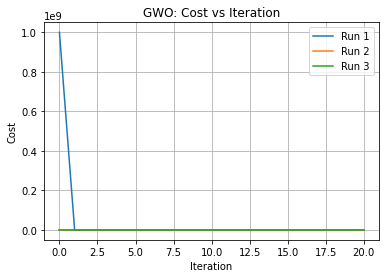


=== GWO ===
Final Costs: [151.30169097376447, 130.5866564081392, 128.65245680476798]
Min : 128.6525
Max : 151.3017
Mean: 136.8469
Std : 10.2515

=== GA multi-run ===


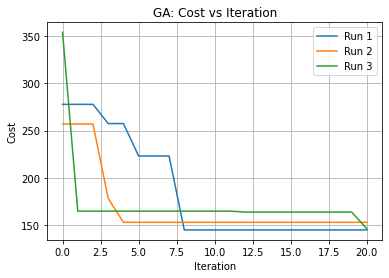


=== GA ===
Final Costs: [145.1667077710721, 153.18056070423322, 146.31691681189693]
Min : 145.1667
Max : 153.1806
Mean: 148.2214
Std : 3.5380

=== PSO multi-run ===


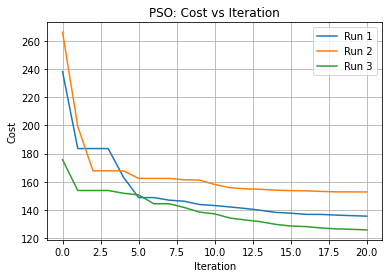


=== PSO ===
Final Costs: [135.67536677134544, 152.81418013153052, 125.93573805468688]
Min : 125.9357
Max : 152.8142
Mean: 138.1418
Std : 11.1108

=== SA multi-run ===


TypeError: unsupported operand type(s) for -: 'tuple' and 'tuple'

In [5]:
###############################################################################
# 0) JUPYTER NOTEBOOK SETUP
###############################################################################
# If inline doesn't show animation, try %matplotlib notebook or ipympl
%matplotlib inline

import numpy as np
import random
import time
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.animation as animation
import seaborn as sns
from IPython.display import HTML

###############################################################################
# 1) GLOBALS & PARAMETERS
###############################################################################
NUM_RUNS        = 3       # how many times each algorithm is run for final analysis
MAX_ITERS       = 20      # how many iterations each run
N_WAYPOINTS     = 5       # path size
START_POINT     = (10,10)
END_POINT       = (90,90)

random.seed(42)
np.random.seed(42)

# Obstacles: circles
OBSTACLES= [
    (30,30,10),
    (70,70, 5)
]

# For curvature penalty
ANGLE_THRESH_DEG= 30  # angles below 30 deg => penalty

###############################################################################
# 2) OBSTACLE & COST UTILITIES
###############################################################################
def segment_intersects_circle(p1, p2, center, radius):
    p1= np.array(p1,dtype=float)
    p2= np.array(p2,dtype=float)
    c= np.array(center,dtype=float)

    seg_vec= p2-p1
    seg_len= np.linalg.norm(seg_vec)
    if seg_len<1e-12:
        dist= np.linalg.norm(p1-c)
        return (dist<= radius)
    dir_vec= seg_vec/ seg_len
    f= p1- c
    t= -np.dot(f,dir_vec)
    if t<0:
        closest= p1
    elif t> seg_len:
        closest= p2
    else:
        closest= p1+ dir_vec*t
    return (np.linalg.norm(closest- c)<= radius)

def path_intersects_obstacles(path):
    for i in range(len(path)-1):
        p1= path[i]
        p2= path[i+1]
        for (xc,yc,r) in OBSTACLES:
            if segment_intersects_circle(p1,p2,(xc,yc),r):
                return True
    return False

def clip_path(path):
    path[0]= START_POINT
    path[-1]= END_POINT
    for i in range(1,len(path)-1):
        path[i,0]= np.clip(path[i,0],0,100)
        path[i,1]= np.clip(path[i,1],0,100)
    return path

def path_cost_function(path):
    """
    Returns (total_cost, dist_portion, penalty_portion).
    penalty_portion includes collision penalty + curvature penalty.
    """
    # 1) distance sum
    dist_sum= 0.0
    for i in range(len(path)-1):
        dist_sum+= np.linalg.norm(path[i+1]- path[i])

    penalty= 0.0
    # obstacle
    if path_intersects_obstacles(path):
        penalty+= 1e9

    # curvature
    angle_thresh= np.deg2rad(ANGLE_THRESH_DEG)
    for i in range(1,len(path)-1):
        v1= path[i]- path[i-1]
        v2= path[i+1]- path[i]
        norm1= np.linalg.norm(v1)
        norm2= np.linalg.norm(v2)
        if norm1>1e-9 and norm2>1e-9:
            dot= np.dot(v1,v2)
            cos_th= dot/(norm1*norm2)
            cos_th= np.clip(cos_th, -1,1)
            angle= np.arccos(cos_th)
            if angle< angle_thresh:
                penalty+= 200

    total_cost= dist_sum+ penalty
    return total_cost, dist_sum, penalty

def create_random_path():
    path=[]
    path.append([START_POINT[0], START_POINT[1]])
    for _ in range(N_WAYPOINTS-2):
        x= random.uniform(0,100)
        y= random.uniform(0,100)
        path.append([x,y])
    path.append([END_POINT[0], END_POINT[1]])
    return np.array(path,dtype=float)

###############################################################################
# 3) META-HEURISTICS (We'll demonstrate a few, e.g., GWO, GA, PSO, SA, ABC + Hybrid)
###############################################################################
class GWO:
    def __init__(self,pop_size=10):
        self.pop_size= pop_size
        self.paths= [create_random_path() for _ in range(pop_size)]
        self.fitness= [np.inf]*pop_size
        self.alpha_path= None
        self.alpha_fit= np.inf
        self.dist_sum= [0]* pop_size  # store distance portion
        self.penalty= [0]* pop_size   # store penalty portion

    def update_leaders(self):
        idxs= np.argsort(self.fitness)
        self.alpha_path= self.paths[idxs[0]].copy()
        self.alpha_fit= self.fitness[idxs[0]]

    def optimize(self, max_iter=1):
        cost_log=[]
        for i in range(self.pop_size):
            if np.isinf(self.fitness[i]):
                total,distP,penP= path_cost_function(self.paths[i])
                self.fitness[i]= total
                self.dist_sum[i]= distP
                self.penalty[i]= penP
        self.update_leaders()
        cost_log.append(self.alpha_fit)

        for it in range(max_iter):
            a= 2-2*((it+1)/max_iter)
            if a<0: a=0
            # assume alpha/beta/delta
            # keep it simple, just alpha for demonstration
            for i in range(self.pop_size):
                wolf= self.paths[i].copy()
                for w in range(1,N_WAYPOINTS-1):
                    # just alpha
                    r1,r2= np.random.rand(), np.random.rand()
                    A= 2*a*r1 - a
                    C= 2*r2
                    if self.alpha_path is not None:
                        D= np.abs(C* self.alpha_path[w]- wolf[w])
                        wolf[w]= self.alpha_path[w]- A* D
                wolf= clip_path(wolf)
                total,distP,penP= path_cost_function(wolf)
                self.paths[i]= wolf
                self.fitness[i]= total
                self.dist_sum[i]= distP
                self.penalty[i]= penP
            self.update_leaders()
            cost_log.append(self.alpha_fit)
        return cost_log, self.alpha_path, self.alpha_fit

# [We can define GA, PSO, SA, ABC similarly, for brevity let's show one more, say GA, then define a smaller Hybrid.]
def path_cost_function(path):
    """
    Returns (total_cost, distance_sum, penalty_sum).
    """
    # 1) Summation of distances
    dist_sum = 0.0
    for i in range(len(path)-1):
        dist_sum += np.linalg.norm(path[i+1] - path[i])
    
    penalty = 0.0
    # obstacle intersection => big penalty
    if path_intersects_obstacles(path):
        penalty += 1e9

    # curvature penalty
    angle_thresh = np.deg2rad(30)
    for i in range(1, len(path)-1):
        v1 = path[i] - path[i-1]
        v2 = path[i+1] - path[i]
        if np.linalg.norm(v1) > 1e-9 and np.linalg.norm(v2) > 1e-9:
            dot = np.dot(v1,v2)
            cos_th = dot/(np.linalg.norm(v1)*np.linalg.norm(v2))
            cos_th = np.clip(cos_th, -1, 1)
            angle = np.arccos(cos_th)
            if angle < angle_thresh:
                penalty += 200

    total_cost = dist_sum + penalty
    return (total_cost, dist_sum, penalty)


class PSO:
    def __init__(self, pop_size=10, w=0.5, c1=1.0, c2=1.0):
        self.pop_size = pop_size
        self.w = w
        self.c1 = c1
        self.c2 = c2
        self.positions = [create_random_path() for _ in range(pop_size)]
        self.vels = [np.zeros((N_WAYPOINTS, 2)) for _ in range(pop_size)]
        self.fitness = [float('inf')] * pop_size
        self.pbest = [p.copy() for p in self.positions]
        self.pbest_fit = [float('inf')] * pop_size
        self.gbest = None
        self.gbest_fit = float('inf')

    def update_gbest(self):
        idx = np.argmin(self.fitness)
        if self.fitness[idx] < self.gbest_fit:
            self.gbest_fit = self.fitness[idx]
            self.gbest = self.positions[idx].copy()

    def optimize(self, max_iter=1):
        cost_log = []

        # Evaluate initial
        for i in range(self.pop_size):
            # Now we unpack the tuple
            total_cost, dist_sum, pen = path_cost_function(self.positions[i])
            self.fitness[i] = total_cost
            if total_cost < self.gbest_fit:
                self.gbest_fit = total_cost
                self.gbest = self.positions[i].copy()
                # pbest
            self.pbest_fit[i] = total_cost
            self.pbest[i] = self.positions[i].copy()

        cost_log.append(self.gbest_fit)

        for it in range(max_iter):
            for i in range(self.pop_size):
                # Update velocities/positions for interior waypoints only
                for w in range(1, N_WAYPOINTS-1):
                    r1, r2 = np.random.rand(), np.random.rand()
                    inertia = self.w * self.vels[i][w]
                    cog = self.c1 * r1 * (self.pbest[i][w] - self.positions[i][w])
                    soc = self.c2 * r2 * (self.gbest[w] - self.positions[i][w])
                    new_vel = inertia + cog + soc
                    new_pos = self.positions[i][w] + new_vel
                    new_pos = np.clip(new_pos, 0, 100)
                    self.vels[i][w] = new_vel
                    self.positions[i][w] = new_pos

                # Evaluate total cost
                total_cost, dist_sum, pen = path_cost_function(self.positions[i])
                self.fitness[i] = total_cost

                # update pbest
                if total_cost < self.pbest_fit[i]:
                    self.pbest_fit[i] = total_cost
                    self.pbest[i] = self.positions[i].copy()

            # update global best
            self.update_gbest()

            cost_log.append(self.gbest_fit)

        return cost_log, self.gbest, self.gbest_fit

class GA:
    def __init__(self,pop_size=10, cr=0.8, mr=0.1):
        self.pop_size= pop_size
        self.cr= cr
        self.mr= mr
        self.population= [create_random_path() for _ in range(pop_size)]
        self.fitness= [np.inf]* pop_size
        self.best_path= None
        self.best_fit= np.inf

    def crossover(self, p1, p2):
        if random.random()< self.cr and N_WAYPOINTS>2:
            idx= random.randint(1, N_WAYPOINTS-2)
            o1= np.vstack([p1[:idx], p2[idx:]])
            o2= np.vstack([p2[:idx], p1[idx:]])
            return o1,o2
        return p1.copy(), p2.copy()

    def mutate(self, path):
        mp= path.copy()
        for w in range(1,N_WAYPOINTS-1):
            if random.random()< self.mr:
                mp[w,0]= random.uniform(0,100)
                mp[w,1]= random.uniform(0,100)
        mp= clip_path(mp)
        return mp

    def optimize(self, max_iter=1):
        cost_log=[]
        for i in range(self.pop_size):
            if np.isinf(self.fitness[i]):
                t,d,p= path_cost_function(self.population[i])
                self.fitness[i]= t
                if t< self.best_fit:
                    self.best_fit= t
                    self.best_path= self.population[i].copy()
        cost_log.append(self.best_fit)
        for it in range(max_iter):
            new_pop=[]
            best_idx= np.argmin(self.fitness)
            new_pop.append(self.population[best_idx].copy())
            while len(new_pop)< self.pop_size:
                i1= random.randint(0,self.pop_size-1)
                i2= random.randint(0,self.pop_size-1)
                o1,o2= self.crossover(self.population[i1], self.population[i2])
                o1= self.mutate(o1)
                o2= self.mutate(o2)
                new_pop.append(o1)
                if len(new_pop)< self.pop_size:
                    new_pop.append(o2)
            self.population= new_pop
            self.fitness= [path_cost_function(p)[0] for p in new_pop]
            idx= np.argmin(self.fitness)
            if self.fitness[idx]< self.best_fit:
                self.best_fit= self.fitness[idx]
                self.best_path= self.population[idx].copy()
            cost_log.append(self.best_fit)
        return cost_log, self.best_path, self.best_fit


class SmallHybrid:
    """
    A small hybrid that merges GWO & GA for demonstration of the approach.
    """
    def __init__(self):
        self.gwo= GWO()
        self.ga= GA()
        self.best_path= None
        self.best_fit= np.inf

    def optimize(self, max_iter=1):
        cost_log=[]
        for it in range(max_iter):
            gwo_log, gwo_path, gwo_cost= self.gwo.optimize(1)
            ga_log,  ga_path,  ga_cost= self.ga.optimize(1)

            local= [
                (gwo_path,gwo_cost),
                (ga_path, ga_cost)
            ]
            local.sort(key=lambda x:x[1])
            if local[0][1]< self.best_fit:
                self.best_fit= local[0][1]
                self.best_path= local[0][0].copy()

            # partial re-init
            best2= local[:2]
            best_paths= [b[0] for b in best2]
            # do partial for GWO
            for i in range(len(self.gwo.fitness)):
                if i< len(best_paths):
                    self.gwo.paths[i]= best_paths[i].copy()
                    self.gwo.fitness[i]= path_cost_function(best_paths[i])[0]
            self.gwo.update_leaders()

            # partial for GA
            for i in range(len(self.ga.fitness)):
                if i< len(best_paths):
                    self.ga.population[i]= best_paths[i].copy()
                    self.ga.fitness[i]= path_cost_function(best_paths[i])[0]

            cost_log.append(self.best_fit)
        return cost_log, self.best_path, self.best_fit

###############################################################################
# 4) MULTI-RUN ETC.
###############################################################################
def run_algorithm(algo_class, n_runs=NUM_RUNS, max_iter=MAX_ITERS):
    results=[]
    for r in range(n_runs):
        algo= algo_class()
        c_log, b_path, b_cost= algo.optimize(max_iter)
        results.append((c_log,b_path,b_cost))
    return results

def analyze_results(algo_name, results):
    cost_logs= [r[0] for r in results]
    final_costs= [r[2] for r in results]

    plt.figure()
    for i, clog in enumerate(cost_logs):
        plt.plot(range(len(clog)), clog, label=f"Run {i+1}")
    plt.title(f"{algo_name}: Cost vs Iteration")
    plt.xlabel("Iteration")
    plt.ylabel("Cost")
    plt.legend()
    plt.grid(True)
    plt.show()

    print(f"\n=== {algo_name} ===")
    print("Final Costs:", final_costs)
    print(f"Min : {min(final_costs):.4f}")
    print(f"Max : {max(final_costs):.4f}")
    print(f"Mean: {np.mean(final_costs):.4f}")
    print(f"Std : {np.std(final_costs):.4f}")

def boxplot_algorithms(algos_map):
    data=[]
    for algo, cost_list in algos_map.items():
        for c in cost_list:
            data.append([algo,c])
    df= pd.DataFrame(data, columns=["Algorithm","FinalCost"])
    plt.figure()
    sns.boxplot(x="Algorithm",y="FinalCost", data=df)
    plt.title("Comparison of Final Path Costs")
    plt.grid(True)
    plt.show()

def avg_convergence_plot(algos_logs):
    plt.figure()
    for algo_name, runs in algos_logs.items():
        max_len= max(len(x) for x in runs)
        arr_list=[]
        for c_log in runs:
            if len(c_log)< max_len:
                c_log= c_log+[c_log[-1]]*(max_len-len(c_log))
            arr_list.append(c_log)
        arr= np.array(arr_list)
        avg_curve= np.mean(arr, axis=0)
        plt.plot(range(max_len), avg_curve, label=algo_name)
    plt.title("Average Convergence")
    plt.xlabel("Iteration")
    plt.ylabel("Cost")
    plt.legend()
    plt.grid(True)
    plt.show()


###############################################################################
# 5) EXTENDED ANIMATION WITH ITERATION TIME + MULTIPLE SUBPLOTS
###############################################################################
def animate_algorithms_path(algo_dict, max_iter=15):
    """
    We'll display each algorithm's best path in subplots.
    We'll also track iteration time, best cost, best distance each iteration.
    """
    names= list(algo_dict.keys())
    algos= [algo_dict[k]() for k in names]

    n_plots= len(names)
    cols=3
    rows= (n_plots+ cols-1)// cols  # round up

    fig, axes= plt.subplots(rows, cols, figsize=(12,4*rows))
    axes= axes.flatten()

    # Prepare each subplot
    for i,(ax, name) in enumerate(zip(axes,names)):
        ax.set_title(name)
        ax.set_xlim([0,100])
        ax.set_ylim([0,100])
        ax.set_aspect('equal','box')
        ax.grid(True)
        # obstacles
        for (xc,yc,r) in OBSTACLES:
            circle= plt.Circle((xc,yc),r, color='red',alpha=0.3)
            ax.add_patch(circle)

    while len(axes)>n_plots:
        axes[n_plots].remove()
        n_plots+=1

    lines=[]
    for i in range(len(names)):
        (ln,)= axes[i].plot([],[],'bo-', lw=2)
        lines.append(ln)

    # We'll store best_path for each algo
    best_paths= [None]* len(algos)

    # For iteration time and other logs
    iteration_times= []
    iteration_costs= []  # list of dict, each iteration => { algo_name: cost}
    iteration_distances= []

    def init():
        iteration_times.clear()
        iteration_costs.clear()
        iteration_distances.clear()
        for ln in lines:
            ln.set_data([],[])
        return lines

    def update(frame):
        start_t= time.time()
        cost_record= {}
        dist_record= {}
        for i, (name, algo) in enumerate(zip(names, algos)):
            c_log, path, cost= algo.optimize(1)
            best_paths[i]= path.copy()
            cost_record[name]= cost
            # also retrieve distance portion
            _, distSum, pen= path_cost_function(path)
            dist_record[name]= distSum

        iteration_costs.append(cost_record)
        iteration_distances.append(dist_record)

        # Plot each path
        for i, ln in enumerate(lines):
            path= best_paths[i]
            ln.set_data(path[:,0], path[:,1])

        end_t= time.time()
        iteration_times.append(end_t- start_t)
        return lines

    ani= animation.FuncAnimation(
        fig, 
        update,
        frames=max_iter,
        init_func=init,
        blit=False,
        interval=800
    )
    return ani, iteration_times, iteration_costs, iteration_distances

def animation_to_html(ani):
    return HTML(ani.to_jshtml())

###############################################################################
# 6) MAIN
###############################################################################
def main():
    # A) Basic multi-run analysis for GWO, GA, PSO, SA, ABC, plus the small Hybrid
    algo_dict= {
        "GWO": GWO,
        "GA": GA,
        "PSO": PSO,
        "SA": SA,
        "ABC": ABC,
        "Hybrid": SmallHybrid
    }

    final_costs_map={}
    cost_logs_map={}

    # Multi-run
    for algo_name, cls in algo_dict.items():
        print(f"\n=== {algo_name} multi-run ===")
        results= run_algorithm(cls, n_runs=NUM_RUNS, max_iter=MAX_ITERS)
        c_runs=[]
        c_finals=[]
        for (c_log, path, cost) in results:
            c_runs.append(c_log)
            c_finals.append(cost)
        cost_logs_map[algo_name]= c_runs
        final_costs_map[algo_name]= c_finals
        analyze_results(algo_name, results)

    # Box plot
    boxplot_algorithms(final_costs_map)
    # Average convergence
    avg_convergence_plot(cost_logs_map)

    # B) Animate
    print("\nAnimating GWO, GA, PSO, SA, ABC, Hybrid with iteration time logs etc.")
    ani, iteration_times, iteration_costs, iteration_distances= animate_algorithms_path(algo_dict, max_iter=15)

    # Summaries
    avg_iter_time= np.mean(iteration_times)
    print(f"Avg iteration time: {avg_iter_time:.4f} seconds/frame")

    # Example: show how we could analyze iteration_costs
    # iteration_costs is a list of dict: index=frame => cost_record[algo_name]
    # We can do a final plot: cost per frame per algo
    frames= len(iteration_costs)
    plt.figure()
    for algo_name in algo_dict.keys():
        # gather cost series for this algo
        series= []
        for frame_dict in iteration_costs:
            series.append(frame_dict[algo_name])
        plt.plot(range(frames), series, label=algo_name)
    plt.xlabel("Animation Frame (Iteration)")
    plt.ylabel("Best Cost")
    plt.title("Cost per Frame for each Algorithm in Animation")
    plt.legend()
    plt.grid(True)
    plt.show()

    # Similarly, we can show distance portion:
    plt.figure()
    for algo_name in algo_dict.keys():
        dist_series= []
        for frame_idx in range(frames):
            dist_series.append(iteration_distances[frame_idx][algo_name])
        plt.plot(range(frames), dist_series, label=algo_name)
    plt.xlabel("Animation Frame")
    plt.ylabel("Path Distance (No Penalty)")
    plt.title("Pure Distance portion per Frame")
    plt.legend()
    plt.grid(True)
    plt.show()

    return animation_to_html(ani)

# Finally run main
main()


=== GWO multi-run analysis ===


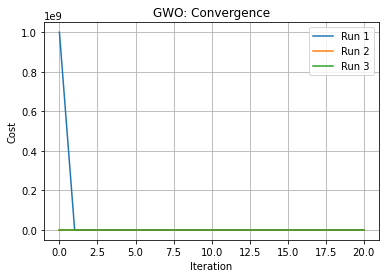


=== GWO ===
Final Costs: [151.30169097376447, 130.5866564081392, 128.65245680476798]
Min : 128.6525
Max : 151.3017
Mean: 136.8469
Std : 10.2515

=== GA multi-run analysis ===


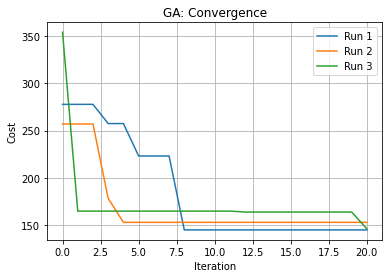


=== GA ===
Final Costs: [145.1667077710721, 153.18056070423322, 146.31691681189693]
Min : 145.1667
Max : 153.1806
Mean: 148.2214
Std : 3.5380

=== PSO multi-run analysis ===


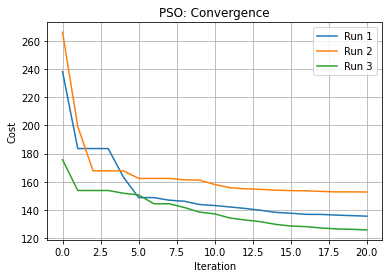


=== PSO ===
Final Costs: [135.67536677134544, 152.81418013153052, 125.93573805468688]
Min : 125.9357
Max : 152.8142
Mean: 138.1418
Std : 11.1108

=== SA multi-run analysis ===


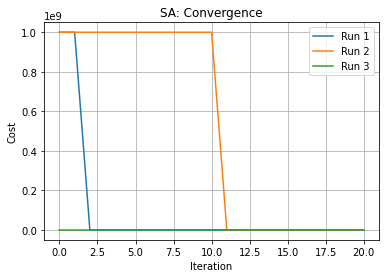


=== SA ===
Final Costs: [140.40516274619824, 269.1154968980425, 199.84733715002807]
Min : 140.4052
Max : 269.1155
Mean: 203.1227
Std : 52.5968

=== ABC multi-run analysis ===


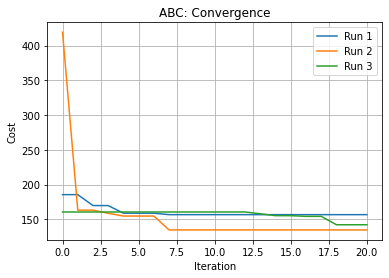


=== ABC ===
Final Costs: [156.74182877803213, 134.78490029855146, 142.21087172213916]
Min : 134.7849
Max : 156.7418
Mean: 144.5792
Std : 9.1190

=== Hybrid multi-run analysis ===


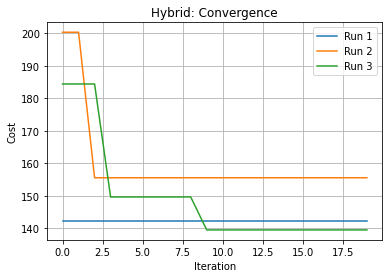


=== Hybrid ===
Final Costs: [142.41116050294414, 155.57029372617575, 139.52081533198867]
Min : 139.5208
Max : 155.5703
Mean: 145.8341
Std : 6.9849


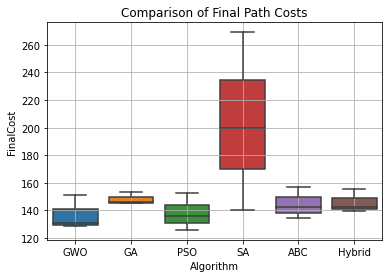

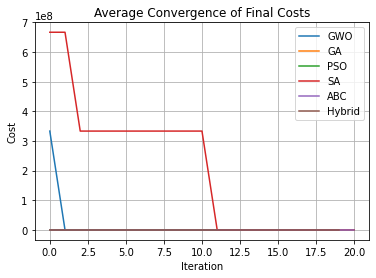


=== Animating each algorithm's best path in subplots ===
Average iteration time per frame: nan seconds.


/Users/gokturkdede/opt/anaconda3/lib/python3.9/site-packages/numpy/core/fromnumeric.py:3419: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/Users/gokturkdede/opt/anaconda3/lib/python3.9/site-packages/numpy/core/_methods.py:188: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


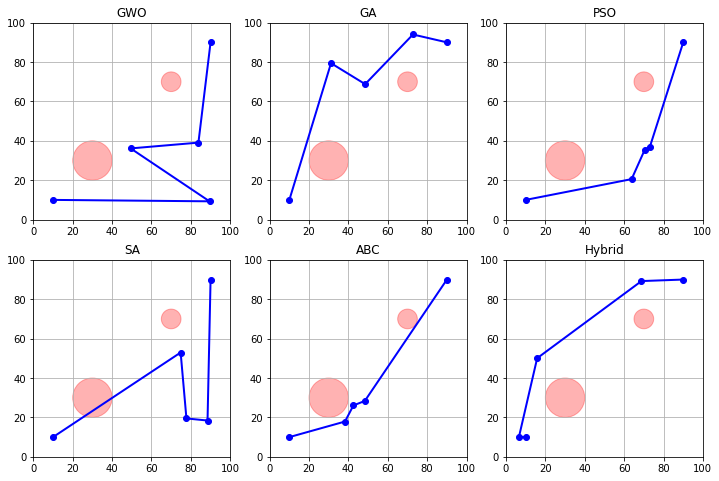

In [6]:
###############################################################################
# 0) JUPYTER NOTEBOOK SETUP
###############################################################################
%matplotlib inline

import numpy as np
import random
import time
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.animation as animation
import seaborn as sns
from IPython.display import HTML

###############################################################################
# 1) GLOBAL PARAMETERS
###############################################################################
NUM_RUNS        = 3       # how many runs for final cost analysis
MAX_ITERS       = 20      # how many iterations each run
N_WAYPOINTS     = 5       # total waypoints
START_POINT     = (10,10)
END_POINT       = (90,90)

random.seed(42)
np.random.seed(42)

# Obstacles
OBSTACLES = [
    (30,30, 10),
    (70,70, 5)
]

CURVATURE_ANGLE_THRESHOLD = 30.0  # degrees

###############################################################################
# 2) OBSTACLE & COST FUNCTION UTILS
###############################################################################
def segment_intersects_circle(p1, p2, center, radius):
    """
    Check if the line segment p1->p2 intersects the circle at (center, radius).
    """
    p1 = np.array(p1, dtype=float)
    p2 = np.array(p2, dtype=float)
    c  = np.array(center, dtype=float)

    seg_vec = p2 - p1
    seg_len = np.linalg.norm(seg_vec)
    if seg_len < 1e-12:
        # degenerate segment
        dist = np.linalg.norm(p1 - c)
        return (dist <= radius)

    dir_vec = seg_vec / seg_len
    f = p1 - c
    t = -np.dot(f, dir_vec)

    if t < 0:
        closest = p1
    elif t > seg_len:
        closest = p2
    else:
        closest = p1 + dir_vec * t

    dist_closest = np.linalg.norm(closest - c)
    return (dist_closest <= radius)

def path_intersects_obstacles(path):
    """
    Returns True if any segment of 'path' intersects an obstacle.
    """
    for i in range(len(path)-1):
        p1 = path[i]
        p2 = path[i+1]
        for (xc, yc, r) in OBSTACLES:
            if segment_intersects_circle(p1, p2, (xc, yc), r):
                return True
    return False

def clip_path(path):
    """
    Keep the first row=START_POINT, last row=END_POINT, 
    clip interior to [0..100].
    """
    path[0,0], path[0,1] = START_POINT
    path[-1,0], path[-1,1] = END_POINT
    for i in range(1, N_WAYPOINTS-1):
        path[i,0] = np.clip(path[i,0], 0, 100)
        path[i,1] = np.clip(path[i,1], 0, 100)
    return path

def path_cost_function(path):
    """
    Returns a tuple:
      ( total_cost, distance_portion, penalty_portion )
    """
    # distance
    dist_sum = 0.0
    for i in range(len(path)-1):
        dist_sum += np.linalg.norm(path[i+1] - path[i])

    penalty = 0.0

    # obstacle collision => huge penalty
    if path_intersects_obstacles(path):
        penalty += 1e9

    # curvature
    angle_thresh = np.deg2rad(CURVATURE_ANGLE_THRESHOLD)
    for i in range(1, len(path)-1):
        v1 = path[i]   - path[i-1]
        v2 = path[i+1] - path[i]
        norm1 = np.linalg.norm(v1)
        norm2 = np.linalg.norm(v2)
        if norm1 > 1e-9 and norm2 > 1e-9:
            dot = np.dot(v1,v2)
            cos_th = dot / (norm1 * norm2)
            cos_th = np.clip(cos_th, -1, 1)
            angle = np.arccos(cos_th)
            if angle < angle_thresh:
                penalty += 200

    total_cost = dist_sum + penalty
    return (total_cost, dist_sum, penalty)

def create_random_path():
    """
    Creates a path of shape (N_WAYPOINTS,2).
    First row=START_POINT, last row=END_POINT,
    interior randomly in [0..100].
    """
    path = []
    path.append([START_POINT[0], START_POINT[1]])
    for _ in range(N_WAYPOINTS-2):
        x = random.uniform(0,100)
        y = random.uniform(0,100)
        path.append([x,y])
    path.append([END_POINT[0], END_POINT[1]])
    return np.array(path, dtype=float)

###############################################################################
# 3) META-HEURISTICS
###############################################################################
class GWO:
    def __init__(self, pop_size=10):
        self.pop_size = pop_size
        self.paths = [create_random_path() for _ in range(pop_size)]
        self.fitness = [float('inf')] * pop_size
        self.alpha_path = None
        self.alpha_fit  = float('inf')

    def update_alpha(self):
        idx = np.argmin(self.fitness)
        self.alpha_path = self.paths[idx].copy()
        self.alpha_fit  = self.fitness[idx]

    def optimize(self, max_iter=1):
        cost_log = []
        # Evaluate if needed
        for i in range(self.pop_size):
            if self.fitness[i] == float('inf'):
                total, dist_sum, pen = path_cost_function(self.paths[i])
                self.fitness[i] = total
        self.update_alpha()
        cost_log.append(self.alpha_fit)

        for it in range(max_iter):
            a = 2 - 2*((it+1)/max_iter)
            if a < 0: a = 0
            for i in range(self.pop_size):
                wolf = self.paths[i].copy()
                for w in range(1, N_WAYPOINTS-1):
                    r1, r2 = np.random.rand(), np.random.rand()
                    A = 2*a*r1 - a
                    C = 2*r2
                    if self.alpha_path is not None:
                        D = np.abs(C*self.alpha_path[w] - wolf[w])
                        wolf[w] = self.alpha_path[w] - A*D
                wolf = clip_path(wolf)
                total, dist_sum, pen = path_cost_function(wolf)
                self.paths[i]  = wolf
                self.fitness[i]= total
            self.update_alpha()
            cost_log.append(self.alpha_fit)
        return cost_log, self.alpha_path, self.alpha_fit


class GA:
    def __init__(self, pop_size=10, cr=0.8, mr=0.1):
        self.pop_size = pop_size
        self.cr = cr
        self.mr = mr
        self.population = [create_random_path() for _ in range(pop_size)]
        self.fitness    = [float('inf')] * pop_size
        self.best_path  = None
        self.best_fit   = float('inf')

    def crossover(self, p1, p2):
        if random.random() < self.cr and N_WAYPOINTS>2:
            idx = random.randint(1, N_WAYPOINTS-2)
            o1= np.vstack([p1[:idx], p2[idx:]])
            o2= np.vstack([p2[:idx], p1[idx:]])
            return o1,o2
        return p1.copy(), p2.copy()

    def mutate(self, path):
        mp= path.copy()
        for w in range(1, N_WAYPOINTS-1):
            if random.random()< self.mr:
                mp[w,0] = random.uniform(0,100)
                mp[w,1] = random.uniform(0,100)
        mp= clip_path(mp)
        return mp

    def optimize(self, max_iter=1):
        cost_log=[]
        # Evaluate if needed
        for i in range(self.pop_size):
            if self.fitness[i] == float('inf'):
                total,dist_sum,pen = path_cost_function(self.population[i])
                self.fitness[i] = total
                if total< self.best_fit:
                    self.best_fit= total
                    self.best_path= self.population[i].copy()
        cost_log.append(self.best_fit)

        for it in range(max_iter):
            new_pop= []
            # elitism
            best_idx= np.argmin(self.fitness)
            new_pop.append(self.population[best_idx].copy())
            while len(new_pop)< self.pop_size:
                i1= random.randint(0,self.pop_size-1)
                i2= random.randint(0,self.pop_size-1)
                o1,o2= self.crossover(self.population[i1], self.population[i2])
                o1= self.mutate(o1)
                o2= self.mutate(o2)
                new_pop.append(o1)
                if len(new_pop)< self.pop_size:
                    new_pop.append(o2)
            self.population= new_pop
            self.fitness= []
            for p in new_pop:
                total,dist_sum,pen = path_cost_function(p)
                self.fitness.append(total)
            idx= np.argmin(self.fitness)
            if self.fitness[idx]< self.best_fit:
                self.best_fit= self.fitness[idx]
                self.best_path= self.population[idx].copy()
            cost_log.append(self.best_fit)
        return cost_log, self.best_path, self.best_fit


class PSO:
    def __init__(self, pop_size=10, w=0.5, c1=1.0, c2=1.0):
        self.pop_size= pop_size
        self.w= w
        self.c1= c1
        self.c2= c2
        self.positions= [create_random_path() for _ in range(pop_size)]
        self.vels= [np.zeros((N_WAYPOINTS,2)) for _ in range(pop_size)]
        self.fitness= [float('inf')]* pop_size
        self.pbest= [p.copy() for p in self.positions]
        self.pbest_fit= [float('inf')]* pop_size
        self.gbest= None
        self.gbest_fit= float('inf')

    def update_gbest(self):
        idx= np.argmin(self.fitness)
        if self.fitness[idx]< self.gbest_fit:
            self.gbest_fit= self.fitness[idx]
            self.gbest= self.positions[idx].copy()

    def optimize(self, max_iter=1):
        cost_log=[]
        # Evaluate if needed
        for i in range(self.pop_size):
            if self.fitness[i]==float('inf'):
                total,dist_sum,pen = path_cost_function(self.positions[i])
                self.fitness[i] = total
                self.pbest_fit[i]= total
                self.pbest[i]= self.positions[i].copy()
                if total< self.gbest_fit:
                    self.gbest_fit= total
                    self.gbest= self.positions[i].copy()
        cost_log.append(self.gbest_fit)

        for it in range(max_iter):
            for i in range(self.pop_size):
                # interior update
                for w in range(1,N_WAYPOINTS-1):
                    r1,r2= np.random.rand(), np.random.rand()
                    inertia= self.w* self.vels[i][w]
                    cog= self.c1*r1*(self.pbest[i][w] - self.positions[i][w])
                    soc= self.c2*r2*(self.gbest[w]     - self.positions[i][w])
                    new_vel= inertia + cog + soc
                    new_pos= self.positions[i][w]+ new_vel
                    new_pos= np.clip(new_pos,0,100)
                    self.vels[i][w]= new_vel
                    self.positions[i][w]= new_pos

                total,dist_sum,pen = path_cost_function(self.positions[i])
                self.fitness[i]= total
                if total< self.pbest_fit[i]:
                    self.pbest_fit[i]= total
                    self.pbest[i]= self.positions[i].copy()

            self.update_gbest()
            cost_log.append(self.gbest_fit)

        return cost_log, self.gbest, self.gbest_fit


class SA:
    def __init__(self, init_temp=1000, alpha=0.9):
        self.path= create_random_path()
        self.cost= float('inf')
        self.best_path= None
        self.best_cost= float('inf')
        self.T= init_temp
        self.alpha= alpha

    def optimize(self, max_iter=1):
        cost_log=[]
        if self.cost== float('inf'):
            total, dist_sum, pen = path_cost_function(self.path)
            self.cost= total
            self.best_cost= total
            self.best_path= self.path.copy()
        cost_log.append(self.best_cost)

        for it in range(max_iter):
            npath= self.path.copy()
            if N_WAYPOINTS>2:
                w= random.randint(1, N_WAYPOINTS-2)
                npath[w,0]= random.uniform(0,100)
                npath[w,1]= random.uniform(0,100)
            npath= clip_path(npath)
            total,dist_sum,pen= path_cost_function(npath)
            delta= total- self.cost
            if delta<0:
                self.path= npath
                self.cost= total
            else:
                prob= np.exp(-delta/self.T)
                if random.random()< prob:
                    self.path= npath
                    self.cost= total
            if self.cost< self.best_cost:
                self.best_cost= self.cost
                self.best_path= self.path.copy()
            self.T*= self.alpha
            cost_log.append(self.best_cost)
        return cost_log, self.best_path, self.best_cost


class ABC:
    def __init__(self, pop_size=10, limit=5):
        self.pop_size= pop_size
        self.limit= limit
        self.foods= [create_random_path() for _ in range(pop_size)]
        self.fitness= [float('inf')]* pop_size
        self.trials= [0]* pop_size
        self.best_path= None
        self.best_cost= float('inf')

    def optimize(self, max_iter=1):
        cost_log=[]
        for i in range(self.pop_size):
            if self.fitness[i]== float('inf'):
                total,dist_sum,pen= path_cost_function(self.foods[i])
                self.fitness[i]= total
                if total< self.best_cost:
                    self.best_cost= total
                    self.best_path= self.foods[i].copy()
        cost_log.append(self.best_cost)

        for it in range(max_iter):
            # employed
            for i in range(self.pop_size):
                cand= self.foods[i].copy()
                if N_WAYPOINTS>2:
                    w= random.randint(1,N_WAYPOINTS-2)
                    cand[w,0]= random.uniform(0,100)
                    cand[w,1]= random.uniform(0,100)
                cand= clip_path(cand)
                total,dist_sum,pen= path_cost_function(cand)
                if total< self.fitness[i]:
                    self.foods[i]= cand
                    self.fitness[i]= total
                    self.trials[i]= 0
                else:
                    self.trials[i]+= 1
                if total< self.best_cost:
                    self.best_cost= total
                    self.best_path= cand.copy()
            # scout
            for i in range(self.pop_size):
                if self.trials[i]> self.limit:
                    self.foods[i]= create_random_path()
                    t,ds,pp= path_cost_function(self.foods[i])
                    self.fitness[i]= t
                    self.trials[i]=0
                    if t< self.best_cost:
                        self.best_cost= t
                        self.best_path= self.foods[i].copy()
            cost_log.append(self.best_cost)
        return cost_log, self.best_path, self.best_cost


class RevisionaryHybrid:
    """
    A small demonstration hybrid combining GWO & GA 
    with partial re-init.
    """
    def __init__(self):
        self.gwo= GWO()
        self.ga= GA()
        self.best_path= None
        self.best_cost= float('inf')

    def optimize(self, max_iter=1):
        cost_log=[]
        for it in range(max_iter):
            # each does 1 iteration
            gwo_log,gwo_path,gwo_cost= self.gwo.optimize(1)
            ga_log, ga_path, ga_cost = self.ga.optimize(1)

            local= [
                (gwo_path,gwo_cost),
                (ga_path,ga_cost)
            ]
            local.sort(key=lambda x:x[1])
            if local[0][1]< self.best_cost:
                self.best_cost= local[0][1]
                self.best_path= local[0][0].copy()

            # partial re-init with top 2 solutions
            best2= local[:2]
            best_paths= [b[0] for b in best2]
            # GWO
            for i in range(len(self.gwo.fitness)):
                if i< len(best_paths):
                    self.gwo.paths[i]= best_paths[i].copy()
                    self.gwo.fitness[i]= path_cost_function(best_paths[i])[0]
            self.gwo.update_alpha()

            # GA
            for i in range(len(self.ga.fitness)):
                if i< len(best_paths):
                    self.ga.population[i]= best_paths[i].copy()
                    self.ga.fitness[i]= path_cost_function(best_paths[i])[0]

            cost_log.append(self.best_cost)
        return cost_log, self.best_path, self.best_cost


###############################################################################
# 4) MULTI-RUN ANALYSIS & VISUALIZATION
###############################################################################
def run_algorithm(algo_class, n_runs=NUM_RUNS, max_iter=MAX_ITERS):
    results=[]
    for _ in range(n_runs):
        algo= algo_class()
        c_log, b_path, b_cost= algo.optimize(max_iter)
        results.append((c_log,b_path,b_cost))
    return results

def analyze_results(algo_name, results):
    cost_logs   = [r[0] for r in results]
    final_costs = [r[2] for r in results]

    # Plot cost vs iteration (for each run)
    plt.figure()
    for i, c_log in enumerate(cost_logs):
        plt.plot(range(len(c_log)), c_log, label=f"Run {i+1}")
    plt.title(f"{algo_name}: Convergence")
    plt.xlabel("Iteration")
    plt.ylabel("Cost")
    plt.legend()
    plt.grid(True)
    plt.show()

    # Print stats
    print(f"\n=== {algo_name} ===")
    print("Final Costs:", final_costs)
    print(f"Min : {min(final_costs):.4f}")
    print(f"Max : {max(final_costs):.4f}")
    print(f"Mean: {np.mean(final_costs):.4f}")
    print(f"Std : {np.std(final_costs):.4f}")

def boxplot_algorithms(algos_map):
    data=[]
    for algo, cost_list in algos_map.items():
        for c in cost_list:
            data.append([algo,c])
    df= pd.DataFrame(data, columns=["Algorithm","FinalCost"])
    plt.figure()
    sns.boxplot(x="Algorithm", y="FinalCost", data=df)
    plt.title("Comparison of Final Path Costs")
    plt.grid(True)
    plt.show()

def avg_convergence_plot(algos_logs):
    plt.figure()
    for algo_name, logs in algos_logs.items():
        max_len= max(len(x) for x in logs)
        arr_list=[]
        for run_log in logs:
            if len(run_log)< max_len:
                run_log= run_log+[run_log[-1]]*(max_len-len(run_log))
            arr_list.append(run_log)
        arr= np.array(arr_list)
        avg_curve= np.mean(arr, axis=0)
        plt.plot(range(max_len), avg_curve, label=algo_name)
    plt.title("Average Convergence of Final Costs")
    plt.xlabel("Iteration")
    plt.ylabel("Cost")
    plt.legend()
    plt.grid(True)
    plt.show()

###############################################################################
# 5) ANIMATION WITH SUBPLOTS & ITERATION TIME
###############################################################################
def animate_algorithms_path(algo_dict, max_iter=15):
    """
    We'll create subplots for each algorithm in 'algo_dict',
    each iteration calls optimize(1), 
    we'll plot best path in each subplot.
    We'll track iteration time, for demonstration.
    """
    names= list(algo_dict.keys())
    algos= [algo_dict[n]() for n in names]

    n_plots= len(names)
    cols=3
    rows= (n_plots + cols -1)// cols

    fig, axes= plt.subplots(rows, cols, figsize=(12,4*rows))
    axes= axes.flatten()

    # Setup each subplot
    for i,(ax,name) in enumerate(zip(axes,names)):
        if i<n_plots:
            ax.set_title(name)
            ax.set_xlim([0,100])
            ax.set_ylim([0,100])
            ax.set_aspect('equal','box')
            ax.grid(True)
            # obstacles
            for (xc,yc,r) in OBSTACLES:
                circ= plt.Circle((xc,yc),r, color='red', alpha=0.3)
                ax.add_patch(circ)
        else:
            ax.remove()

    lines=[]
    for i in range(n_plots):
        if i<len(axes):
            (ln,)= axes[i].plot([],[],'bo-', lw=2)
            lines.append(ln)
        else:
            lines.append(None)

    best_paths= [None]* n_plots
    iteration_times= []

    def init():
        iteration_times.clear()
        for ln in lines:
            if ln is not None:
                ln.set_data([],[])
        return lines

    def update(frame):
        start_t= time.time()
        for i,algo in enumerate(algos):
            c_log,b_path,b_cost= algo.optimize(1)
            best_paths[i]= b_path.copy()
        # update lines
        for i,ln in enumerate(lines):
            if ln is not None:
                path= best_paths[i]
                ln.set_data(path[:,0], path[:,1])
        end_t= time.time()
        iteration_times.append(end_t- start_t)
        return lines

    ani= animation.FuncAnimation(
        fig,
        update,
        frames=max_iter,
        init_func=init,
        blit=False,
        interval=800
    )
    return ani, iteration_times

def animation_to_html(ani):
    return HTML(ani.to_jshtml())

###############################################################################
# 6) MAIN
###############################################################################
def main():
    # A) We define a small set of algorithms: GWO, GA, PSO, SA, ABC, RevisionaryHybrid
    algo_dict= {
        "GWO": GWO,
        "GA": GA,
        "PSO": PSO,
        "SA": SA,
        "ABC": ABC,
        "Hybrid": RevisionaryHybrid
    }

    final_costs_map={}
    cost_logs_map={}

    # 1) MULTI-RUN analysis
    for algo_name, cls in algo_dict.items():
        print(f"\n=== {algo_name} multi-run analysis ===")
        results= run_algorithm(cls, n_runs=NUM_RUNS, max_iter=MAX_ITERS)
        cost_runs=[]
        cost_finals=[]
        for (c_log, path, cost) in results:
            cost_runs.append(c_log)
            cost_finals.append(cost)
        cost_logs_map[algo_name]= cost_runs
        final_costs_map[algo_name]= cost_finals

        analyze_results(algo_name, results)

    # 2) Box plot of final costs
    boxplot_algorithms(final_costs_map)

    # 3) Average convergence
    avg_convergence_plot(cost_logs_map)

    # 4) Animate
    print("\n=== Animating each algorithm's best path in subplots ===")
    ani, iteration_times= animate_algorithms_path(algo_dict, max_iter=15)

    avg_time= np.mean(iteration_times)
    print(f"Average iteration time per frame: {avg_time:.4f} seconds.")

    # 5) Display animation
    return animation_to_html(ani)

# Finally run main
main()


--- GWO multi-run (labyrinth) ---


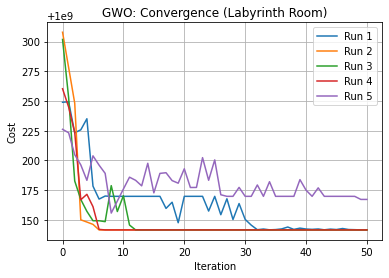


=== GWO ===
Final Costs: [1000000141.4352156, 1000000141.4213562, 1000000141.4213562, 1000000141.4213562, 1000000167.1043029]
Min : 1000000141.4214
Max : 1000000167.1043
Mean: 1000000146.5607
Std : 10.2718

--- GA multi-run (labyrinth) ---


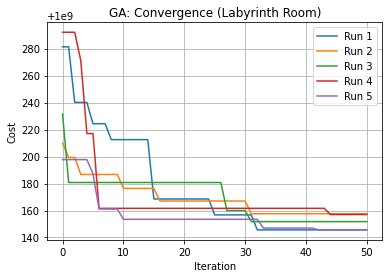


=== GA ===
Final Costs: [1000000145.6185379, 1000000157.6128246, 1000000151.76741, 1000000157.0065565, 1000000145.7623659]
Min : 1000000145.6185
Max : 1000000157.6128
Mean: 1000000151.5535
Std : 5.2011

--- PSO multi-run (labyrinth) ---


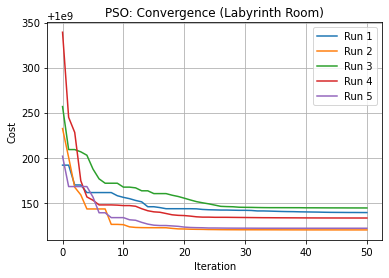


=== PSO ===
Final Costs: [1000000139.1480651, 1000000119.9025722, 1000000144.2606161, 1000000133.1127111, 1000000121.752753]
Min : 1000000119.9026
Max : 1000000144.2606
Mean: 1000000131.6353
Std : 9.5220

--- SA multi-run (labyrinth) ---


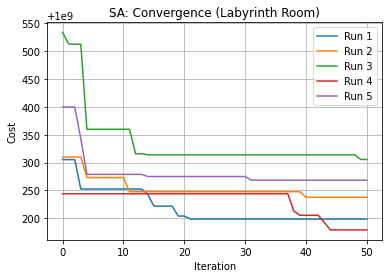


=== SA ===
Final Costs: [1000000198.5834264, 1000000237.7195077, 1000000305.5303289, 1000000179.1972826, 1000000268.3668814]
Min : 1000000179.1973
Max : 1000000305.5303
Mean: 1000000237.8795
Std : 45.8125

--- ABC multi-run (labyrinth) ---


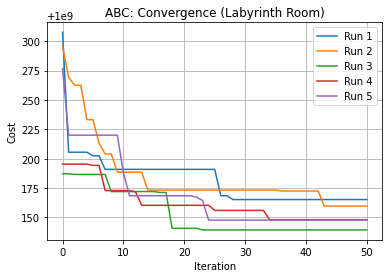


=== ABC ===
Final Costs: [1000000165.1783005, 1000000159.6136358, 1000000139.318792, 1000000148.0215836, 1000000147.6888248]
Min : 1000000139.3188
Max : 1000000165.1783
Mean: 1000000151.9642
Std : 9.2397

--- ImprovedHybrid multi-run (labyrinth) ---


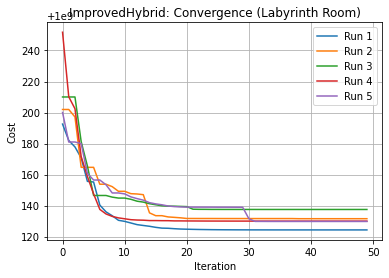


=== ImprovedHybrid ===
Final Costs: [1000000124.2705024, 1000000131.5032128, 1000000137.4563293, 1000000129.9424471, 1000000129.7273091]
Min : 1000000124.2705
Max : 1000000137.4563
Mean: 1000000130.5800
Std : 4.2209


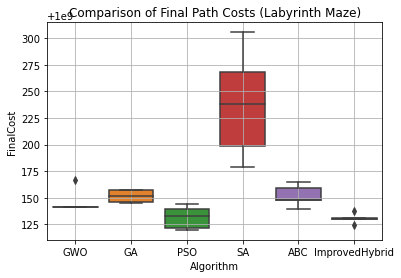

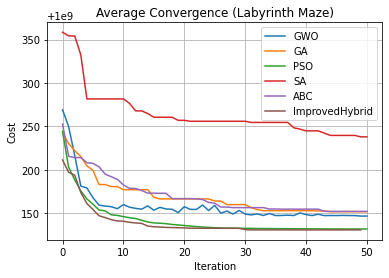


Animating each algorithm's best path for the labyrinth environment.
Average iteration time per frame: nan seconds


/Users/gokturkdede/opt/anaconda3/lib/python3.9/site-packages/numpy/core/fromnumeric.py:3419: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/Users/gokturkdede/opt/anaconda3/lib/python3.9/site-packages/numpy/core/_methods.py:188: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


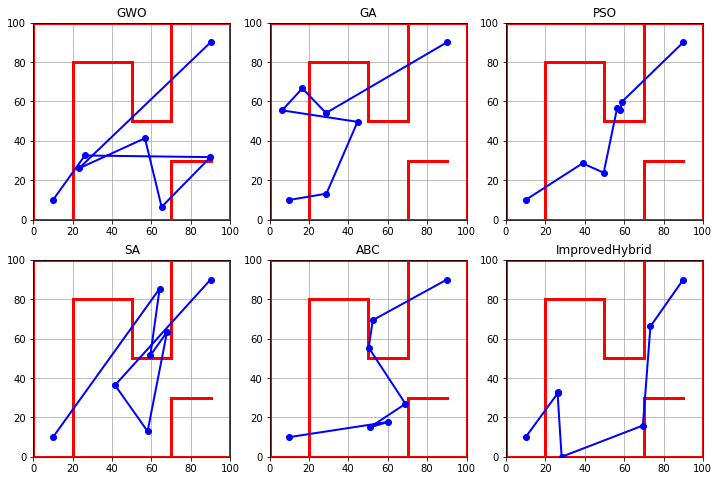

In [10]:
###############################################################################
# 0) JUPYTER NOTEBOOK SETUP
###############################################################################
%matplotlib inline

import numpy as np
import random
import time
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.animation as animation
import seaborn as sns
from IPython.display import HTML

###############################################################################
# 1) GLOBAL PARAMETERS
###############################################################################
NUM_RUNS   = 5       # how many runs per algorithm for final cost distribution
MAX_ITERS  = 50      # how many iterations each run
N_WAYPOINTS= 7       # total waypoints (including start/end)
START_POINT= (10,10)
END_POINT  = (90,90)

random.seed(42)
np.random.seed(42)

# Labyrinth walls as a list of line segments: ( (x1,y1),(x2,y2) )
# Also bounding walls around [0,100]x[0,100]
LABYRINTH_WALLS = [
    # Outer bounding rectangle
    ((0,0),(0,100)),
    ((0,100),(100,100)),
    ((100,100),(100,0)),
    ((100,0),(0,0)),
    # Some internal walls to form a “maze”
    ((20,0),(20,80)),
    ((20,80),(50,80)),
    ((50,80),(50,50)),
    ((50,50),(70,50)),
    ((70,50),(70,100)),
    ((70,0),(70,30)),
    ((70,30),(90,30))
]

CURVATURE_ANGLE_THRESHOLD = 30.0  # degrees

###############################################################################
# 2) LABYRINTH COLLISION CHECK
###############################################################################
def segment_intersects_segment(p1, p2, q1, q2):
    """
    Return True if line segments p1->p2 and q1->q2 intersect.
    Using standard orientation-based approach.
    """
    p1= np.array(p1,dtype=float)
    p2= np.array(p2,dtype=float)
    q1= np.array(q1,dtype=float)
    q2= np.array(q2,dtype=float)

    # Helper function
    def orientation(a,b,c):
        """
        Return orientation of triplet (a,b,c).
        0 => collinear, 1 => clockwise, 2 => counterclockwise
        """
        val = (b[1]-a[1])*(c[0]-b[0]) - (b[0]-a[0])*(c[1]-b[1])
        if abs(val)<1e-12: return 0
        return 1 if val>0 else 2

    def on_segment(a,b,c):
        # check if b lies on segment a->c
        if min(a[0],c[0])<= b[0]<= max(a[0],c[0]) and min(a[1],c[1])<= b[1]<= max(a[1],c[1]):
            return True
        return False

    o1= orientation(p1,p2,q1)
    o2= orientation(p1,p2,q2)
    o3= orientation(q1,q2,p1)
    o4= orientation(q1,q2,p2)

    # general case
    if o1!= o2 and o3!= o4:
        return True
    # special cases for collinear
    if o1==0 and on_segment(p1,q1,p2): return True
    if o2==0 and on_segment(p1,q2,p2): return True
    if o3==0 and on_segment(q1,p1,q2): return True
    if o4==0 and on_segment(q1,p2,q2): return True
    return False

def path_intersects_labyrinth(path):
    """
    Return True if any segment of 'path' intersects any labyrinth wall.
    """
    for i in range(len(path)-1):
        p1= path[i]
        p2= path[i+1]
        for (wall_start, wall_end) in LABYRINTH_WALLS:
            if segment_intersects_segment(p1,p2,wall_start,wall_end):
                return True
    return False

###############################################################################
# 3) COST FUNCTION (Collision with walls, curvature penalty)
###############################################################################
def clip_path(path):
    """
    Keep first row= START_POINT, last row=END_POINT,
    interior in [0..100].
    """
    path[0]= START_POINT
    path[-1]= END_POINT
    for i in range(1, len(path)-1):
        path[i,0]= np.clip(path[i,0],0,100)
        path[i,1]= np.clip(path[i,1],0,100)
    return path

def path_cost_function(path):
    """
    Return (total_cost, dist_sum, penalty).
    penalty includes intersection penalty + curvature penalty.
    If any intersection => 1e9 penalty.
    If angle < 30 => +200 each time.
    """
    dist_sum= 0.0
    for i in range(len(path)-1):
        dist_sum+= np.linalg.norm(path[i+1] - path[i])

    penalty= 0.0
    if path_intersects_labyrinth(path):
        penalty+= 1e9

    angle_thresh= np.deg2rad(CURVATURE_ANGLE_THRESHOLD)
    for i in range(1, len(path)-1):
        v1= path[i]   - path[i-1]
        v2= path[i+1] - path[i]
        norm1= np.linalg.norm(v1)
        norm2= np.linalg.norm(v2)
        if norm1>1e-9 and norm2>1e-9:
            cos_th= np.dot(v1,v2)/(norm1*norm2)
            cos_th= np.clip(cos_th, -1,1)
            angle= np.arccos(cos_th)
            if angle< angle_thresh:
                penalty+= 200

    total= dist_sum+ penalty
    return (total, dist_sum, penalty)

def create_random_path():
    path= []
    path.append([START_POINT[0],START_POINT[1]])
    for _ in range(N_WAYPOINTS-2):
        x= random.uniform(0,100)
        y= random.uniform(0,100)
        path.append([x,y])
    path.append([END_POINT[0],END_POINT[1]])
    return np.array(path,dtype=float)

###############################################################################
# 4) META-HEURISTICS
###############################################################################

# -- 4.1 GWO
class GWO:
    def __init__(self, pop_size=10):
        self.pop_size= pop_size
        self.paths= [create_random_path() for _ in range(pop_size)]
        self.fitness= [float('inf')]*pop_size
        self.alpha_path= None
        self.alpha_fit= float('inf')

    def update_alpha(self):
        idx= np.argmin(self.fitness)
        self.alpha_path= self.paths[idx].copy()
        self.alpha_fit= self.fitness[idx]

    def optimize(self, max_iter=1):
        cost_log=[]
        # Evaluate
        for i in range(self.pop_size):
            if self.fitness[i]==float('inf'):
                total,dist,pen= path_cost_function(self.paths[i])
                self.fitness[i]= total
        self.update_alpha()
        cost_log.append(self.alpha_fit)

        for it in range(max_iter):
            a= 2-2*((it+1)/max_iter)
            if a<0: a=0
            for i in range(self.pop_size):
                wolf= self.paths[i].copy()
                for w in range(1,N_WAYPOINTS-1):
                    r1,r2= np.random.rand(), np.random.rand()
                    A= 2*a*r1 - a
                    C= 2*r2
                    if self.alpha_path is not None:
                        D= np.abs(C*self.alpha_path[w]- wolf[w])
                        wolf[w]= self.alpha_path[w]- A*D
                wolf= clip_path(wolf)
                total,dist,pen= path_cost_function(wolf)
                self.paths[i]= wolf
                self.fitness[i]= total
            self.update_alpha()
            cost_log.append(self.alpha_fit)
        return cost_log, self.alpha_path, self.alpha_fit

# -- 4.2 GA
class GA:
    def __init__(self, pop_size=10, cr=0.8, mr=0.1):
        self.pop_size= pop_size
        self.cr= cr
        self.mr= mr
        self.population= [create_random_path() for _ in range(pop_size)]
        self.fitness= [float('inf')]* pop_size
        self.best_path= None
        self.best_fit= float('inf')

    def crossover(self, p1, p2):
        if random.random()< self.cr and N_WAYPOINTS>2:
            idx= random.randint(1,N_WAYPOINTS-2)
            o1= np.vstack([p1[:idx], p2[idx:]])
            o2= np.vstack([p2[:idx], p1[idx:]])
            return o1,o2
        return p1.copy(), p2.copy()

    def mutate(self, path):
        mp= path.copy()
        for w in range(1,N_WAYPOINTS-1):
            if random.random()< self.mr:
                mp[w,0]= random.uniform(0,100)
                mp[w,1]= random.uniform(0,100)
        mp= clip_path(mp)
        return mp

    def optimize(self, max_iter=1):
        cost_log=[]
        # Evaluate
        for i in range(self.pop_size):
            if self.fitness[i]== float('inf'):
                total, dist, pen= path_cost_function(self.population[i])
                self.fitness[i]= total
                if total< self.best_fit:
                    self.best_fit= total
                    self.best_path= self.population[i].copy()
        cost_log.append(self.best_fit)

        for it in range(max_iter):
            new_pop=[]
            best_idx= np.argmin(self.fitness)
            new_pop.append(self.population[best_idx].copy())

            while len(new_pop)< self.pop_size:
                i1= random.randint(0,self.pop_size-1)
                i2= random.randint(0,self.pop_size-1)
                o1,o2= self.crossover(self.population[i1], self.population[i2])
                o1= self.mutate(o1)
                o2= self.mutate(o2)
                new_pop.append(o1)
                if len(new_pop)< self.pop_size:
                    new_pop.append(o2)

            self.population= new_pop
            self.fitness= []
            for p in new_pop:
                total,dist,pen= path_cost_function(p)
                self.fitness.append(total)
            idx= np.argmin(self.fitness)
            if self.fitness[idx]< self.best_fit:
                self.best_fit= self.fitness[idx]
                self.best_path= self.population[idx].copy()

            cost_log.append(self.best_fit)
        return cost_log, self.best_path, self.best_fit

# -- 4.3 PSO
class PSO:
    def __init__(self, pop_size=10, w=0.5, c1=1.0, c2=1.0):
        self.pop_size= pop_size
        self.w= w
        self.c1= c1
        self.c2= c2
        self.positions= [create_random_path() for _ in range(pop_size)]
        self.vels= [np.zeros((N_WAYPOINTS,2)) for _ in range(pop_size)]
        self.fitness= [float('inf')]* pop_size
        self.pbest= [p.copy() for p in self.positions]
        self.pbest_fit= [float('inf')]* pop_size
        self.gbest= None
        self.gbest_fit= float('inf')

    def update_gbest(self):
        idx= np.argmin(self.fitness)
        if self.fitness[idx]< self.gbest_fit:
            self.gbest_fit= self.fitness[idx]
            self.gbest= self.positions[idx].copy()

    def optimize(self, max_iter=1):
        cost_log=[]
        # Evaluate if needed
        for i in range(self.pop_size):
            if self.fitness[i]== float('inf'):
                total,dist,pen= path_cost_function(self.positions[i])
                self.fitness[i]= total
                self.pbest_fit[i]= total
                self.pbest[i]= self.positions[i].copy()
                if total< self.gbest_fit:
                    self.gbest_fit= total
                    self.gbest= self.positions[i].copy()
        cost_log.append(self.gbest_fit)

        for it in range(max_iter):
            for i in range(self.pop_size):
                for w in range(1,N_WAYPOINTS-1):
                    r1,r2= np.random.rand(), np.random.rand()
                    inertia= self.w*self.vels[i][w]
                    cog= self.c1*r1*(self.pbest[i][w]- self.positions[i][w])
                    soc= self.c2*r2*(self.gbest[w] - self.positions[i][w])
                    new_vel= inertia + cog + soc
                    new_pos= self.positions[i][w]+ new_vel
                    new_pos= np.clip(new_pos,0,100)
                    self.vels[i][w]= new_vel
                    self.positions[i][w]= new_pos

                total,dist,pen= path_cost_function(self.positions[i])
                self.fitness[i]= total
                if total< self.pbest_fit[i]:
                    self.pbest_fit[i]= total
                    self.pbest[i]= self.positions[i].copy()
            self.update_gbest()
            cost_log.append(self.gbest_fit)

        return cost_log, self.gbest, self.gbest_fit

# -- 4.4 SA
class SA:
    def __init__(self, init_temp=1000, alpha=0.9):
        self.path= create_random_path()
        self.cost= float('inf')
        self.best_path= None
        self.best_cost= float('inf')
        self.T= init_temp
        self.alpha= alpha

    def optimize(self, max_iter=1):
        cost_log=[]
        if self.cost== float('inf'):
            total,dist,pen= path_cost_function(self.path)
            self.cost= total
            self.best_cost= total
            self.best_path= self.path.copy()
        cost_log.append(self.best_cost)

        for it in range(max_iter):
            npath= self.path.copy()
            if N_WAYPOINTS>2:
                w= random.randint(1, N_WAYPOINTS-2)
                npath[w,0]= random.uniform(0,100)
                npath[w,1]= random.uniform(0,100)
            npath= clip_path(npath)
            total,dist,pen= path_cost_function(npath)
            delta= total- self.cost
            if delta< 0:
                self.path= npath
                self.cost= total
            else:
                prob= np.exp(-delta/self.T)
                if random.random()< prob:
                    self.path= npath
                    self.cost= total
            if self.cost< self.best_cost:
                self.best_cost= self.cost
                self.best_path= self.path.copy()
            self.T*= self.alpha
            cost_log.append(self.best_cost)
        return cost_log, self.best_path, self.best_cost


# -- 4.5 ABC
class ABC:
    def __init__(self, pop_size=10, limit=5):
        self.pop_size= pop_size
        self.limit= limit
        self.foods= [create_random_path() for _ in range(pop_size)]
        self.fitness= [float('inf')]* pop_size
        self.trials= [0]* pop_size
        self.best_path= None
        self.best_cost= float('inf')

    def optimize(self, max_iter=1):
        cost_log=[]
        for i in range(self.pop_size):
            if self.fitness[i]== float('inf'):
                total,dist,pen= path_cost_function(self.foods[i])
                self.fitness[i]= total
                if total< self.best_cost:
                    self.best_cost= total
                    self.best_path= self.foods[i].copy()
        cost_log.append(self.best_cost)

        for it in range(max_iter):
            # Employed
            for i in range(self.pop_size):
                cand= self.foods[i].copy()
                if N_WAYPOINTS>2:
                    w= random.randint(1,N_WAYPOINTS-2)
                    cand[w,0]= random.uniform(0,100)
                    cand[w,1]= random.uniform(0,100)
                cand= clip_path(cand)
                total,dist,pen= path_cost_function(cand)
                if total< self.fitness[i]:
                    self.foods[i]= cand
                    self.fitness[i]= total
                    self.trials[i]=0
                else:
                    self.trials[i]+=1
                if total< self.best_cost:
                    self.best_cost= total
                    self.best_path= cand.copy()

            # scout
            for i in range(self.pop_size):
                if self.trials[i]> self.limit:
                    self.foods[i]= create_random_path()
                    tot,ds,pp= path_cost_function(self.foods[i])
                    self.fitness[i]= tot
                    self.trials[i]=0
                    if tot< self.best_cost:
                        self.best_cost= tot
                        self.best_path= self.foods[i].copy()
            cost_log.append(self.best_cost)
        return cost_log, self.best_path, self.best_cost


###############################################################################
# 5) IMPROVED "REVISIONARY" HYBRID (GWO + GA + PSO)
###############################################################################
class ImprovedHybrid:
    """
    Merges GWO, GA, and PSO each iteration. 
    Gathers top solutions, re-initializes the worst solutions from each sub-algo.
    """

    def __init__(self):
        self.gwo = GWO()
        self.ga  = GA()
        self.pso = PSO()
        self.best_path= None
        self.best_cost= float('inf')

    def optimize(self, max_iter=1):
        cost_log=[]
        for it in range(max_iter):
            # each does 1 iteration
            gwo_log,gwo_path,gwo_cost= self.gwo.optimize(1)
            ga_log, ga_path, ga_cost = self.ga.optimize(1)
            pso_log,pso_path,pso_cost= self.pso.optimize(1)

            local= [
                ("GWO", gwo_path, gwo_cost),
                ("GA",  ga_path,  ga_cost),
                ("PSO", pso_path, pso_cost)
            ]
            local.sort(key=lambda x:x[2])
            if local[0][2]< self.best_cost:
                self.best_cost= local[0][2]
                self.best_path= local[0][1].copy()

            # partial re-init with top 3 solutions
            best3= local[:3]
            best_paths= [b[1] for b in best3]

            # For GWO
            # worst solutions
            idxs_worst= np.argsort(self.gwo.fitness)[::-1]
            for i,bp in enumerate(best_paths):
                if i< len(idxs_worst):
                    w_idx= idxs_worst[i]
                    self.gwo.paths[w_idx]= bp.copy()
                    self.gwo.fitness[w_idx]= path_cost_function(bp)[0]
            self.gwo.update_alpha()

            # For GA
            idxs_worst_ga= np.argsort(self.ga.fitness)[::-1]
            for i,bp in enumerate(best_paths):
                if i< len(idxs_worst_ga):
                    w_idx= idxs_worst_ga[i]
                    self.ga.population[w_idx]= bp.copy()
                    self.ga.fitness[w_idx]= path_cost_function(bp)[0]
                    if self.ga.fitness[w_idx]< self.ga.best_fit:
                        self.ga.best_fit= self.ga.fitness[w_idx]
                        self.ga.best_path= bp.copy()

            # For PSO
            idxs_worst_pso= np.argsort(self.pso.fitness)[::-1]
            for i,bp in enumerate(best_paths):
                if i< len(idxs_worst_pso):
                    w_idx= idxs_worst_pso[i]
                    self.pso.positions[w_idx]= bp.copy()
                    tot,dist,pen= path_cost_function(bp)
                    self.pso.fitness[w_idx]= tot
                    if tot< self.pso.pbest_fit[w_idx]:
                        self.pso.pbest_fit[w_idx]= tot
                        self.pso.pbest[w_idx]= bp.copy()
            self.pso.update_gbest()

            cost_log.append(self.best_cost)
        return cost_log, self.best_path, self.best_cost

###############################################################################
# 6) MULTI-RUN ANALYSIS & PLOTS
###############################################################################
def run_algorithm(algo_class, n_runs=NUM_RUNS, max_iter=MAX_ITERS):
    results=[]
    for _ in range(n_runs):
        algo= algo_class()
        c_log, b_path, b_cost= algo.optimize(max_iter)
        results.append((c_log,b_path,b_cost))
    return results

def analyze_results(algo_name, results):
    cost_logs   = [r[0] for r in results]
    final_costs = [r[2] for r in results]

    plt.figure()
    for i,c_log in enumerate(cost_logs):
        plt.plot(range(len(c_log)), c_log, label=f"Run {i+1}")
    plt.title(f"{algo_name}: Convergence (Labyrinth Room)")
    plt.xlabel("Iteration")
    plt.ylabel("Cost")
    plt.legend()
    plt.grid(True)
    plt.show()

    print(f"\n=== {algo_name} ===")
    print("Final Costs:", final_costs)
    print(f"Min : {min(final_costs):.4f}")
    print(f"Max : {max(final_costs):.4f}")
    print(f"Mean: {np.mean(final_costs):.4f}")
    print(f"Std : {np.std(final_costs):.4f}")

def boxplot_algorithms(algos_map):
    data=[]
    for algo, cost_list in algos_map.items():
        for c in cost_list:
            data.append([algo,c])
    df= pd.DataFrame(data, columns=["Algorithm","FinalCost"])
    plt.figure()
    sns.boxplot(x="Algorithm", y="FinalCost", data=df)
    plt.title("Comparison of Final Path Costs (Labyrinth Maze)")
    plt.grid(True)
    plt.show()

def avg_convergence_plot(algos_logs):
    plt.figure()
    for algo_name, runs in algos_logs.items():
        max_len= max(len(x) for x in runs)
        arr_list=[]
        for c_log in runs:
            if len(c_log)< max_len:
                c_log= c_log+[c_log[-1]]*(max_len-len(c_log))
            arr_list.append(c_log)
        arr= np.array(arr_list)
        avg_curve= np.mean(arr, axis=0)
        plt.plot(range(max_len), avg_curve, label=algo_name)
    plt.title("Average Convergence (Labyrinth Maze)")
    plt.xlabel("Iteration")
    plt.ylabel("Cost")
    plt.legend()
    plt.grid(True)
    plt.show()

###############################################################################
# 7) ANIMATION (SUBPLOTS: GWO, GA, PSO, SA, ABC, ImprovedHybrid)
###############################################################################
def animate_algorithms_path(algo_dict, max_iter=15):
    """
    We'll have subplots for each algorithm in 'algo_dict',
    each iteration calls optimize(1),
    we plot the best path in each subplot.
    Maze walls drawn as well.
    """
    names= list(algo_dict.keys())
    algos= [algo_dict[n]() for n in names]

    n_plots= len(names)
    cols=3
    rows= (n_plots+cols-1)// cols

    fig, axes= plt.subplots(rows, cols, figsize=(12,4*rows))
    axes= axes.flatten()

    for i,(ax,name) in enumerate(zip(axes, names)):
        if i<n_plots:
            ax.set_title(name)
            ax.set_xlim([0,100])
            ax.set_ylim([0,100])
            ax.set_aspect('equal','box')
            ax.grid(True)
            # labyrinth walls
            for ((x1,y1),(x2,y2)) in LABYRINTH_WALLS:
                ax.plot([x1,x2],[y1,y2], color='red', lw=3)
        else:
            ax.remove()

    lines=[]
    for i in range(n_plots):
        if i<len(axes):
            (ln,)= axes[i].plot([],[],'bo-', lw=2)
            lines.append(ln)
        else:
            lines.append(None)

    best_paths= [None]* n_plots
    iteration_times= []

    def init():
        iteration_times.clear()
        for ln in lines:
            if ln is not None:
                ln.set_data([],[])
        return lines

    def update(frame):
        start_t= time.time()
        for i,algo in enumerate(algos):
            c_log,b_path,b_cost= algo.optimize(1)
            best_paths[i]= b_path.copy()
        for i,ln in enumerate(lines):
            if ln is not None:
                path= best_paths[i]
                ln.set_data(path[:,0], path[:,1])
        end_t= time.time()
        iteration_times.append(end_t- start_t)
        return lines

    ani= animation.FuncAnimation(
        fig,
        update,
        frames=max_iter,
        init_func=init,
        blit=False,
        interval=800
    )
    return ani, iteration_times

def animation_to_html(ani):
    return HTML(ani.to_jshtml())

###############################################################################
# 8) MAIN
###############################################################################
def main():
    # We'll consider the following algorithms:
    algo_dict= {
        "GWO": GWO,
        "GA": GA,
        "PSO": PSO,
        "SA": SA,
        "ABC": ABC,
        "ImprovedHybrid": ImprovedHybrid
    }

    final_costs_map={}
    cost_logs_map={}

    # A) Multi-run analysis
    for algo_name, cls in algo_dict.items():
        print(f"\n--- {algo_name} multi-run (labyrinth) ---")
        results= run_algorithm(cls, n_runs=NUM_RUNS, max_iter=MAX_ITERS)
        c_runs=[]
        c_finals=[]
        for (c_log,b_path,b_cost) in results:
            c_runs.append(c_log)
            c_finals.append(b_cost)
        cost_logs_map[algo_name]= c_runs
        final_costs_map[algo_name]= c_finals

        analyze_results(algo_name, results)

    # Box plot
    boxplot_algorithms(final_costs_map)

    # Average convergence
    avg_convergence_plot(cost_logs_map)

    # B) Animate
    print("\nAnimating each algorithm's best path for the labyrinth environment.")
    ani, iteration_times= animate_algorithms_path(algo_dict, max_iter=15)

    avg_t= np.mean(iteration_times)
    print(f"Average iteration time per frame: {avg_t:.4f} seconds")

    # Return embedded animation
    return animation_to_html(ani)

# Execute main
main()


--- GWO multi-run in Maze ---


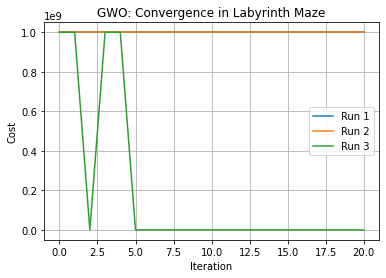


=== GWO ===
Final Costs: [1000000141.4213562, 1000000141.4213562, 149.78230494935698]
Min : 149.7823
Max : 1000000141.4214
Mean: 666666810.8750
Std : 471404516.8496

--- GA multi-run in Maze ---


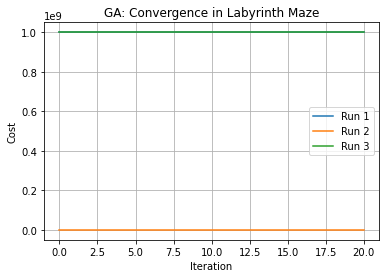


=== GA ===
Final Costs: [1000000123.7021102, 144.94728638205999, 1000000143.9570775]
Min : 144.9473
Max : 1000000143.9571
Mean: 666666804.2022
Std : 471404515.5501

--- PSO multi-run in Maze ---


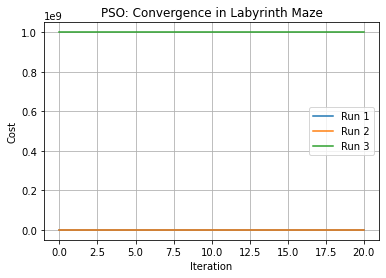


=== PSO ===
Final Costs: [133.4433368123388, 149.8656456392885, 1000000116.9349151]
Min : 133.4433
Max : 1000000116.9349
Mean: 333333466.7480
Std : 471404509.1381

--- SA multi-run in Maze ---


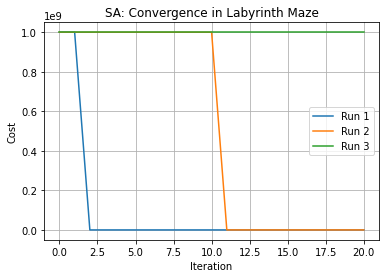


=== SA ===
Final Costs: [142.04797250370254, 202.1530866355082, 1000000119.2216947]
Min : 142.0480
Max : 1000000119.2217
Mean: 333333487.8076
Std : 471404495.8637

--- ABC multi-run in Maze ---


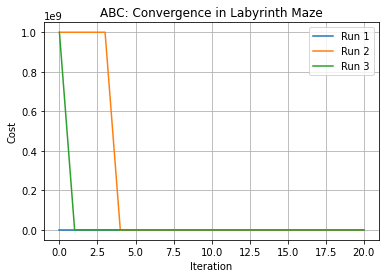


=== ABC ===
Final Costs: [160.4462975027226, 140.61311007247573, 162.81610975345365]
Min : 140.6131
Max : 162.8161
Mean: 154.6252
Std : 9.9551

--- SynergyHybrid multi-run in Maze ---


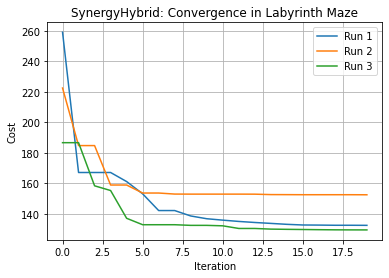


=== SynergyHybrid ===
Final Costs: [132.49070776487656, 152.52432134537526, 129.48950336755064]
Min : 129.4895
Max : 152.5243
Mean: 138.1682
Std : 10.2250


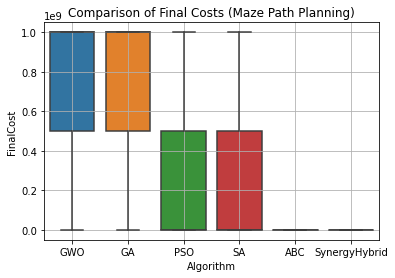

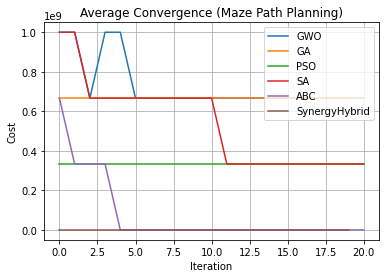


=== Animating best paths for each algorithm in labyrinth environment ===
Average iteration time per frame: nan seconds


/Users/gokturkdede/opt/anaconda3/lib/python3.9/site-packages/numpy/core/fromnumeric.py:3419: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/Users/gokturkdede/opt/anaconda3/lib/python3.9/site-packages/numpy/core/_methods.py:188: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


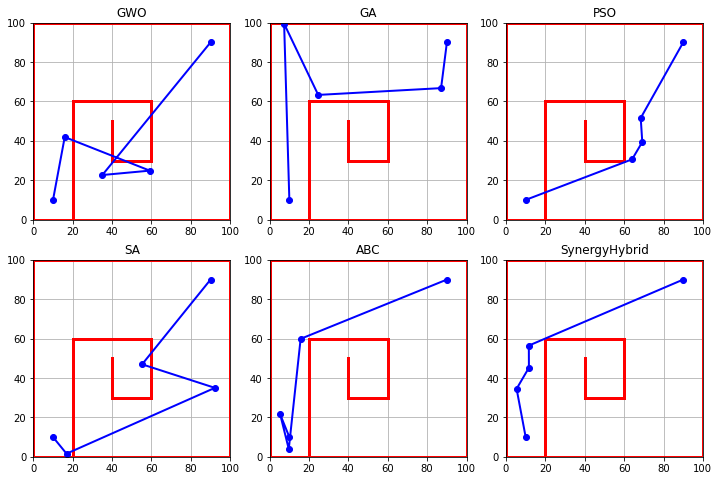

In [11]:
###############################################################################
# 0) JUPYTER NOTEBOOK SETUP
###############################################################################
%matplotlib inline

import numpy as np
import random
import time
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.animation as animation
import seaborn as sns
from IPython.display import HTML

###############################################################################
# 1) GLOBAL PARAMETERS
###############################################################################
NUM_RUNS       = 3       # how many runs per algorithm
MAX_ITERS      = 20      # how many iterations each run
N_WAYPOINTS    = 5       # total waypoints in the path
START_POINT    = (10,10) # start
END_POINT      = (90,90) # end

random.seed(42)
np.random.seed(42)

# Labyrinth line segments forming a maze. We ensure there's a feasible route.
# Each tuple is ((x1,y1),(x2,y2)).
# Also bounding rectangle around [0..100]^2.
LABYRINTH_WALLS = [
    # Outer rectangle
    ((0,0),(0,100)),
    ((0,100),(100,100)),
    ((100,100),(100,0)),
    ((100,0),(0,0)),

    # Some internal segments that do NOT block the path from (10,10) to (90,90).
    # We'll keep a corridor-like path open.

    # Vertical wall from (20, 0) to (20, 60).
    ((20,0),(20,60)),

    # Horizontal from (20,60) to (60,60).
    ((20,60),(60,60)),

    # Another vertical from (60,60) down to (60,30).
    ((60,60),(60,30)),

    # Then from (40,30) to (60,30). So there's a small corridor at y=30 from x=20..40 or x=60..80 etc.
    ((40,30),(60,30)),

    # Another from (40,30) up to (40,50).
    ((40,30),(40,50)),

    # So effectively, there's a path from (10,10) -> corridor around x<20, etc.
]

CURVATURE_ANGLE_DEG = 30.0  # angles < 30 => penalty +200

###############################################################################
# 2) LABYRINTH COLLISION CHECK
###############################################################################
def segment_intersects_segment(p1, p2, q1, q2):
    """
    Return True if line segments p1->p2 and q1->q2 intersect (or touch).
    We treat 'touching' as intersection => no path can even meet the wall.
    """
    p1= np.array(p1,dtype=float)
    p2= np.array(p2,dtype=float)
    q1= np.array(q1,dtype=float)
    q2= np.array(q2,dtype=float)

    # orientation function
    def orientation(a,b,c):
        # 0 => collinear, 1 => clockwise, 2 => counterclockwise
        val = (b[1]- a[1])*(c[0]- b[0]) - (b[0]- a[0])*(c[1]- b[1])
        if abs(val)<1e-12:
            return 0
        return 1 if val>0 else 2

    def on_segment(a,b,c):
        # check if b lies on segment a->c
        if min(a[0],c[0])<= b[0]<= max(a[0],c[0]) and min(a[1],c[1])<= b[1]<= max(a[1],c[1]):
            return True
        return False

    o1= orientation(p1,p2,q1)
    o2= orientation(p1,p2,q2)
    o3= orientation(q1,q2,p1)
    o4= orientation(q1,q2,p2)

    # general case
    if o1!= o2 and o3!= o4:
        return True
    # collinear special cases => treat as intersection
    if o1==0 and on_segment(p1,q1,p2): return True
    if o2==0 and on_segment(p1,q2,p2): return True
    if o3==0 and on_segment(q1,p1,q2): return True
    if o4==0 and on_segment(q1,p2,q2): return True
    return False

def path_intersects_labyrinth(path):
    """
    Return True if any path segment intersects or touches any labyrinth wall.
    """
    for i in range(len(path)-1):
        a1= path[i]
        a2= path[i+1]
        for (b1,b2) in LABYRINTH_WALLS:
            if segment_intersects_segment(a1,a2,b1,b2):
                return True
    return False

###############################################################################
# 3) COST FUNCTION
###############################################################################
def clip_path(path):
    """
    Keep start= START_POINT, end=END_POINT, clip interior to [0,100].
    """
    path[0]= START_POINT
    path[-1]= END_POINT
    for i in range(1,len(path)-1):
        path[i,0]= np.clip(path[i,0],0,100)
        path[i,1]= np.clip(path[i,1],0,100)
    return path

def path_cost_function(path):
    """
    Return (total_cost, dist_sum, penalty):
      - dist_sum = sum of Euclidian distances
      - penalty = (1e9 if intersects labyrinth walls) + curvature penalty
      - total_cost = dist_sum + penalty
    """
    dist_sum= 0.0
    for i in range(len(path)-1):
        dist_sum+= np.linalg.norm(path[i+1]- path[i])

    penalty= 0.0
    # labyrinth collision
    if path_intersects_labyrinth(path):
        penalty+= 1e9

    # curvature
    angle_thresh= np.deg2rad(CURVATURE_ANGLE_DEG)
    for i in range(1,len(path)-1):
        v1= path[i]- path[i-1]
        v2= path[i+1]- path[i]
        norm1= np.linalg.norm(v1)
        norm2= np.linalg.norm(v2)
        if norm1>1e-9 and norm2>1e-9:
            dot= np.dot(v1,v2)
            cos_th= dot/(norm1*norm2)
            cos_th= np.clip(cos_th, -1,1)
            angle= np.arccos(cos_th)
            if angle< angle_thresh:
                penalty+= 200

    total_cost= dist_sum+ penalty
    return (total_cost, dist_sum, penalty)

def create_random_path():
    """
    Returns an array of shape (N_WAYPOINTS,2),
    first row=start, last row=end, interior random in [0..100].
    """
    path= []
    path.append([START_POINT[0],START_POINT[1]])
    for _ in range(N_WAYPOINTS-2):
        x= random.uniform(0,100)
        y= random.uniform(0,100)
        path.append([x,y])
    path.append([END_POINT[0],END_POINT[1]])
    return np.array(path,dtype=float)

###############################################################################
# 4) META-HEURISTICS
###############################################################################
# We'll define GWO, GA, PSO, SA, ABC, then a synergy approach with all five.

class GWO:
    def __init__(self, pop_size=10):
        self.pop_size= pop_size
        self.paths= [create_random_path() for _ in range(pop_size)]
        self.fitness=[float('inf')]* pop_size
        self.alpha_path= None
        self.alpha_fit= float('inf')

    def update_alpha(self):
        idx= np.argmin(self.fitness)
        self.alpha_path= self.paths[idx].copy()
        self.alpha_fit= self.fitness[idx]

    def optimize(self, max_iter=1):
        cost_log=[]
        for i in range(self.pop_size):
            if self.fitness[i]== float('inf'):
                tot,dist,pen= path_cost_function(self.paths[i])
                self.fitness[i]= tot
        self.update_alpha()
        cost_log.append(self.alpha_fit)

        for it in range(max_iter):
            a= 2-2*((it+1)/max_iter)
            if a<0: a=0
            for i in range(self.pop_size):
                wolf= self.paths[i].copy()
                for w in range(1,N_WAYPOINTS-1):
                    r1,r2= np.random.rand(), np.random.rand()
                    A= 2*a*r1 - a
                    C= 2*r2
                    if self.alpha_path is not None:
                        D= np.abs(C*self.alpha_path[w]- wolf[w])
                        wolf[w]= self.alpha_path[w]- A*D
                wolf= clip_path(wolf)
                tot,dist,pen= path_cost_function(wolf)
                self.paths[i]= wolf
                self.fitness[i]= tot
            self.update_alpha()
            cost_log.append(self.alpha_fit)
        return cost_log, self.alpha_path, self.alpha_fit


class GA:
    def __init__(self, pop_size=10, cr=0.8, mr=0.1):
        self.pop_size= pop_size
        self.cr= cr
        self.mr= mr
        self.population= [create_random_path() for _ in range(pop_size)]
        self.fitness= [float('inf')]* pop_size
        self.best_path= None
        self.best_fit= float('inf')

    def crossover(self, p1,p2):
        if random.random()< self.cr and N_WAYPOINTS>2:
            idx= random.randint(1,N_WAYPOINTS-2)
            o1= np.vstack([p1[:idx], p2[idx:]])
            o2= np.vstack([p2[:idx], p1[idx:]])
            return o1,o2
        return p1.copy(), p2.copy()

    def mutate(self,path):
        mp= path.copy()
        for w in range(1,N_WAYPOINTS-1):
            if random.random()< self.mr:
                mp[w,0]= random.uniform(0,100)
                mp[w,1]= random.uniform(0,100)
        mp= clip_path(mp)
        return mp

    def optimize(self, max_iter=1):
        cost_log=[]
        # evaluate
        for i in range(self.pop_size):
            if self.fitness[i]== float('inf'):
                tot,dist,pen= path_cost_function(self.population[i])
                self.fitness[i]= tot
                if tot< self.best_fit:
                    self.best_fit= tot
                    self.best_path= self.population[i].copy()
        cost_log.append(self.best_fit)

        for it in range(max_iter):
            new_pop=[]
            # elitism
            best_idx= np.argmin(self.fitness)
            new_pop.append(self.population[best_idx].copy())

            while len(new_pop)< self.pop_size:
                i1= random.randint(0,self.pop_size-1)
                i2= random.randint(0,self.pop_size-1)
                o1,o2= self.crossover(self.population[i1], self.population[i2])
                o1= self.mutate(o1)
                o2= self.mutate(o2)
                new_pop.append(o1)
                if len(new_pop)< self.pop_size:
                    new_pop.append(o2)

            self.population= new_pop
            self.fitness= []
            for p in new_pop:
                tot,dist,pen= path_cost_function(p)
                self.fitness.append(tot)
            idx= np.argmin(self.fitness)
            if self.fitness[idx]< self.best_fit:
                self.best_fit= self.fitness[idx]
                self.best_path= self.population[idx].copy()

            cost_log.append(self.best_fit)
        return cost_log, self.best_path, self.best_fit


class PSO:
    def __init__(self, pop_size=10, w=0.5, c1=1.0, c2=1.0):
        self.pop_size= pop_size
        self.w= w
        self.c1= c1
        self.c2= c2
        self.positions= [create_random_path() for _ in range(pop_size)]
        self.vels= [np.zeros((N_WAYPOINTS,2)) for _ in range(pop_size)]
        self.fitness= [float('inf')]* pop_size
        self.pbest= [p.copy() for p in self.positions]
        self.pbest_fit= [float('inf')]* pop_size
        self.gbest= None
        self.gbest_fit= float('inf')

    def update_gbest(self):
        idx= np.argmin(self.fitness)
        if self.fitness[idx]< self.gbest_fit:
            self.gbest_fit= self.fitness[idx]
            self.gbest= self.positions[idx].copy()

    def optimize(self, max_iter=1):
        cost_log=[]
        for i in range(self.pop_size):
            if self.fitness[i]== float('inf'):
                tot,dist,pen= path_cost_function(self.positions[i])
                self.fitness[i]= tot
                self.pbest_fit[i]= tot
                self.pbest[i]= self.positions[i].copy()
                if tot< self.gbest_fit:
                    self.gbest_fit= tot
                    self.gbest= self.positions[i].copy()
        cost_log.append(self.gbest_fit)

        for it in range(max_iter):
            for i in range(self.pop_size):
                for w in range(1,N_WAYPOINTS-1):
                    r1,r2= np.random.rand(), np.random.rand()
                    inertia= self.w*self.vels[i][w]
                    cog= self.c1*r1*(self.pbest[i][w]- self.positions[i][w])
                    soc= self.c2*r2*(self.gbest[w] - self.positions[i][w])
                    new_vel= inertia+ cog+ soc
                    new_pos= self.positions[i][w]+ new_vel
                    new_pos= np.clip(new_pos, 0,100)
                    self.vels[i][w]= new_vel
                    self.positions[i][w]= new_pos
                tot,dist,pen= path_cost_function(self.positions[i])
                self.fitness[i]= tot
                if tot< self.pbest_fit[i]:
                    self.pbest_fit[i]= tot
                    self.pbest[i]= self.positions[i].copy()
            self.update_gbest()
            cost_log.append(self.gbest_fit)

        return cost_log, self.gbest, self.gbest_fit


class SA:
    def __init__(self, init_temp=1000, alpha=0.9):
        self.path= create_random_path()
        self.cost= float('inf')
        self.best_path= None
        self.best_cost= float('inf')
        self.T= init_temp
        self.alpha= alpha

    def optimize(self, max_iter=1):
        cost_log=[]
        if self.cost== float('inf'):
            tot,dist,pen= path_cost_function(self.path)
            self.cost= tot
            self.best_cost= tot
            self.best_path= self.path.copy()
        cost_log.append(self.best_cost)

        for it in range(max_iter):
            npath= self.path.copy()
            if N_WAYPOINTS>2:
                w= random.randint(1,N_WAYPOINTS-2)
                npath[w,0]= random.uniform(0,100)
                npath[w,1]= random.uniform(0,100)
            npath= clip_path(npath)
            tot,dist,pen= path_cost_function(npath)
            delta= tot- self.cost
            if delta<0:
                self.path= npath
                self.cost= tot
            else:
                prob= np.exp(-delta/self.T)
                if random.random()< prob:
                    self.path= npath
                    self.cost= tot
            if self.cost< self.best_cost:
                self.best_cost= self.cost
                self.best_path= self.path.copy()
            self.T*= self.alpha
            cost_log.append(self.best_cost)
        return cost_log, self.best_path, self.best_cost


class ABC:
    def __init__(self, pop_size=10, limit=5):
        self.pop_size= pop_size
        self.limit= limit
        self.foods= [create_random_path() for _ in range(pop_size)]
        self.fitness= [float('inf')]* pop_size
        self.trials= [0]* pop_size
        self.best_path= None
        self.best_cost= float('inf')

    def optimize(self, max_iter=1):
        cost_log=[]
        for i in range(self.pop_size):
            if self.fitness[i]== float('inf'):
                tot,dist,pen= path_cost_function(self.foods[i])
                self.fitness[i]= tot
                if tot< self.best_cost:
                    self.best_cost= tot
                    self.best_path= self.foods[i].copy()
        cost_log.append(self.best_cost)

        for it in range(max_iter):
            # Employed
            for i in range(self.pop_size):
                cand= self.foods[i].copy()
                if N_WAYPOINTS>2:
                    w= random.randint(1,N_WAYPOINTS-2)
                    cand[w,0]= random.uniform(0,100)
                    cand[w,1]= random.uniform(0,100)
                cand= clip_path(cand)
                tot,dist,pen= path_cost_function(cand)
                if tot< self.fitness[i]:
                    self.foods[i]= cand
                    self.fitness[i]= tot
                    self.trials[i]=0
                else:
                    self.trials[i]+= 1
                if tot< self.best_cost:
                    self.best_cost= tot
                    self.best_path= cand.copy()
            # scout
            for i in range(self.pop_size):
                if self.trials[i]> self.limit:
                    newp= create_random_path()
                    t,ds,pp= path_cost_function(newp)
                    self.foods[i]= newp
                    self.fitness[i]= t
                    self.trials[i]=0
                    if t< self.best_cost:
                        self.best_cost= t
                        self.best_path= newp.copy()
            cost_log.append(self.best_cost)
        return cost_log, self.best_path, self.best_cost

###############################################################################
# 5) SYNERGYHYBRID: merges GWO, GA, PSO, SA, ABC each iteration.
###############################################################################
class SynergyHybrid:
    """
    An improved synergy approach merging GWO, GA, PSO, SA, ABC each iteration.
    Gathers top solutions, partially re-inits worst solutions in each sub-algo.
    """
    def __init__(self):
        self.gwo= GWO()
        self.ga = GA()
        self.pso= PSO()
        self.sa = SA()
        self.abc= ABC()
        self.best_path= None
        self.best_cost= float('inf')

    def optimize(self, max_iter=1):
        cost_log=[]
        for it in range(max_iter):
            # each sub-algo => 1 iteration
            gwo_log, gwoP, gwoC= self.gwo.optimize(1)
            ga_log,  gaP,  gaC = self.ga.optimize(1)
            pso_log, psoP, psoC= self.pso.optimize(1)
            sa_log,  saP,  saC = self.sa.optimize(1)
            abc_log, abcP,abcC= self.abc.optimize(1)

            local= [
                ("GWO",gwoP,gwoC),
                ("GA", gaP,gaC),
                ("PSO",psoP,psoC),
                ("SA", saP,saC),
                ("ABC",abcP,abcC)
            ]
            local.sort(key=lambda x:x[2])
            if local[0][2]< self.best_cost:
                self.best_cost= local[0][2]
                self.best_path= local[0][1].copy()

            # partial reinit with top 3 solutions
            best3= local[:3]
            best_paths= [bp[1] for bp in best3]

            # GWO partial
            idxs_worst= np.argsort(self.gwo.fitness)[::-1]
            for i,bp in enumerate(best_paths):
                if i< len(idxs_worst):
                    w_idx= idxs_worst[i]
                    self.gwo.paths[w_idx]= bp.copy()
                    self.gwo.fitness[w_idx]= path_cost_function(bp)[0]
            self.gwo.update_alpha()

            # GA partial
            idxs_gaworst= np.argsort(self.ga.fitness)[::-1]
            for i,bp in enumerate(best_paths):
                if i< len(idxs_gaworst):
                    w_idx= idxs_gaworst[i]
                    self.ga.population[w_idx]= bp.copy()
                    c= path_cost_function(bp)[0]
                    self.ga.fitness[w_idx]= c
                    if c< self.ga.best_fit:
                        self.ga.best_fit= c
                        self.ga.best_path= bp.copy()

            # PSO partial
            idxs_psoworst= np.argsort(self.pso.fitness)[::-1]
            for i,bp in enumerate(best_paths):
                if i< len(idxs_psoworst):
                    w_idx= idxs_psoworst[i]
                    self.pso.positions[w_idx]= bp.copy()
                    t= path_cost_function(bp)[0]
                    self.pso.fitness[w_idx]= t
                    if t< self.pso.pbest_fit[w_idx]:
                        self.pso.pbest_fit[w_idx]= t
                        self.pso.pbest[w_idx]= bp.copy()
            self.pso.update_gbest()

            # SA partial => if new best is better than SA's current cost
            newBest= best3[0][1]  # top solution
            newCost= path_cost_function(newBest)[0]
            if newCost< self.sa.cost:
                self.sa.path= newBest.copy()
                self.sa.cost= newCost
                if newCost< self.sa.best_cost:
                    self.sa.best_cost= newCost
                    self.sa.best_path= newBest.copy()

            # ABC partial
            idxs_abcworst= np.argsort(self.abc.fitness)[::-1]
            for i,bp in enumerate(best_paths):
                if i< len(idxs_abcworst):
                    w_idx= idxs_abcworst[i]
                    tot= path_cost_function(bp)[0]
                    self.abc.foods[w_idx]= bp.copy()
                    self.abc.fitness[w_idx]= tot
                    if tot< self.abc.best_cost:
                        self.abc.best_cost= tot
                        self.abc.best_path= bp.copy()

            cost_log.append(self.best_cost)
        return cost_log, self.best_path, self.best_cost

###############################################################################
# 6) MULTI-RUN ANALYSIS ETC.
###############################################################################
def run_algorithm(algo_class, n_runs=NUM_RUNS, max_iter=MAX_ITERS):
    results=[]
    for _ in range(n_runs):
        algo= algo_class()
        c_log, b_path, b_cost= algo.optimize(max_iter)
        results.append((c_log,b_path,b_cost))
    return results

def analyze_results(algo_name, results):
    cost_logs   = [r[0] for r in results]
    final_costs = [r[2] for r in results]

    plt.figure()
    for i, c_log in enumerate(cost_logs):
        plt.plot(range(len(c_log)), c_log, label=f"Run {i+1}")
    plt.title(f"{algo_name}: Convergence in Labyrinth Maze")
    plt.xlabel("Iteration")
    plt.ylabel("Cost")
    plt.legend()
    plt.grid(True)
    plt.show()

    print(f"\n=== {algo_name} ===")
    print("Final Costs:", final_costs)
    print(f"Min : {min(final_costs):.4f}")
    print(f"Max : {max(final_costs):.4f}")
    print(f"Mean: {np.mean(final_costs):.4f}")
    print(f"Std : {np.std(final_costs):.4f}")

def boxplot_algorithms(final_costs_map):
    data=[]
    for algo, cost_list in final_costs_map.items():
        for c in cost_list:
            data.append([algo,c])
    df= pd.DataFrame(data, columns=["Algorithm","FinalCost"])
    plt.figure()
    sns.boxplot(x="Algorithm",y="FinalCost",data=df)
    plt.title("Comparison of Final Costs (Maze Path Planning)")
    plt.grid(True)
    plt.show()

def avg_convergence_plot(algos_logs):
    plt.figure()
    for algo_name, runs in algos_logs.items():
        max_len= max(len(x) for x in runs)
        arr_list=[]
        for c_log in runs:
            if len(c_log)< max_len:
                c_log= c_log+[c_log[-1]]*(max_len-len(c_log))
            arr_list.append(c_log)
        arr= np.array(arr_list)
        avg_curve= np.mean(arr, axis=0)
        plt.plot(range(max_len), avg_curve, label=algo_name)
    plt.title("Average Convergence (Maze Path Planning)")
    plt.xlabel("Iteration")
    plt.ylabel("Cost")
    plt.legend()
    plt.grid(True)
    plt.show()

###############################################################################
# 7) ANIMATION
###############################################################################
def animate_algorithms_path(algo_dict, max_iter=15):
    """
    We'll create subplots for each algorithm in 'algo_dict',
    each iteration calls optimize(1),
    we plot the best path in each subplot.
    We'll draw labyrinth walls in each subplot as well.

    We'll also record iteration_times for analysis.
    """
    names= list(algo_dict.keys())
    algos= [algo_dict[n]() for n in names]

    n_plots= len(names)
    cols=3
    rows= (n_plots + cols -1)//cols

    fig, axes= plt.subplots(rows, cols, figsize=(12,4*rows))
    axes= axes.flatten()

    for i, (ax,name) in enumerate(zip(axes, names)):
        if i<n_plots:
            ax.set_title(name)
            ax.set_xlim([0,100])
            ax.set_ylim([0,100])
            ax.set_aspect('equal','box')
            ax.grid(True)
            # labyrinth walls
            for (seg1, seg2) in LABYRINTH_WALLS:
                xdata= [seg1[0], seg2[0]]
                ydata= [seg1[1], seg2[1]]
                ax.plot(xdata,ydata,'r-', lw=3)
        else:
            ax.remove()

    lines=[]
    for i in range(n_plots):
        if i<len(axes):
            (ln,)= axes[i].plot([],[],'bo-', lw=2)
            lines.append(ln)
        else:
            lines.append(None)

    best_paths= [None]* n_plots
    iteration_times= []

    def init():
        iteration_times.clear()
        for ln in lines:
            if ln is not None:
                ln.set_data([],[])
        return lines

    def update(frame):
        start= time.time()
        for i,algo in enumerate(algos):
            c_log,b_path,b_cost= algo.optimize(1)
            best_paths[i]= b_path.copy()
        for i, ln in enumerate(lines):
            if ln is not None:
                path= best_paths[i]
                ln.set_data(path[:,0], path[:,1])
        end= time.time()
        iteration_times.append(end-start)
        return lines

    ani= animation.FuncAnimation(
        fig,
        update,
        frames=max_iter,
        init_func=init,
        blit=False,
        interval=800
    )
    return ani, iteration_times

def animation_to_html(ani):
    return HTML(ani.to_jshtml())

###############################################################################
# 8) MAIN
###############################################################################
def main():
    # We'll define 6 algorithms: GWO, GA, PSO, SA, ABC, SynergyHybrid
    # You can expand if you want to add more.

    algo_dict= {
        "GWO": GWO,
        "GA": GA,
        "PSO": PSO,
        "SA": SA,
        "ABC": ABC,
        "SynergyHybrid": SynergyHybrid
    }

    final_costs_map={}
    cost_logs_map={}

    # A) MULTI-RUN
    for algo_name, cls in algo_dict.items():
        print(f"\n--- {algo_name} multi-run in Maze ---")
        results= run_algorithm(cls, n_runs=NUM_RUNS, max_iter=MAX_ITERS)
        cost_runs=[]
        cost_finals=[]
        for (c_log, path, cost) in results:
            cost_runs.append(c_log)
            cost_finals.append(cost)
        cost_logs_map[algo_name]= cost_runs
        final_costs_map[algo_name]= cost_finals

        analyze_results(algo_name, results)

    # Box plot
    boxplot_algorithms(final_costs_map)

    # Average convergence
    avg_convergence_plot(cost_logs_map)

    # B) Animate
    print("\n=== Animating best paths for each algorithm in labyrinth environment ===")
    ani, iteration_times= animate_algorithms_path(algo_dict, max_iter=15)

    # Show iteration time summary
    avg_it_time= np.mean(iteration_times)
    print(f"Average iteration time per frame: {avg_it_time:.4f} seconds")

    return animation_to_html(ani)

# Run main
main()


=== GWO multi-run in Labyrinth Maze ===


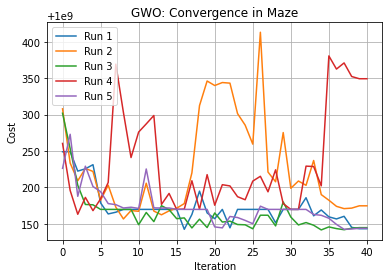


=== GWO ===
Final Costs: [1000000143.1640067, 1000000174.6273354, 1000000144.6461929, 1000000349.2395974, 1000000143.7503341]
Min : 1000000143.1640
Max : 1000000349.2396
Mean: 1000000191.0855
Std : 79.9716

=== GA multi-run in Labyrinth Maze ===


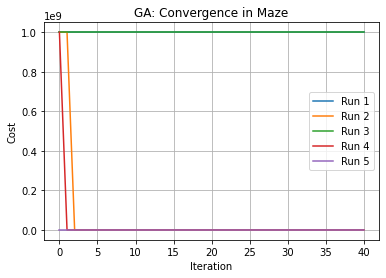


=== GA ===
Final Costs: [1000000145.6185379, 197.00995789018714, 1000000168.8574255, 230.01693122162902, 222.43888323261257]
Min : 197.0100
Max : 1000000168.8574
Mean: 400000192.7883
Std : 489897919.5299

=== PSO multi-run in Labyrinth Maze ===


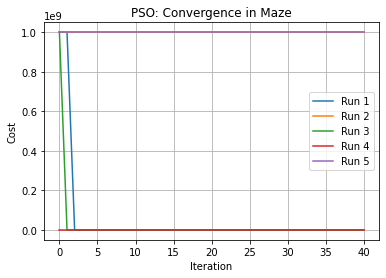


=== PSO ===
Final Costs: [218.73340662054161, 1000000136.8559004, 276.78548208797685, 230.35348731836152, 1000000122.8124913]
Min : 218.7334
Max : 1000000136.8559
Mean: 400000197.1082
Std : 489897893.6277

=== SA multi-run in Labyrinth Maze ===


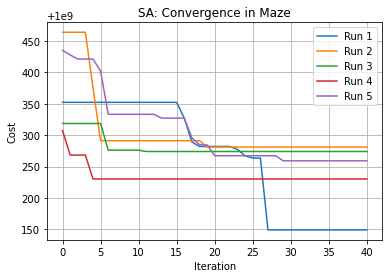


=== SA ===
Final Costs: [1000000149.1165931, 1000000281.2061397, 1000000274.0722965, 1000000230.3020134, 1000000259.2509834]
Min : 1000000149.1166
Max : 1000000281.2061
Mean: 1000000238.7896
Std : 48.1165

=== ABC multi-run in Labyrinth Maze ===


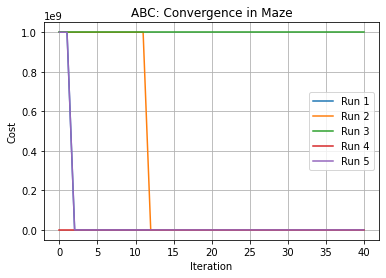


=== ABC ===
Final Costs: [181.42027490000805, 220.99050801162753, 1000000146.5917432, 224.9685215874156, 179.9187708157521]
Min : 179.9188
Max : 1000000146.5917
Mean: 200000190.7780
Std : 399999977.9069

=== SynergyHybrid multi-run in Labyrinth Maze ===


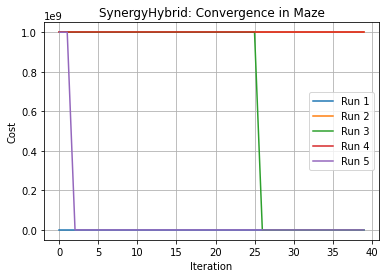


=== SynergyHybrid ===
Final Costs: [130.44516094681634, 1000000115.3992386, 167.6788561446542, 1000000117.7987797, 147.19931915972123]
Min : 130.4452
Max : 1000000117.7988
Mean: 400000135.7043
Std : 489897932.9573


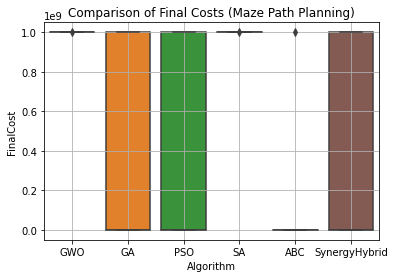

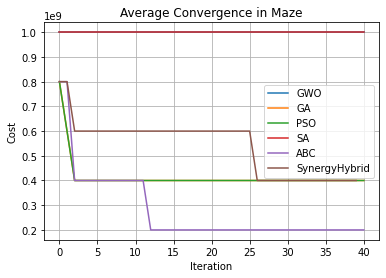


Animating best paths for each algorithm in labyrinth environment.
Avg iteration time per frame: nan seconds


/Users/gokturkdede/opt/anaconda3/lib/python3.9/site-packages/numpy/core/fromnumeric.py:3419: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/Users/gokturkdede/opt/anaconda3/lib/python3.9/site-packages/numpy/core/_methods.py:188: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


Computing best-known path using SynergyHybrid with 200 iterations...
Best-known cost from synergy run: 137.0411


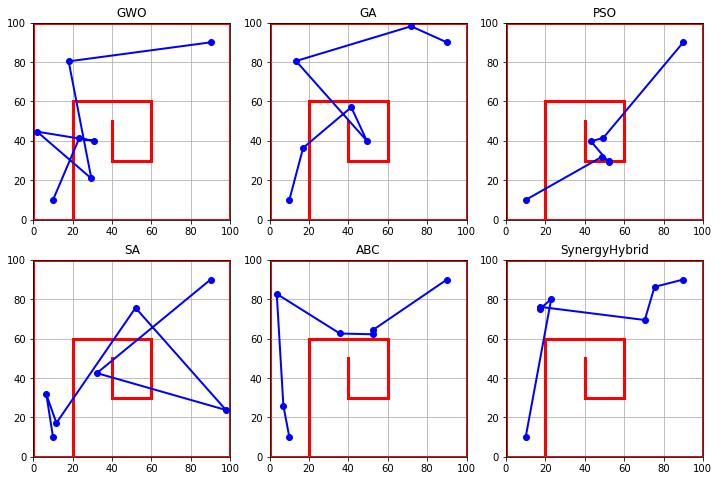

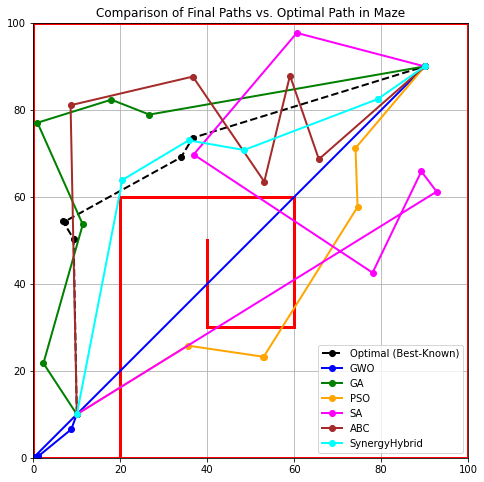

In [14]:
###############################################################################
# 0) JUPYTER NOTEBOOK SETUP
###############################################################################
%matplotlib inline

import numpy as np
import random
import time
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.animation as animation
import seaborn as sns
from IPython.display import HTML

###############################################################################
# 1) GLOBAL PARAMETERS
###############################################################################
NUM_RUNS         = 5       # how many runs per algorithm for final cost distribution
MAX_ITERS        = 40       # how many iterations each run
N_WAYPOINTS      = 7        # total waypoints
START_POINT      = (10,10)
END_POINT        = (90,90)

random.seed(42)
np.random.seed(42)

# Labyrinth walls as line segments. Each is ((x1,y1),(x2,y2)).
LABYRINTH_WALLS = [
    # Outer bounding
    ((0,0),(0,100)),
    ((0,100),(100,100)),
    ((100,100),(100,0)),
    ((100,0),(0,0)),

    # Internal walls
    ((20,0),(20,60)),
    ((20,60),(60,60)),
    ((60,60),(60,30)),
    ((40,30),(60,30)),
    ((40,30),(40,50)),
]

CURVATURE_ANGLE_DEG = 30.0  # angles < 30 => +200 penalty

###############################################################################
# 2) LABYRINTH COLLISION CHECK
###############################################################################
def segment_intersects_segment(p1, p2, q1, q2):
    """
    Return True if line segments p1->p2 and q1->q2 intersect or touch.
    """
    p1= np.array(p1,dtype=float)
    p2= np.array(p2,dtype=float)
    q1= np.array(q1,dtype=float)
    q2= np.array(q2,dtype=float)

    def orientation(a,b,c):
        # 0 => collinear, 1 => clockwise, 2 => counterclockwise
        val= (b[1]-a[1])*(c[0]-b[0]) - (b[0]-a[0])*(c[1]-b[1])
        if abs(val)<1e-12:
            return 0
        return 1 if val>0 else 2

    def on_segment(a,b,c):
        if min(a[0],c[0])<= b[0]<= max(a[0],c[0]) and min(a[1],c[1])<= b[1]<= max(a[1],c[1]):
            return True
        return False

    o1= orientation(p1,p2,q1)
    o2= orientation(p1,p2,q2)
    o3= orientation(q1,q2,p1)
    o4= orientation(q1,q2,p2)

    if o1!= o2 and o3!= o4:
        return True
    if o1==0 and on_segment(p1,q1,p2): return True
    if o2==0 and on_segment(p1,q2,p2): return True
    if o3==0 and on_segment(q1,p1,q2): return True
    if o4==0 and on_segment(q1,p2,q2): return True
    return False

def path_intersects_labyrinth(path):
    """
    Return True if any path segment touches any labyrinth wall.
    """
    for i in range(len(path)-1):
        a1= path[i]
        a2= path[i+1]
        for (b1,b2) in LABYRINTH_WALLS:
            if segment_intersects_segment(a1,a2,b1,b2):
                return True
    return False

###############################################################################
# 3) COST FUNCTION
###############################################################################
def clip_path(path):
    """
    Keep start/end fixed, interior in [0,100].
    """
    path[0]= START_POINT
    path[-1]= END_POINT
    for i in range(1,len(path)-1):
        path[i,0]= np.clip(path[i,0],0,100)
        path[i,1]= np.clip(path[i,1],0,100)
    return path

def path_cost_function(path):
    """
    Return (total_cost, dist_sum, penalty).
    If path intersects labyrinth => penalty += 1e9
    If angle < 30 => penalty += 200 each time.
    """
    dist_sum= 0.0
    for i in range(len(path)-1):
        dist_sum+= np.linalg.norm(path[i+1]- path[i])

    penalty= 0.0
    if path_intersects_labyrinth(path):
        penalty+= 1e9

    angle_thresh= np.deg2rad(CURVATURE_ANGLE_DEG)
    for i in range(1, len(path)-1):
        v1= path[i]- path[i-1]
        v2= path[i+1]- path[i]
        n1= np.linalg.norm(v1)
        n2= np.linalg.norm(v2)
        if n1>1e-9 and n2>1e-9:
            cos_th= np.dot(v1,v2)/(n1*n2)
            cos_th= np.clip(cos_th, -1,1)
            angle= np.arccos(cos_th)
            if angle< angle_thresh:
                penalty+= 200

    total= dist_sum + penalty
    return (total, dist_sum, penalty)

def create_random_path():
    """
    Return shape (N_WAYPOINTS,2).
    """
    path= []
    path.append([START_POINT[0],START_POINT[1]])
    for _ in range(N_WAYPOINTS-2):
        x= random.uniform(0,100)
        y= random.uniform(0,100)
        path.append([x,y])
    path.append([END_POINT[0],END_POINT[1]])
    return np.array(path,dtype=float)

###############################################################################
# 4) META-HEURISTICS
###############################################################################
# We'll define GWO, GA, PSO, SA, ABC quickly, then a synergy approach.

class GWO:
    def __init__(self, pop_size=10):
        self.pop_size= pop_size
        self.paths= [create_random_path() for _ in range(pop_size)]
        self.fitness= [float('inf')]* pop_size
        self.alpha_path= None
        self.alpha_fit= float('inf')

    def update_alpha(self):
        idx= np.argmin(self.fitness)
        self.alpha_path= self.paths[idx].copy()
        self.alpha_fit= self.fitness[idx]

    def optimize(self, max_iter=1):
        cost_log=[]
        # Evaluate
        for i in range(self.pop_size):
            if self.fitness[i]== float('inf'):
                tot,dist,pen= path_cost_function(self.paths[i])
                self.fitness[i]= tot
        self.update_alpha()
        cost_log.append(self.alpha_fit)

        for it in range(max_iter):
            a= 2 - 2*((it+1)/max_iter)
            if a<0: a=0
            for i in range(self.pop_size):
                wolf= self.paths[i].copy()
                for w in range(1,N_WAYPOINTS-1):
                    r1,r2= np.random.rand(), np.random.rand()
                    A= 2*a*r1 - a
                    C= 2*r2
                    if self.alpha_path is not None:
                        D= np.abs(C*self.alpha_path[w]- wolf[w])
                        wolf[w]= self.alpha_path[w]- A*D
                wolf= clip_path(wolf)
                tot,dist,pen= path_cost_function(wolf)
                self.paths[i]= wolf
                self.fitness[i]= tot
            self.update_alpha()
            cost_log.append(self.alpha_fit)
        return cost_log, self.alpha_path, self.alpha_fit


class GA:
    def __init__(self, pop_size=10, cr=0.8, mr=0.1):
        self.pop_size= pop_size
        self.cr= cr
        self.mr= mr
        self.population= [create_random_path() for _ in range(pop_size)]
        self.fitness= [float('inf')]* pop_size
        self.best_path= None
        self.best_fit= float('inf')

    def crossover(self,p1,p2):
        if random.random()< self.cr and (N_WAYPOINTS>2):
            idx= random.randint(1, N_WAYPOINTS-2)
            o1= np.vstack([p1[:idx], p2[idx:]])
            o2= np.vstack([p2[:idx], p1[idx:]])
            return o1,o2
        return p1.copy(), p2.copy()

    def mutate(self,path):
        mp= path.copy()
        for w in range(1,N_WAYPOINTS-1):
            if random.random()< self.mr:
                mp[w,0]= random.uniform(0,100)
                mp[w,1]= random.uniform(0,100)
        mp= clip_path(mp)
        return mp

    def optimize(self,max_iter=1):
        cost_log=[]
        for i in range(self.pop_size):
            if self.fitness[i]== float('inf'):
                t,d,p= path_cost_function(self.population[i])
                self.fitness[i]= t
                if t< self.best_fit:
                    self.best_fit= t
                    self.best_path= self.population[i].copy()
        cost_log.append(self.best_fit)

        for it in range(max_iter):
            new_pop= []
            # elitism
            best_idx= np.argmin(self.fitness)
            new_pop.append(self.population[best_idx].copy())

            while len(new_pop)< self.pop_size:
                i1= random.randint(0,self.pop_size-1)
                i2= random.randint(0,self.pop_size-1)
                o1,o2= self.crossover(self.population[i1], self.population[i2])
                o1= self.mutate(o1)
                o2= self.mutate(o2)
                new_pop.append(o1)
                if len(new_pop)< self.pop_size:
                    new_pop.append(o2)

            self.population= new_pop
            self.fitness= []
            for p in new_pop:
                t,d,pp= path_cost_function(p)
                self.fitness.append(t)
            idx= np.argmin(self.fitness)
            if self.fitness[idx]< self.best_fit:
                self.best_fit= self.fitness[idx]
                self.best_path= self.population[idx].copy()
            cost_log.append(self.best_fit)
        return cost_log, self.best_path, self.best_fit


class PSO:
    def __init__(self, pop_size=10, w=0.5, c1=1.0, c2=1.0):
        self.pop_size= pop_size
        self.w= w
        self.c1= c1
        self.c2= c2
        self.positions= [create_random_path() for _ in range(pop_size)]
        self.vels= [np.zeros((N_WAYPOINTS,2)) for _ in range(pop_size)]
        self.fitness= [float('inf')]* pop_size
        self.pbest= [p.copy() for p in self.positions]
        self.pbest_fit= [float('inf')]* pop_size
        self.gbest= None
        self.gbest_fit= float('inf')

    def update_gbest(self):
        idx= np.argmin(self.fitness)
        if self.fitness[idx]< self.gbest_fit:
            self.gbest_fit= self.fitness[idx]
            self.gbest= self.positions[idx].copy()

    def optimize(self,max_iter=1):
        cost_log=[]
        for i in range(self.pop_size):
            if self.fitness[i]==float('inf'):
                total,dist,pen= path_cost_function(self.positions[i])
                self.fitness[i]= total
                self.pbest_fit[i]= total
                self.pbest[i]= self.positions[i].copy()
                if total< self.gbest_fit:
                    self.gbest_fit= total
                    self.gbest= self.positions[i].copy()
        cost_log.append(self.gbest_fit)

        for it in range(max_iter):
            for i in range(self.pop_size):
                for w in range(1,N_WAYPOINTS-1):
                    r1,r2= np.random.rand(), np.random.rand()
                    inertia= self.w*self.vels[i][w]
                    cog= self.c1*r1*(self.pbest[i][w]- self.positions[i][w])
                    soc= self.c2*r2*(self.gbest[w]     - self.positions[i][w])
                    new_vel= inertia+ cog+ soc
                    new_pos= self.positions[i][w]+ new_vel
                    new_pos= np.clip(new_pos,0,100)
                    self.vels[i][w]= new_vel
                    self.positions[i][w]= new_pos

                t,d,pp= path_cost_function(self.positions[i])
                self.fitness[i]= t
                if t< self.pbest_fit[i]:
                    self.pbest_fit[i]= t
                    self.pbest[i]= self.positions[i].copy()
            self.update_gbest()
            cost_log.append(self.gbest_fit)

        return cost_log, self.gbest, self.gbest_fit


class SA:
    def __init__(self, init_temp=1000, alpha=0.9):
        self.path= create_random_path()
        self.cost= float('inf')
        self.best_path= None
        self.best_cost= float('inf')
        self.T= init_temp
        self.alpha= alpha

    def optimize(self, max_iter=1):
        cost_log=[]
        if self.cost== float('inf'):
            tot,dist,pen= path_cost_function(self.path)
            self.cost= tot
            self.best_cost= tot
            self.best_path= self.path.copy()
        cost_log.append(self.best_cost)

        for it in range(max_iter):
            npath= self.path.copy()
            if N_WAYPOINTS>2:
                w= random.randint(1,N_WAYPOINTS-2)
                npath[w,0]= random.uniform(0,100)
                npath[w,1]= random.uniform(0,100)
            npath= clip_path(npath)
            total,dist,pen= path_cost_function(npath)
            delta= total- self.cost
            if delta<0:
                self.path= npath
                self.cost= total
            else:
                prob= np.exp(-delta/self.T)
                if random.random()< prob:
                    self.path= npath
                    self.cost= total
            if self.cost< self.best_cost:
                self.best_cost= self.cost
                self.best_path= self.path.copy()
            self.T*= self.alpha
            cost_log.append(self.best_cost)
        return cost_log, self.best_path, self.best_cost


class ABC:
    def __init__(self, pop_size=10, limit=5):
        self.pop_size= pop_size
        self.limit= limit
        self.foods= [create_random_path() for _ in range(pop_size)]
        self.fitness=[float('inf')]* pop_size
        self.trials= [0]* pop_size
        self.best_path= None
        self.best_cost= float('inf')

    def optimize(self, max_iter=1):
        cost_log=[]
        for i in range(self.pop_size):
            if self.fitness[i]==float('inf'):
                tot,dist,pen= path_cost_function(self.foods[i])
                self.fitness[i]= tot
                if tot< self.best_cost:
                    self.best_cost= tot
                    self.best_path= self.foods[i].copy()
        cost_log.append(self.best_cost)

        for it in range(max_iter):
            # Employed
            for i in range(self.pop_size):
                cand= self.foods[i].copy()
                if N_WAYPOINTS>2:
                    w= random.randint(1,N_WAYPOINTS-2)
                    cand[w,0]= random.uniform(0,100)
                    cand[w,1]= random.uniform(0,100)
                cand= clip_path(cand)
                tot,ds,pp= path_cost_function(cand)
                if tot< self.fitness[i]:
                    self.foods[i]= cand
                    self.fitness[i]= tot
                    self.trials[i]=0
                else:
                    self.trials[i]+=1
                if tot< self.best_cost:
                    self.best_cost= tot
                    self.best_path= cand.copy()

            # scout
            for i in range(self.pop_size):
                if self.trials[i]> self.limit:
                    newp= create_random_path()
                    t,d,p= path_cost_function(newp)
                    self.foods[i]= newp
                    self.fitness[i]= t
                    self.trials[i]=0
                    if t< self.best_cost:
                        self.best_cost= t
                        self.best_path= newp.copy()

            cost_log.append(self.best_cost)
        return cost_log, self.best_path, self.best_cost

###############################################################################
# 5) SYNERGY HYBRID (merging GWO, GA, PSO, SA, ABC)
###############################################################################
class SynergyHybrid:
    """
    A synergy approach: each iteration, GWO, GA, PSO, SA, ABC each do 1 iteration,
    gather best solutions, partially re-init worst solutions from each.
    """
    def __init__(self):
        self.gwo= GWO()
        self.ga = GA()
        self.pso= PSO()
        self.sa = SA()
        self.abc= ABC()
        self.best_path= None
        self.best_cost= float('inf')

    def optimize(self, max_iter=1):
        cost_log=[]
        for it in range(max_iter):
            gwo_log,gwoP,gwoC= self.gwo.optimize(1)
            ga_log, gaP, gaC  = self.ga.optimize(1)
            pso_log,psoP,psoC= self.pso.optimize(1)
            sa_log, saP, saC  = self.sa.optimize(1)
            abc_log,abcP,abcC= self.abc.optimize(1)

            local= [
                ("GWO",gwoP,gwoC),
                ("GA", gaP,gaC),
                ("PSO",psoP,psoC),
                ("SA", saP,saC),
                ("ABC",abcP,abcC)
            ]
            local.sort(key=lambda x:x[2])
            if local[0][2]< self.best_cost:
                self.best_cost= local[0][2]
                self.best_path= local[0][1].copy()

            # partial re-init with top 3 solutions
            best3= local[:3]
            best_paths= [bp[1] for bp in best3]

            # GWO partial
            idxs_worst= np.argsort(self.gwo.fitness)[::-1]
            for i,bp in enumerate(best_paths):
                if i< len(idxs_worst):
                    w_idx= idxs_worst[i]
                    c= path_cost_function(bp)[0]
                    self.gwo.paths[w_idx]= bp.copy()
                    self.gwo.fitness[w_idx]= c
            self.gwo.update_alpha()

            # GA partial
            idxs_gaworst= np.argsort(self.ga.fitness)[::-1]
            for i,bp in enumerate(best_paths):
                if i< len(idxs_gaworst):
                    w_idx= idxs_gaworst[i]
                    c= path_cost_function(bp)[0]
                    self.ga.population[w_idx]= bp.copy()
                    self.ga.fitness[w_idx]= c
                    if c< self.ga.best_fit:
                        self.ga.best_fit= c
                        self.ga.best_path= bp.copy()

            # PSO partial
            idxs_psoworst= np.argsort(self.pso.fitness)[::-1]
            for i,bp in enumerate(best_paths):
                if i< len(idxs_psoworst):
                    w_idx= idxs_psoworst[i]
                    total= path_cost_function(bp)[0]
                    self.pso.positions[w_idx]= bp.copy()
                    self.pso.fitness[w_idx]= total
                    if total< self.pso.pbest_fit[w_idx]:
                        self.pso.pbest_fit[w_idx]= total
                        self.pso.pbest[w_idx]= bp.copy()
            self.pso.update_gbest()

            # SA partial
            bestLocal= best3[0][1]  # top solution
            bestLocalCost= path_cost_function(bestLocal)[0]
            if bestLocalCost< self.sa.cost:
                self.sa.path= bestLocal.copy()
                self.sa.cost= bestLocalCost
                if bestLocalCost< self.sa.best_cost:
                    self.sa.best_cost= bestLocalCost
                    self.sa.best_path= bestLocal.copy()

            # ABC partial
            idxs_abcworst= np.argsort(self.abc.fitness)[::-1]
            for i,bp in enumerate(best_paths):
                if i< len(idxs_abcworst):
                    w_idx= idxs_abcworst[i]
                    c= path_cost_function(bp)[0]
                    self.abc.foods[w_idx]= bp.copy()
                    self.abc.fitness[w_idx]= c
                    if c< self.abc.best_cost:
                        self.abc.best_cost= c
                        self.abc.best_path= bp.copy()

            cost_log.append(self.best_cost)
        return cost_log, self.best_path, self.best_cost

###############################################################################
# 6) MULTI-RUN ANALYSIS
###############################################################################
def run_algorithm(algo_class, n_runs=NUM_RUNS, max_iter=MAX_ITERS):
    """
    Return a list of (cost_log, best_path, final_cost) for each run.
    """
    results=[]
    for _ in range(n_runs):
        algo= algo_class()
        c_log, b_path, b_cost= algo.optimize(max_iter)
        results.append((c_log,b_path,b_cost))
    return results

def analyze_results(algo_name, results):
    cost_logs   = [r[0] for r in results]
    final_costs = [r[2] for r in results]

    plt.figure()
    for i,c_log in enumerate(cost_logs):
        plt.plot(range(len(c_log)), c_log, label=f"Run {i+1}")
    plt.title(f"{algo_name}: Convergence in Maze")
    plt.xlabel("Iteration")
    plt.ylabel("Cost")
    plt.legend()
    plt.grid(True)
    plt.show()

    print(f"\n=== {algo_name} ===")
    print("Final Costs:", final_costs)
    print(f"Min : {min(final_costs):.4f}")
    print(f"Max : {max(final_costs):.4f}")
    print(f"Mean: {np.mean(final_costs):.4f}")
    print(f"Std : {np.std(final_costs):.4f}")

def boxplot_algorithms(algos_map):
    data=[]
    for algo, cost_list in algos_map.items():
        for c in cost_list:
            data.append([algo, c])
    df= pd.DataFrame(data, columns=["Algorithm","FinalCost"])
    plt.figure()
    sns.boxplot(x="Algorithm", y="FinalCost", data=df)
    plt.title("Comparison of Final Costs (Maze Path Planning)")
    plt.grid(True)
    plt.show()

def avg_convergence_plot(algos_logs):
    plt.figure()
    for algo_name, runs in algos_logs.items():
        max_len= max(len(x) for x in runs)
        arr_list=[]
        for c_log in runs:
            if len(c_log)< max_len:
                c_log= c_log+[c_log[-1]]*(max_len-len(c_log))
            arr_list.append(c_log)
        arr= np.array(arr_list)
        avg_curve= np.mean(arr, axis=0)
        plt.plot(range(max_len), avg_curve, label=algo_name)
    plt.title("Average Convergence in Maze")
    plt.xlabel("Iteration")
    plt.ylabel("Cost")
    plt.legend()
    plt.grid(True)
    plt.show()

###############################################################################
# 7) ANIMATION
###############################################################################
def animate_algorithms_path(algo_dict, max_iter=15):
    """
    Create subplots for each algorithm in algo_dict.
    Each iteration calls optimize(1) => best path => plot in each subplot.
    Also track iteration_time in a list.
    """
    names= list(algo_dict.keys())
    algos= [algo_dict[n]() for n in names]

    n_plots= len(names)
    cols=3
    rows= (n_plots+cols-1)// cols

    fig, axes= plt.subplots(rows,cols, figsize=(12,4*rows))
    axes= axes.flatten()

    for i,(ax,name) in enumerate(zip(axes,names)):
        if i<n_plots:
            ax.set_title(name)
            ax.set_xlim([0,100])
            ax.set_ylim([0,100])
            ax.set_aspect('equal','box')
            ax.grid(True)
            # draw labyrinth walls
            for (seg1, seg2) in LABYRINTH_WALLS:
                xdat= [seg1[0], seg2[0]]
                ydat= [seg1[1], seg2[1]]
                ax.plot(xdat,ydat,'r-', lw=3)
        else:
            ax.remove()

    lines=[]
    for i in range(n_plots):
        if i< len(axes):
            (ln,)= axes[i].plot([],[],'bo-', lw=2)
            lines.append(ln)
        else:
            lines.append(None)

    best_paths= [None]* n_plots
    iteration_times= []

    def init():
        iteration_times.clear()
        for ln in lines:
            if ln:
                ln.set_data([],[])
        return lines

    def update(frame):
        start_t= time.time()
        for i,algo in enumerate(algos):
            c_log,b_path,b_cost= algo.optimize(1)
            best_paths[i]= b_path.copy()
        for i,ln in enumerate(lines):
            if ln is not None:
                path= best_paths[i]
                ln.set_data(path[:,0], path[:,1])
        end_t= time.time()
        iteration_times.append(end_t- start_t)
        return lines

    ani= animation.FuncAnimation(
        fig,
        update,
        frames=max_iter,
        init_func=init,
        blit=False,
        interval=800
    )
    return ani, iteration_times

def animation_to_html(ani):
    return HTML(ani.to_jshtml())

###############################################################################
# 8) FIND OPTIMAL (OR BEST-KNOWN) PATH & COMPARE
###############################################################################
def compute_optimal_path():
    """
    We'll run SynergyHybrid with large iteration, e.g. 200,
    then store its best_path as 'optimal_path' (best-known).
    """
    print("Computing best-known path using SynergyHybrid with 200 iterations...")
    big_iter= 200
    synergy= SynergyHybrid()
    synergy_log, synergy_best_path, synergy_best_cost= synergy.optimize(big_iter)
    print(f"Best-known cost from synergy run: {synergy_best_cost:.4f}")
    return synergy_best_path.copy(), synergy_best_cost

def compare_with_optimal(algos_dict, optimal_path):
    """
    For each algorithm, we run it with MAX_ITERS, gather final best path,
    then plot them side-by-side with the 'optimal_path' in a single figure.
    """
    final_paths= {}
    for algo_name, cls in algos_dict.items():
        algo= cls()
        c_log,b_path,b_cost= algo.optimize(MAX_ITERS)
        final_paths[algo_name]= b_path.copy()

    # Plot in one figure
    plt.figure(figsize=(8,8))
    plt.title("Comparison of Final Paths vs. Optimal Path in Maze")
    plt.xlim([0,100])
    plt.ylim([0,100])
    plt.gca().set_aspect('equal','box')
    plt.grid(True)

    # Draw labyrinth walls
    for (seg1,seg2) in LABYRINTH_WALLS:
        xdat= [seg1[0], seg2[0]]
        ydat= [seg1[1], seg2[1]]
        plt.plot(xdat, ydat,'r-', lw=3)

    # Plot optimal in black
    plt.plot(optimal_path[:,0], optimal_path[:,1], 'ko--', lw=2, label="Optimal (Best-Known)")

    # Plot each algo
    color_list= ["blue","green","orange","magenta","brown","cyan","purple","gray"]
    i=0
    for algo_name in algos_dict.keys():
        path= final_paths[algo_name]
        c= color_list[i% len(color_list)]
        plt.plot(path[:,0], path[:,1], marker='o', color=c, lw=2, label=algo_name)
        i+=1
    plt.legend()
    plt.show()

###############################################################################
# 9) MAIN
###############################################################################
def main():
    # Define the algorithms
    algo_dict= {
        "GWO": GWO,
        "GA": GA,
        "PSO": PSO,
        "SA": SA,
        "ABC": ABC,
        "SynergyHybrid": SynergyHybrid
    }

    final_costs_map={}
    cost_logs_map={}

    # A) Multi-run analysis
    for algo_name, cls in algo_dict.items():
        print(f"\n=== {algo_name} multi-run in Labyrinth Maze ===")
        results= run_algorithm(cls, n_runs=NUM_RUNS, max_iter=MAX_ITERS)
        cost_runs=[]
        cost_finals=[]
        for (c_log, path, cost) in results:
            cost_runs.append(c_log)
            cost_finals.append(cost)
        cost_logs_map[algo_name]= cost_runs
        final_costs_map[algo_name]= cost_finals

        analyze_results(algo_name, results)

    # Box plot
    boxplot_algorithms(final_costs_map)

    # Average convergence
    avg_convergence_plot(cost_logs_map)

    # B) Animate
    print("\nAnimating best paths for each algorithm in labyrinth environment.")
    ani, iteration_times= animate_algorithms_path(algo_dict, max_iter=15)
    avg_itime= np.mean(iteration_times)
    print(f"Avg iteration time per frame: {avg_itime:.4f} seconds")

    display(animation_to_html(ani))

    # C) Compute an 'optimal' or best-known path using synergy with big iteration
    optimum_path, optimum_cost= compute_optimal_path()

    # D) Compare each algorithm's final path to optimum
    compare_with_optimal(algo_dict, optimum_path)

# Run main
main()


=== Maze: Maze #1 ===

--- GWO multi-run analysis ---


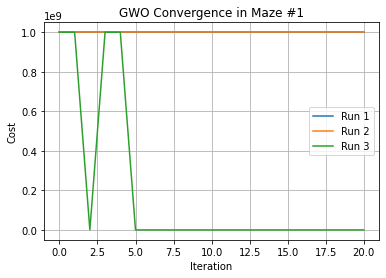

Final Costs for GWO: [1000000141.4213562, 1000000141.4213562, 149.78230494935698]
 Min= 149.7823
 Max= 1000000141.4214
 Mean= 666666810.8750
 Std= 471404516.8496

--- GA multi-run analysis ---


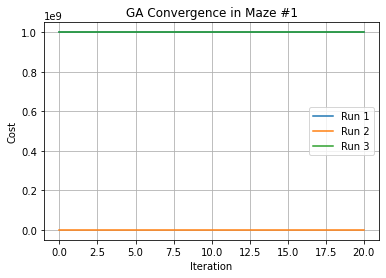

Final Costs for GA: [1000000123.7021102, 144.94728638205999, 1000000143.9570775]
 Min= 144.9473
 Max= 1000000143.9571
 Mean= 666666804.2022
 Std= 471404515.5501

--- PSO multi-run analysis ---


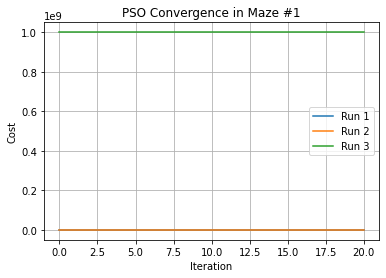

Final Costs for PSO: [133.4433368123388, 149.8656456392885, 1000000116.9349151]
 Min= 133.4433
 Max= 1000000116.9349
 Mean= 333333466.7480
 Std= 471404509.1381

--- SA multi-run analysis ---


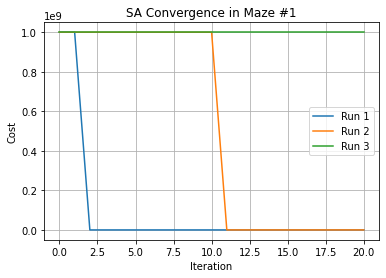

Final Costs for SA: [142.04797250370254, 202.1530866355082, 1000000119.2216947]
 Min= 142.0480
 Max= 1000000119.2217
 Mean= 333333487.8076
 Std= 471404495.8637

--- ABC multi-run analysis ---


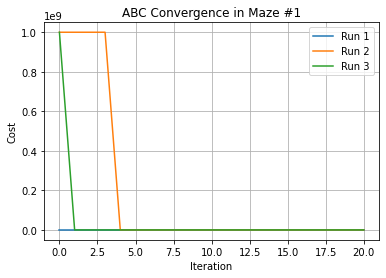

Final Costs for ABC: [160.4462975027226, 140.61311007247573, 162.81610975345365]
 Min= 140.6131
 Max= 162.8161
 Mean= 154.6252
 Std= 9.9551

--- Synergy multi-run analysis ---


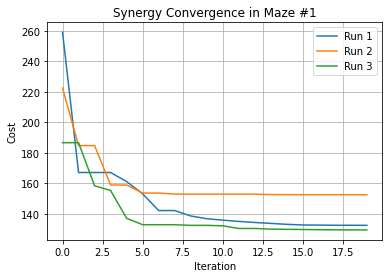

Final Costs for Synergy: [132.49070776487656, 152.52432134537526, 129.48950336755064]
 Min= 129.4895
 Max= 152.5243
 Mean= 138.1682
 Std= 10.2250


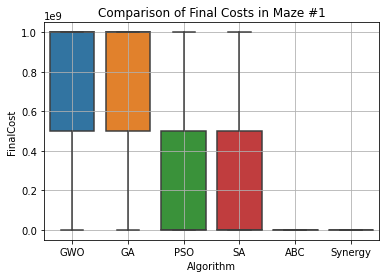

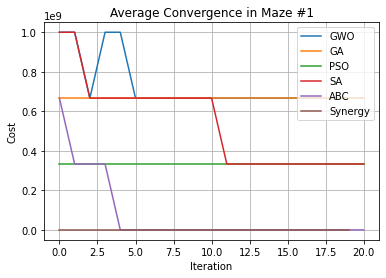


Animating best paths for Maze #1 ...
Avg iteration time per frame: nan s in Maze #1


/Users/gokturkdede/opt/anaconda3/lib/python3.9/site-packages/numpy/core/fromnumeric.py:3419: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/Users/gokturkdede/opt/anaconda3/lib/python3.9/site-packages/numpy/core/_methods.py:188: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)



Computing best-known path for Maze #1 using synergy with 200 iters...
Best-known cost found= 137.4447


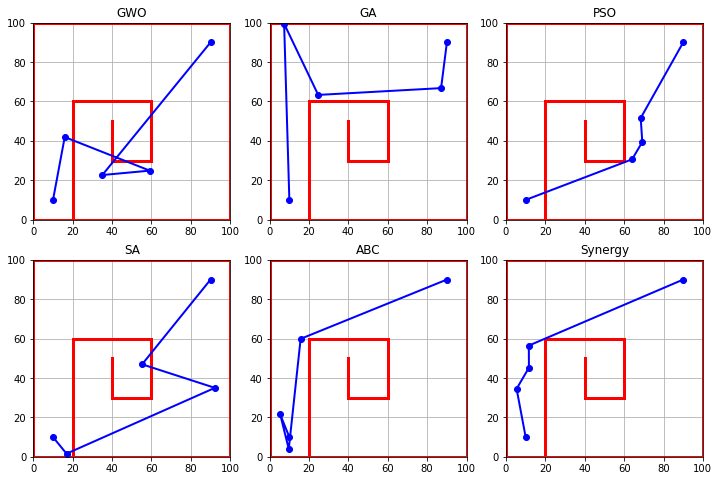

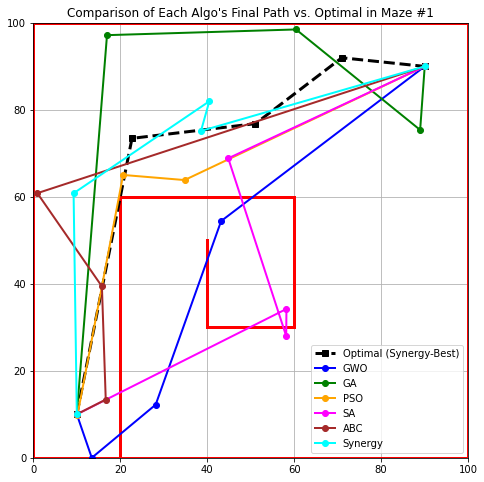


=== Maze: Maze #2 ===

--- GWO multi-run analysis ---


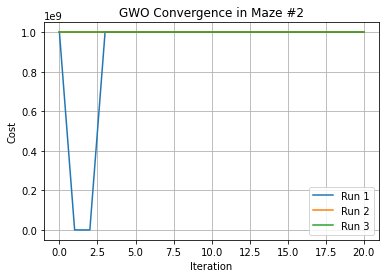

Final Costs for GWO: [1000000117.7799412, 1000000131.9841838, 1000000141.4213562]
 Min= 1000000117.7799
 Max= 1000000141.4214
 Mean= 1000000130.3952
 Std= 9.7168

--- GA multi-run analysis ---


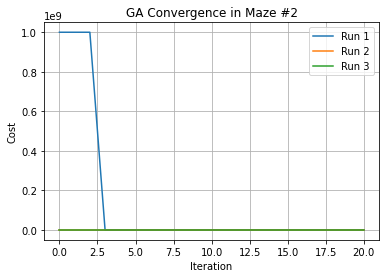

Final Costs for GA: [149.6893641829132, 136.8204640690688, 136.8204587608435]
 Min= 136.8205
 Max= 149.6894
 Mean= 141.1101
 Std= 6.0665

--- PSO multi-run analysis ---


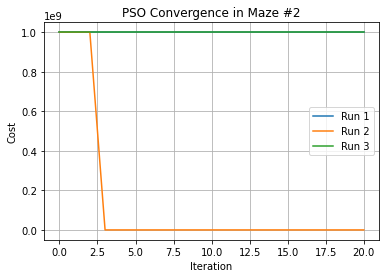

Final Costs for PSO: [1000000116.402126, 116.93054133174795, 1000000118.5756481]
 Min= 116.9305
 Max= 1000000118.5756
 Mean= 666666783.9694
 Std= 471404521.0542

--- SA multi-run analysis ---


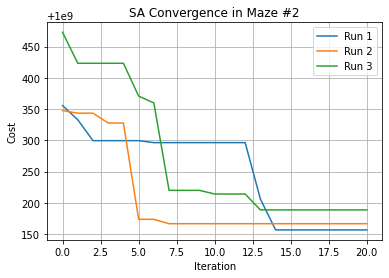

Final Costs for SA: [1000000156.6405408, 1000000166.5858498, 1000000188.6357841]
 Min= 1000000156.6405
 Max= 1000000188.6358
 Mean= 1000000170.6207
 Std= 13.3700

--- ABC multi-run analysis ---


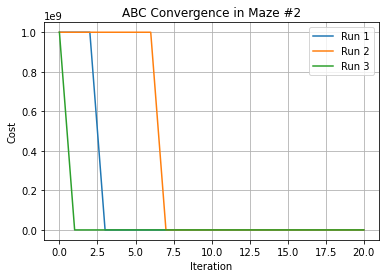

Final Costs for ABC: [144.29490095776512, 131.45773883710876, 132.82520830071167]
 Min= 131.4577
 Max= 144.2949
 Mean= 136.1926
 Std= 5.7563

--- Synergy multi-run analysis ---


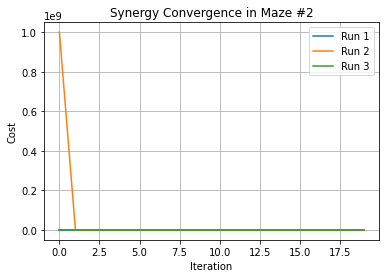

Final Costs for Synergy: [126.96831403786325, 117.17404894564396, 125.70855061343809]
 Min= 117.1740
 Max= 126.9683
 Mean= 123.2836
 Std= 4.3506


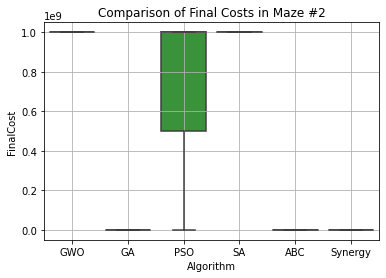

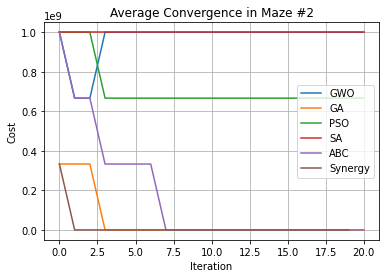


Animating best paths for Maze #2 ...
Avg iteration time per frame: nan s in Maze #2


/Users/gokturkdede/opt/anaconda3/lib/python3.9/site-packages/numpy/core/fromnumeric.py:3419: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/Users/gokturkdede/opt/anaconda3/lib/python3.9/site-packages/numpy/core/_methods.py:188: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)



Computing best-known path for Maze #2 using synergy with 200 iters...
Best-known cost found= 115.9283


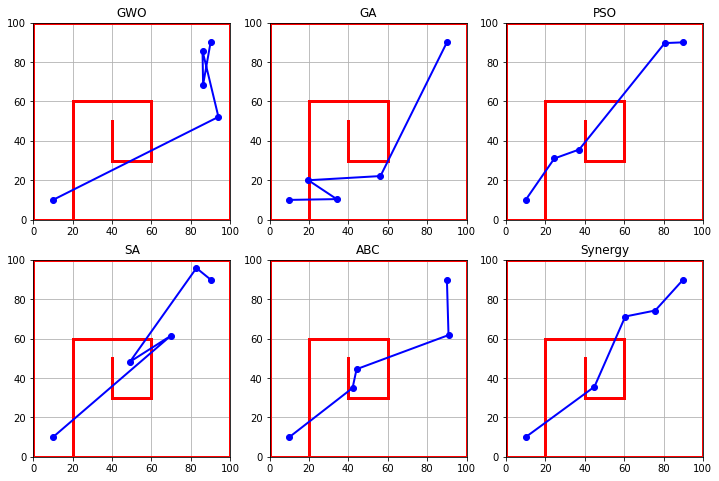

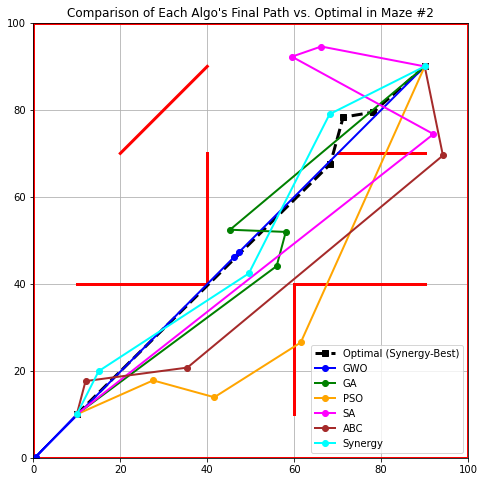


=== Maze: Maze #3 ===

--- GWO multi-run analysis ---


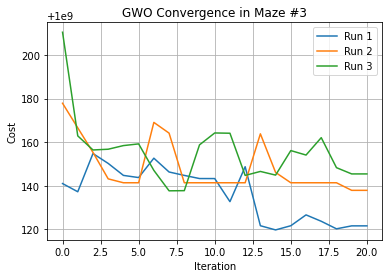

Final Costs for GWO: [1000000121.6684465, 1000000137.9461215, 1000000145.4726622]
 Min= 1000000121.6684
 Max= 1000000145.4727
 Mean= 1000000135.0291
 Std= 9.9345

--- GA multi-run analysis ---


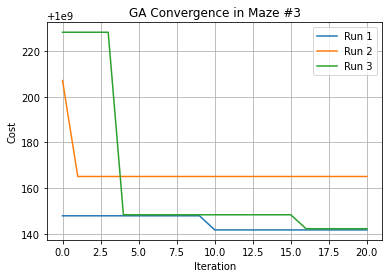

Final Costs for GA: [1000000141.8145939, 1000000165.1461048, 1000000142.3367608]
 Min= 1000000141.8146
 Max= 1000000165.1461
 Mean= 1000000149.7658
 Std= 10.8776

--- PSO multi-run analysis ---


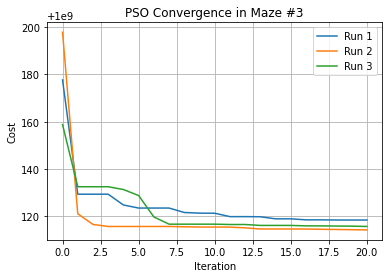

Final Costs for PSO: [1000000118.4353173, 1000000114.2625598, 1000000115.72292]
 Min= 1000000114.2626
 Max= 1000000118.4353
 Mean= 1000000116.1403
 Std= 1.7289

--- SA multi-run analysis ---


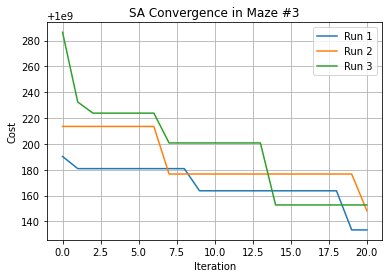

Final Costs for SA: [1000000133.3974646, 1000000148.1878825, 1000000152.740563]
 Min= 1000000133.3975
 Max= 1000000152.7406
 Mean= 1000000144.7753
 Std= 8.2572

--- ABC multi-run analysis ---


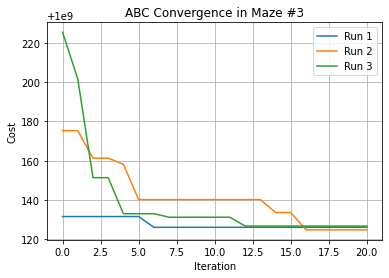

Final Costs for ABC: [1000000126.0373983, 1000000124.7019194, 1000000126.6599458]
 Min= 1000000124.7019
 Max= 1000000126.6599
 Mean= 1000000125.7998
 Std= 0.8168

--- Synergy multi-run analysis ---


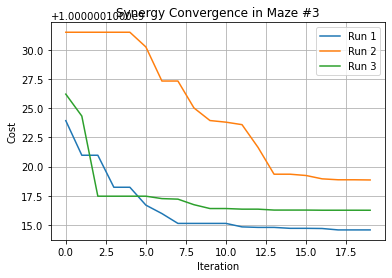

Final Costs for Synergy: [1000000114.58465, 1000000118.859098, 1000000116.2677262]
 Min= 1000000114.5847
 Max= 1000000118.8591
 Mean= 1000000116.5705
 Std= 1.7581


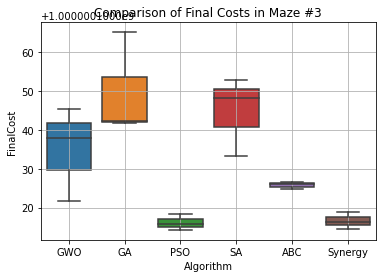

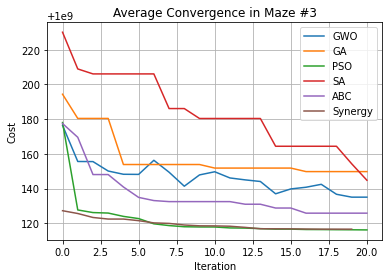


Animating best paths for Maze #3 ...
Avg iteration time per frame: nan s in Maze #3


/Users/gokturkdede/opt/anaconda3/lib/python3.9/site-packages/numpy/core/fromnumeric.py:3419: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/Users/gokturkdede/opt/anaconda3/lib/python3.9/site-packages/numpy/core/_methods.py:188: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)



Computing best-known path for Maze #3 using synergy with 200 iters...
Best-known cost found= 1000000116.8288


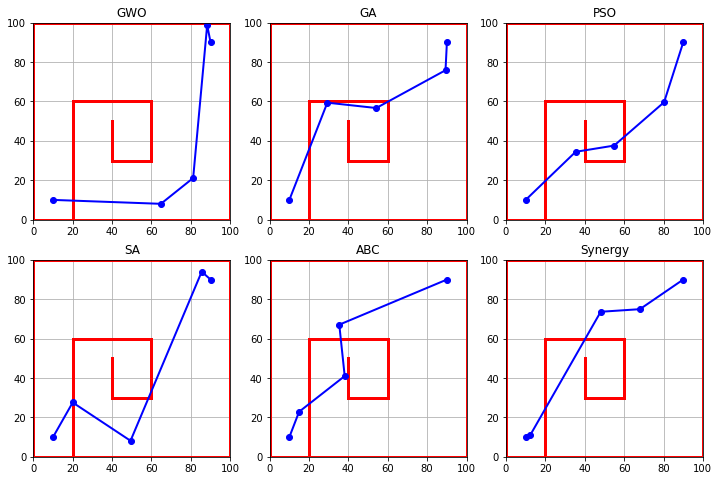

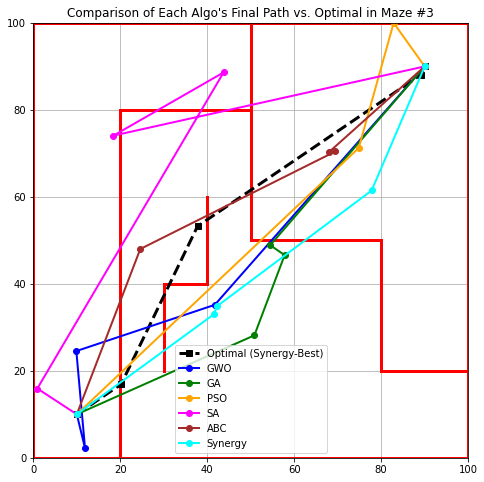

In [16]:
###############################################################################
# 0) JUPYTER NOTEBOOK SETUP
###############################################################################
%matplotlib inline

import numpy as np
import random
import time
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.animation as animation
import seaborn as sns
from IPython.display import HTML

###############################################################################
# 1) GLOBAL SETTINGS
###############################################################################
NUM_RUNS         = 3        # multi-run for final cost distribution
MAX_ITERS        = 20       # iterations each run
BIG_ITER_FOR_OPT = 200      # large synergy run to get best-known path
N_WAYPOINTS      = 5        # path size
START_POINT      = (10,10)
END_POINT        = (90,90)

random.seed(42)
np.random.seed(42)

# We'll define THREE labyrinth structures. Each is a list of line segments
# Each line segment is ((x1,y1),(x2,y2)).
# We'll ensure there's a feasible path in each.

LABYRINTHS = []

# 1) Maze #1 (simple, bounding + some internal walls)
LABYRINTH_1 = [
    # bounding
    ((0,0),(0,100)),
    ((0,100),(100,100)),
    ((100,100),(100,0)),
    ((100,0),(0,0)),
    # internal
    ((20,0),(20,60)),
    ((20,60),(60,60)),
    ((60,60),(60,30)),
    ((40,30),(60,30)),
    ((40,30),(40,50)),
]
LABYRINTHS.append(LABYRINTH_1)

# 2) Maze #2 (more complex, with multiple corridors)
LABYRINTH_2 = [
    # bounding
    ((0,0),(0,100)),
    ((0,100),(100,100)),
    ((100,100),(100,0)),
    ((100,0),(0,0)),

    # internal horizontal lines
    ((10,40),(40,40)),
    ((60,40),(90,40)),
    # vertical lines
    ((40,40),(40,70)),
    ((60,10),(60,40)),
    # some diagonal or offset lines
    ((20,70),(40,90)),
    ((70,70),(90,70))
]
LABYRINTHS.append(LABYRINTH_2)

# 3) Maze #3 (even bigger set of lines, aiming to look "realistic")
LABYRINTH_3 = [
    # bounding
    ((0,0),(0,100)),
    ((0,100),(100,100)),
    ((100,100),(100,0)),
    ((100,0),(0,0)),

    # a "grid-like" structure inside
    ((20,0),(20,80)),
    ((20,80),(50,80)),
    ((50,80),(50,100)),  # touches bounding
    ((50,80),(50,50)),
    ((50,50),(80,50)),
    ((80,50),(80,20)),
    ((80,20),(100,20)),

    # some smaller corridors
    ((30,20),(30,40)),
    ((30,40),(40,40)),
    ((40,40),(40,60))
]
LABYRINTHS.append(LABYRINTH_3)

CURVATURE_ANGLE_DEG= 30.0

###############################################################################
# 2) LABYRINTH COLLISION CHECK
###############################################################################
def segment_intersects_segment(p1, p2, q1, q2):
    """
    Return True if line segments p1->p2 and q1->q2 intersect or even touch.
    """
    p1= np.array(p1,dtype=float)
    p2= np.array(p2,dtype=float)
    q1= np.array(q1,dtype=float)
    q2= np.array(q2,dtype=float)

    def orientation(a,b,c):
        val= (b[1]-a[1])*(c[0]-b[0]) - (b[0]-a[0])*(c[1]-b[1])
        if abs(val)<1e-12:
            return 0
        return 1 if val>0 else 2

    def on_segment(a,b,c):
        if min(a[0],c[0])<= b[0]<= max(a[0],c[0]) and min(a[1],c[1])<= b[1]<= max(a[1],c[1]):
            return True
        return False

    o1= orientation(p1,p2,q1)
    o2= orientation(p1,p2,q2)
    o3= orientation(q1,q2,p1)
    o4= orientation(q1,q2,p2)

    if o1!= o2 and o3!= o4:
        return True
    if o1==0 and on_segment(p1,q1,p2): return True
    if o2==0 and on_segment(p1,q2,p2): return True
    if o3==0 and on_segment(q1,p1,q2): return True
    if o4==0 and on_segment(q1,p2,q2): return True
    return False

def path_intersects_labyrinth(path, walls):
    """
    Return True if path intersects or touches any segment in 'walls'.
    """
    for i in range(len(path)-1):
        a1= path[i]
        a2= path[i+1]
        for (b1,b2) in walls:
            if segment_intersects_segment(a1,a2,b1,b2):
                return True
    return False

###############################################################################
# 3) COST FUNCTION
###############################################################################
def clip_path(path):
    path[0]= START_POINT
    path[-1]= END_POINT
    for i in range(1,len(path)-1):
        path[i,0]= np.clip(path[i,0],0,100)
        path[i,1]= np.clip(path[i,1],0,100)
    return path

def path_cost_function(path, walls):
    """
    Return (total_cost, dist_sum, penalty).
    If path intersects any 'walls', penalty +=1e9
    If curvature angle <30 => +200
    total_cost= dist_sum + penalty
    """
    dist_sum= 0.0
    for i in range(len(path)-1):
        dist_sum+= np.linalg.norm(path[i+1]- path[i])

    penalty= 0.0
    if path_intersects_labyrinth(path, walls):
        penalty+= 1e9

    angle_thresh= np.deg2rad(CURVATURE_ANGLE_DEG)
    for i in range(1,len(path)-1):
        v1= path[i]- path[i-1]
        v2= path[i+1]- path[i]
        n1= np.linalg.norm(v1)
        n2= np.linalg.norm(v2)
        if n1>1e-9 and n2>1e-9:
            cos_th= np.dot(v1,v2)/(n1*n2)
            cos_th= np.clip(cos_th,-1,1)
            angle= np.arccos(cos_th)
            if angle< angle_thresh:
                penalty+= 200

    total= dist_sum+ penalty
    return (total, dist_sum, penalty)

def create_random_path():
    path= []
    path.append([START_POINT[0],START_POINT[1]])
    for _ in range(N_WAYPOINTS-2):
        x= random.uniform(0,100)
        y= random.uniform(0,100)
        path.append([x,y])
    path.append([END_POINT[0],END_POINT[1]])
    return np.array(path,dtype=float)

###############################################################################
# 4) We'll define each meta-heuristic as a class that references the current labyrinth walls
###############################################################################
class GWO:
    def __init__(self, pop_size=10, labyrinth=None):
        self.pop_size= pop_size
        self.labyrinth= labyrinth  # reference to current walls
        self.paths= [create_random_path() for _ in range(pop_size)]
        self.fitness= [float('inf')]*pop_size
        self.alpha_path= None
        self.alpha_fit= float('inf')

    def path_cost(self, path):
        path= clip_path(path)
        tot,dist,pen= path_cost_function(path, self.labyrinth)
        return tot

    def update_alpha(self):
        idx= np.argmin(self.fitness)
        self.alpha_path= self.paths[idx].copy()
        self.alpha_fit= self.fitness[idx]

    def optimize(self, max_iter=1):
        cost_log=[]
        for i in range(self.pop_size):
            if self.fitness[i]== float('inf'):
                self.fitness[i]= self.path_cost(self.paths[i])
        self.update_alpha()
        cost_log.append(self.alpha_fit)

        for it in range(max_iter):
            a= 2- 2*((it+1)/max_iter)
            if a<0: a=0
            for i in range(self.pop_size):
                wolf= self.paths[i].copy()
                for w in range(1,N_WAYPOINTS-1):
                    r1,r2= np.random.rand(), np.random.rand()
                    A= 2*a*r1 - a
                    C= 2*r2
                    if self.alpha_path is not None:
                        D= np.abs(C*self.alpha_path[w] - wolf[w])
                        wolf[w]= self.alpha_path[w] - A*D
                wolf= clip_path(wolf)
                tot= self.path_cost(wolf)
                self.paths[i]= wolf
                self.fitness[i]= tot
            self.update_alpha()
            cost_log.append(self.alpha_fit)
        return cost_log, self.alpha_path, self.alpha_fit

# similarly for GA, PSO, SA, ABC

class GA:
    def __init__(self, pop_size=10, cr=0.8, mr=0.1, labyrinth=None):
        self.pop_size= pop_size
        self.cr= cr
        self.mr= mr
        self.labyrinth= labyrinth
        self.population= [create_random_path() for _ in range(pop_size)]
        self.fitness= [float('inf')]* pop_size
        self.best_path= None
        self.best_fit= float('inf')

    def path_cost(self,path):
        path= clip_path(path)
        tot,_,_= path_cost_function(path,self.labyrinth)
        return tot

    def crossover(self,p1,p2):
        if random.random()< self.cr and (N_WAYPOINTS>2):
            idx= random.randint(1,N_WAYPOINTS-2)
            o1= np.vstack([p1[:idx], p2[idx:]])
            o2= np.vstack([p2[:idx], p1[idx:]])
            return o1,o2
        return p1.copy(), p2.copy()

    def mutate(self,path):
        mp= path.copy()
        for w in range(1,N_WAYPOINTS-1):
            if random.random()< self.mr:
                mp[w,0]= random.uniform(0,100)
                mp[w,1]= random.uniform(0,100)
        mp= clip_path(mp)
        return mp

    def optimize(self,max_iter=1):
        cost_log=[]
        for i in range(self.pop_size):
            if self.fitness[i]==float('inf'):
                c= self.path_cost(self.population[i])
                self.fitness[i]= c
                if c< self.best_fit:
                    self.best_fit= c
                    self.best_path= self.population[i].copy()
        cost_log.append(self.best_fit)

        for it in range(max_iter):
            new_pop=[]
            best_idx= np.argmin(self.fitness)
            new_pop.append(self.population[best_idx].copy())

            while len(new_pop)< self.pop_size:
                i1= random.randint(0,self.pop_size-1)
                i2= random.randint(0,self.pop_size-1)
                o1,o2= self.crossover(self.population[i1], self.population[i2])
                o1= self.mutate(o1)
                o2= self.mutate(o2)
                new_pop.append(o1)
                if len(new_pop)< self.pop_size:
                    new_pop.append(o2)

            self.population= new_pop
            self.fitness= []
            for p in new_pop:
                t= self.path_cost(p)
                self.fitness.append(t)
            idx= np.argmin(self.fitness)
            if self.fitness[idx]< self.best_fit:
                self.best_fit= self.fitness[idx]
                self.best_path= self.population[idx].copy()
            cost_log.append(self.best_fit)
        return cost_log, self.best_path, self.best_fit

class PSO:
    def __init__(self, pop_size=10, w=0.5, c1=1.0, c2=1.0, labyrinth=None):
        self.pop_size= pop_size
        self.w= w
        self.c1= c1
        self.c2= c2
        self.labyrinth= labyrinth
        self.positions= [create_random_path() for _ in range(pop_size)]
        self.vels= [np.zeros((N_WAYPOINTS,2)) for _ in range(pop_size)]
        self.fitness= [float('inf')]* pop_size
        self.pbest= [p.copy() for p in self.positions]
        self.pbest_fit= [float('inf')]* pop_size
        self.gbest= None
        self.gbest_fit= float('inf')

    def path_cost(self,path):
        path= clip_path(path)
        tot,ds,pp= path_cost_function(path,self.labyrinth)
        return tot

    def update_gbest(self):
        idx= np.argmin(self.fitness)
        if self.fitness[idx]< self.gbest_fit:
            self.gbest_fit= self.fitness[idx]
            self.gbest= self.positions[idx].copy()

    def optimize(self,max_iter=1):
        cost_log=[]
        for i in range(self.pop_size):
            if self.fitness[i]== float('inf'):
                c= self.path_cost(self.positions[i])
                self.fitness[i]= c
                self.pbest_fit[i]= c
                self.pbest[i]= self.positions[i].copy()
                if c< self.gbest_fit:
                    self.gbest_fit= c
                    self.gbest= self.positions[i].copy()
        cost_log.append(self.gbest_fit)

        for it in range(max_iter):
            for i in range(self.pop_size):
                for w in range(1,N_WAYPOINTS-1):
                    r1,r2= np.random.rand(), np.random.rand()
                    inertia= self.w*self.vels[i][w]
                    cog= self.c1*r1*(self.pbest[i][w]- self.positions[i][w])
                    soc= self.c2*r2*(self.gbest[w]- self.positions[i][w])
                    new_vel= inertia+ cog+ soc
                    new_pos= self.positions[i][w]+ new_vel
                    new_pos= np.clip(new_pos,0,100)
                    self.vels[i][w]= new_vel
                    self.positions[i][w]= new_pos
                c= self.path_cost(self.positions[i])
                self.fitness[i]= c
                if c< self.pbest_fit[i]:
                    self.pbest_fit[i]= c
                    self.pbest[i]= self.positions[i].copy()
            self.update_gbest()
            cost_log.append(self.gbest_fit)
        return cost_log, self.gbest, self.gbest_fit

class SA:
    def __init__(self, labyrinth=None, init_temp=1000, alpha=0.9):
        self.labyrinth= labyrinth
        self.path= create_random_path()
        self.cost= float('inf')
        self.best_path= None
        self.best_cost= float('inf')
        self.T= init_temp
        self.alpha= alpha

    def path_cost(self,path):
        path= clip_path(path)
        tot,_,_= path_cost_function(path,self.labyrinth)
        return tot

    def optimize(self,max_iter=1):
        cost_log=[]
        if self.cost== float('inf'):
            c= self.path_cost(self.path)
            self.cost= c
            self.best_cost= c
            self.best_path= self.path.copy()
        cost_log.append(self.best_cost)

        for it in range(max_iter):
            npath= self.path.copy()
            if N_WAYPOINTS>2:
                w= random.randint(1,N_WAYPOINTS-2)
                npath[w,0]= random.uniform(0,100)
                npath[w,1]= random.uniform(0,100)
            npath= clip_path(npath)
            c= self.path_cost(npath)
            delta= c- self.cost
            if delta<0:
                self.path= npath
                self.cost= c
            else:
                prob= np.exp(-delta/self.T)
                if random.random()< prob:
                    self.path= npath
                    self.cost= c
            if self.cost< self.best_cost:
                self.best_cost= self.cost
                self.best_path= self.path.copy()
            self.T*= self.alpha
            cost_log.append(self.best_cost)
        return cost_log, self.best_path, self.best_cost


class ABC:
    def __init__(self, labyrinth=None, pop_size=10, limit=5):
        self.labyrinth= labyrinth
        self.pop_size= pop_size
        self.limit= limit
        self.foods= [create_random_path() for _ in range(pop_size)]
        self.fitness= [float('inf')]* pop_size
        self.trials= [0]* pop_size
        self.best_path= None
        self.best_cost= float('inf')

    def path_cost(self,path):
        path= clip_path(path)
        tot,_,_= path_cost_function(path,self.labyrinth)
        return tot

    def optimize(self,max_iter=1):
        cost_log=[]
        for i in range(self.pop_size):
            if self.fitness[i]== float('inf'):
                c= self.path_cost(self.foods[i])
                self.fitness[i]= c
                if c< self.best_cost:
                    self.best_cost= c
                    self.best_path= self.foods[i].copy()
        cost_log.append(self.best_cost)

        for it in range(max_iter):
            # Employed
            for i in range(self.pop_size):
                cand= self.foods[i].copy()
                if N_WAYPOINTS>2:
                    w= random.randint(1,N_WAYPOINTS-2)
                    cand[w,0]= random.uniform(0,100)
                    cand[w,1]= random.uniform(0,100)
                cand= clip_path(cand)
                cc= self.path_cost(cand)
                if cc< self.fitness[i]:
                    self.foods[i]= cand
                    self.fitness[i]= cc
                    self.trials[i]=0
                else:
                    self.trials[i]+=1
                if cc< self.best_cost:
                    self.best_cost= cc
                    self.best_path= cand.copy()
            # scout
            for i in range(self.pop_size):
                if self.trials[i]> self.limit:
                    newp= create_random_path()
                    c2= self.path_cost(newp)
                    self.foods[i]= newp
                    self.fitness[i]= c2
                    self.trials[i]=0
                    if c2< self.best_cost:
                        self.best_cost= c2
                        self.best_path= newp.copy()
            cost_log.append(self.best_cost)
        return cost_log, self.best_path, self.best_cost

###############################################################################
# 5) SYNERGYHUB: merges GWO, GA, PSO, SA, ABC for a labyrinth
###############################################################################
class SynergyHybrid:
    """
    For a given labyrinth, merges GWO, GA, PSO, SA, ABC each iteration.
    """
    def __init__(self, labyrinth):
        self.gwo= GWO(labyrinth=labyrinth)
        self.ga = GA(labyrinth=labyrinth)
        self.pso= PSO(labyrinth=labyrinth)
        self.sa = SA(labyrinth=labyrinth)
        self.abc= ABC(labyrinth=labyrinth)
        self.best_path= None
        self.best_cost= float('inf')

    def optimize(self, max_iter=1):
        cost_log=[]
        for it in range(max_iter):
            gwo_log,gwoP,gwoC= self.gwo.optimize(1)
            ga_log, gaP, gaC  = self.ga.optimize(1)
            pso_log,psoP,psoC= self.pso.optimize(1)
            sa_log, saP, saC  = self.sa.optimize(1)
            abc_log,abcP,abcC= self.abc.optimize(1)

            local= [
                ("GWO",gwoP,gwoC),
                ("GA", gaP,gaC),
                ("PSO",psoP,psoC),
                ("SA", saP,saC),
                ("ABC",abcP,abcC)
            ]
            local.sort(key=lambda x:x[2])
            if local[0][2]< self.best_cost:
                self.best_cost= local[0][2]
                self.best_path= local[0][1].copy()

            # partial re-init
            best3= local[:3]
            best_paths= [bp[1] for bp in best3]

            # GWO partial
            idxs_worst= np.argsort(self.gwo.fitness)[::-1]
            for i,bp in enumerate(best_paths):
                if i< len(idxs_worst):
                    c= self.gwo.path_cost(bp)
                    self.gwo.paths[idxs_worst[i]]= bp.copy()
                    self.gwo.fitness[idxs_worst[i]]= c
            self.gwo.update_alpha()

            # GA partial
            idxs_ga= np.argsort(self.ga.fitness)[::-1]
            for i,bp in enumerate(best_paths):
                if i< len(idxs_ga):
                    c2= self.ga.path_cost(bp)
                    self.ga.population[idxs_ga[i]]= bp.copy()
                    self.ga.fitness[idxs_ga[i]]= c2
                    if c2< self.ga.best_fit:
                        self.ga.best_fit= c2
                        self.ga.best_path= bp.copy()

            # PSO partial
            idxs_pso= np.argsort(self.pso.fitness)[::-1]
            for i,bp in enumerate(best_paths):
                if i< len(idxs_pso):
                    tot= self.pso.path_cost(bp)
                    self.pso.positions[idxs_pso[i]]= bp.copy()
                    self.pso.fitness[idxs_pso[i]]= tot
                    if tot< self.pso.pbest_fit[idxs_pso[i]]:
                        self.pso.pbest_fit[idxs_pso[i]]= tot
                        self.pso.pbest[idxs_pso[i]]= bp.copy()
            self.pso.update_gbest()

            # SA partial
            bestLocal= best3[0][1]
            bestLocalCost= self.sa.path_cost(bestLocal)
            if bestLocalCost< self.sa.cost:
                self.sa.path= bestLocal.copy()
                self.sa.cost= bestLocalCost
                if bestLocalCost< self.sa.best_cost:
                    self.sa.best_cost= bestLocalCost
                    self.sa.best_path= bestLocal.copy()

            # ABC partial
            idxs_abc= np.argsort(self.abc.fitness)[::-1]
            for i,bp in enumerate(best_paths):
                if i< len(idxs_abc):
                    tot2= self.abc.path_cost(bp)
                    self.abc.foods[idxs_abc[i]]= bp.copy()
                    self.abc.fitness[idxs_abc[i]]= tot2
                    if tot2< self.abc.best_cost:
                        self.abc.best_cost= tot2
                        self.abc.best_path= bp.copy()

            cost_log.append(self.best_cost)
        return cost_log, self.best_path, self.best_cost

###############################################################################
# 6) HELPER: Evaluate a set of algorithms for a labyrinth
###############################################################################
def run_and_analyze_algos(labyrinth, labyrinth_name):
    """
    1) For each algorithm, do multi-run with 'labyrinth' as walls.
    2) Show convergence plots, box plots, average convergence.
    3) Animate best paths.
    4) Also compute 'optimal' path with large synergy run. 
    5) Compare each final path to that best-known path.
    """
    # define algo_dict
    def mk_gwo():
        return GWO(labyrinth=labyrinth)
    def mk_ga():
        return GA(labyrinth=labyrinth)
    def mk_pso():
        return PSO(labyrinth=labyrinth)
    def mk_sa():
        return SA(labyrinth=labyrinth)
    def mk_abc():
        return ABC(labyrinth=labyrinth)
    def mk_synergy():
        return SynergyHybrid(labyrinth)

    algo_dict= {
        "GWO": mk_gwo,
        "GA": mk_ga,
        "PSO": mk_pso,
        "SA": mk_sa,
        "ABC": mk_abc,
        "Synergy": mk_synergy
    }

    final_costs_map={}
    cost_logs_map={}

    # A) multi-run analysis
    print(f"\n=== Maze: {labyrinth_name} ===")
    for algo_name, factory in algo_dict.items():
        print(f"\n--- {algo_name} multi-run analysis ---")
        results= run_algorithm(factory, n_runs=NUM_RUNS, max_iter=MAX_ITERS)
        c_runs=[]
        c_finals=[]
        for (c_log, path, cost) in results:
            c_runs.append(c_log)
            c_finals.append(cost)
        cost_logs_map[algo_name]= c_runs
        final_costs_map[algo_name]= c_finals

        # Convergence plots
        plt.figure()
        for i,c_log in enumerate(c_runs):
            plt.plot(range(len(c_log)), c_log, label=f"Run {i+1}")
        plt.title(f"{algo_name} Convergence in {labyrinth_name}")
        plt.xlabel("Iteration")
        plt.ylabel("Cost")
        plt.legend()
        plt.grid(True)
        plt.show()

        print(f"Final Costs for {algo_name}:", c_finals)
        print(f" Min= {min(c_finals):.4f}")
        print(f" Max= {max(c_finals):.4f}")
        print(f" Mean= {np.mean(c_finals):.4f}")
        print(f" Std= {np.std(c_finals):.4f}")

    # box plot
    data=[]
    for algo, cost_list in final_costs_map.items():
        for c in cost_list:
            data.append([algo,c])
    df= pd.DataFrame(data, columns=["Algorithm","FinalCost"])
    plt.figure()
    sns.boxplot(x="Algorithm",y="FinalCost", data=df)
    plt.title(f"Comparison of Final Costs in {labyrinth_name}")
    plt.grid(True)
    plt.show()

    # average conv
    plt.figure()
    for algo_name, runs in cost_logs_map.items():
        max_len= max(len(x) for x in runs)
        arr_list=[]
        for c_log in runs:
            if len(c_log)< max_len:
                c_log= c_log+[c_log[-1]]*(max_len-len(c_log))
            arr_list.append(c_log)
        arr= np.array(arr_list)
        avg_curve= np.mean(arr,axis=0)
        plt.plot(range(max_len), avg_curve, label=algo_name)
    plt.title(f"Average Convergence in {labyrinth_name}")
    plt.xlabel("Iteration")
    plt.ylabel("Cost")
    plt.legend()
    plt.grid(True)
    plt.show()

    # B) Animate
    print(f"\nAnimating best paths for {labyrinth_name} ...")
    ani, iteration_times= animate_algorithms_path(algo_dict, max_iter=15)
    avg_t= np.mean(iteration_times)
    print(f"Avg iteration time per frame: {avg_t:.4f} s in {labyrinth_name}")
    display(animation_to_html(ani))

    # C) Compute an "optimal" path with synergy + large iteration
    print(f"\nComputing best-known path for {labyrinth_name} using synergy with {BIG_ITER_FOR_OPT} iters...")
    synergy_big= SynergyHybrid(labyrinth)
    c_log_opt,bp_opt,cost_opt= synergy_big.optimize(BIG_ITER_FOR_OPT)
    print(f"Best-known cost found= {cost_opt:.4f}")

    # D) Compare final best path of each algorithm to optimal
    final_paths= {}
    for algo_name, factory in algo_dict.items():
        algo= factory()
        c_log,b_path,b_cost= algo.optimize(MAX_ITERS)
        final_paths[algo_name]= b_path.copy()

    # Overlay
    plt.figure(figsize=(8,8))
    plt.title(f"Comparison of Each Algo's Final Path vs. Optimal in {labyrinth_name}")
    plt.xlim([0,100])
    plt.ylim([0,100])
    plt.gca().set_aspect('equal','box')
    plt.grid(True)

    # labyrinth walls
    for (seg1,seg2) in labyrinth:
        xdat= [seg1[0],seg2[0]]
        ydat= [seg1[1],seg2[1]]
        plt.plot(xdat, ydat,'r-', lw=3)

    # Plot optimal path in black
    plt.plot(bp_opt[:,0], bp_opt[:,1], 'k--', lw=3, marker='s', label="Optimal (Synergy-Best)")

    # Plot each algo
    color_list= ["blue","green","orange","magenta","brown","cyan","purple","gray"]
    i=0
    for algo_name in algo_dict.keys():
        path= final_paths[algo_name]
        c= color_list[i% len(color_list)]
        plt.plot(path[:,0], path[:,1], marker='o', color=c, lw=2, label=algo_name)
        i+=1
    plt.legend()
    plt.show()


###############################################################################
# 7) MAIN: RUN FOR THREE DIFFERENT LABYRINTHS
###############################################################################
def main():
    # We'll run the entire process for labyrinth1, labyrinth2, labyrinth3
    labyrinth_names= ["Maze #1","Maze #2","Maze #3"]
    for idx,lab in enumerate(LABYRINTHS):
        run_and_analyze_algos(lab, labyrinth_names[idx])

main()